In [1]:
%matplotlib inline
from shapes2 import *
import cv2 as cv2

In [2]:
from sklearn.preprocessing import MinMaxScaler
# load data

def standardize(data):
# create scaler
    scaler = MinMaxScaler(feature_range=(-.5,0.5))
    # fit scaler on data
    scaler.fit(data)
    # apply transform
    normalized = scaler.transform(data)
    return normalized

In [3]:


# Set random seed for reproducibility
manualSeed = 9
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
np.random.rand(3,3)

Random Seed:  9


array([[0.28625815, 0.38431584, 0.64981226],
       [0.04568296, 0.96035531, 0.69292428],
       [0.07478568, 0.87317892, 0.67900951]])

modell(noise_2)

Discriminator Code



Now, as with the generator, we can create the discriminator, apply the
``weights_init`` function, and print the model’s structure.




## Defining the important newly written functions


In [4]:
# def filter_generated_image(batch_size,nz):
#     noise_test = torch.randn(batch_size, nz, 1, 1, device=device)
#     test=netG(noise_test).cpu().detach().numpy()[np.random.randint(0,127)].reshape(128,128)
#     #img1[img1==-1]=0
#     test_filtered= median_filter(test,size=(2,2))
#     threshold_global_otsu = 0
#     segmented_image= (test_filtered >threshold_global_otsu).astype(np.int32)
#     segmented_image=segmented_image.astype(np.int8)
#     print(np.unique(segmented_image))
#     porousity=statistics(segmented_image)
#     #test1_final = median_filter(test1_final,size=(3,3))
#     return segmented_image,porousity
def post_processing(img_gen):
    test_filtered= median_filter(img_gen,size=(2,2))
    threshold_global_otsu = 0
    segmented_image= (test_filtered >threshold_global_otsu).astype(np.int32)
    segmented_image=segmented_image.astype(np.int8)
    return segmented_image
def normalize(values, bounds):
    return [bounds['desired']['lower'] + (x - bounds['actual']['lower']) * (bounds['desired']['upper'] - bounds['desired']['lower']) / (bounds['actual']['upper'] - bounds['actual']['lower']) for x in values]

def contour_plot_real_and_extracted(num,batch_size,nz):
    count=0
    for index in range(num):
        img_gen,porousity=filter_generated_image(batch_size,nz)
        img=img_gen.astype(np.uint8)## This is for comparing the input original image and extracted boundaries; It plots original and extracted image side by side.
        #imgray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        #ret,thresh=cv2.threshold(imgray,0,1,cv2.THRESH_BINARY)
        stats=statistics(img)
        contours,hierarchy=cv2.findContours(img,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
        #edged = cv2.Canny(imgray, 50, 100)
        #edged = cv2.dilate(edged, None, iterations=1)
        #contours,hierarchy=cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        print('number of contours in the image are', len(contours))
        #cv2.imshow('image',img )
        #cv2.waitKey(0)## these are basically for opening a new window for the image
        #cv2.destroyAllWindows()
        #if len(contours)!=2:
            #impad = cv2.copyMakeBorder(img,1,1,1,1,cv2.BORDER_CONSTANT)
            #contours,hierarchy=cv2.findContours(impad,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
            #print('im inside padding with length of contours', len(contours))
        
        
        ########
        
        if len(contours)==2:
            x=contours[1][:,:,0].reshape(-1)
            y=contours[1][:,:,1].reshape(-1)
            y=128-y
        elif len(contours)==1:
            x=contours[0][:,:,0].reshape(-1)
            y=contours[0][:,:,1].reshape(-1)
            y=128-y
            ##########
            
        porous=np.trapz(y,x)/(128*128)
        if porous<0:
            
            count+=1
            continue
        #else:
         #   count+=1
          #  continue

        #y=128-y ## to account for the difference in imshow image pixels matrix and numpy plots
        fig,ax=plt.subplots(1,2)
        ax[0].grid(False)
        ax[0].axis('equal')
        ax[0].axis('square')

        # Hide axes ticks
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        ax[0].set_xlim([0,128])
        ax[0].set_ylim([0,128])
        #axis[0].set_ylim(axis[0].get_ylim()[::-1])
        ax[0].plot(x,y)
        ax[1].grid(False)
        ax[1].imshow(img,cmap='gray')
        #porous=np.trapz(y,x)/(128*128)
        print('The area covering is ',np.trapz(y,x))
        print('The porousity is ',porous)
        print('the original image shape is ',img.shape)
        print('the original porousity is ',stats)
       
    print('The fraction of not-suitable images are {}'.format(float(count/num)))


    
    

In [5]:
def contour_retriever(img_gen):
        porousity_gen=statistics(img_gen)
        img=img_gen.astype(np.uint8)## This is for comparing the input original image and extracted boundaries; It plots original and extracted image side by side.
        #imgray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        #ret,thresh=cv2.threshold(imgray,0,1,cv2.THRESH_BINARY)
        
        print('the porousity before extraction is ',porousity_gen)
        contours,hierarchy=cv2.findContours(img,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
        #edged = cv2.Canny(imgray, 50, 100)
        #edged = cv2.dilate(edged, None, iterations=1)
        #contours,hierarchy=cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        print('number of contours in the image are', len(contours))
        #cv2.imshow('image',img )
        #cv2.waitKey(0)## these are basically for opening a new window for the image
        #cv2.destroyAllWindows()
        #if len(contours)!=2:
            #impad = cv2.copyMakeBorder(img,1,1,1,1,cv2.BORDER_CONSTANT)
            #contours,hierarchy=cv2.findContours(impad,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
            #print('im inside padding with length of contours', len(contours))
        
        x,y=[],[]
        ########
        #for num in range(len(contours)):
            #x=contours[num][:,:,0].reshape(-1)
            #y=contours[num][:,:,1].reshape(-1)
            #y=128-y
            #porousity=abs(np.trapz(y,x)/(128*128))
            #plt.figure()
            #plt.plot(x,y)
            #print('porous of contour {} is {}'.format(num,porousity))
            #if porousity <0.6 and porousity>0.4:
             #   return porousity,x,y
        #return None,None,None
            
            
        
        if len(contours)==2:
            x=contours[1][:,:,0].reshape(-1)
            y=contours[1][:,:,1].reshape(-1)
            y=64-y
        #elif len(contours)==1:
            #x=contours[0][:,:,0].reshape(-1)
            #y=contours[0][:,:,1].reshape(-1)
            #y=128-y
            ##########
        print(np.trapz(y,x))
        porousity=np.trapz(y,x)/(64*64)
        return porousity,x,y
## Checking statistics of generated images, which has pixel in the range of (-1 to 1)(last layer activation of tanh in generator)
# def filter_generated_image(batch_size,nz,device,netG):
#     noise_test = torch.randn(batch_size, nz, 1, 1, device=device)
#     test=netG(noise_test)[np.random.randint(0,127)].reshape(1,128,128)
#     #median=MedianPool2d()
#     out_attach=median(test)
#     out_attach=out_attach.detach().cpu().numpy().reshape(128,128)
#     #img1[img1==-1]=0
#     test_filtered= median_filter(out_attach,size=(2,2))
#     threshold_global_otsu = 0
#     segmented_image= (test_filtered >threshold_global_otsu).astype(np.int32)
#     del test_filtered
#     porousity=statistics(segmented_image)
#     #test1_final = median_filter(test1_final,size=(3,3))
#     return segmented_image,porousity,out_attach
#checkpoint=torch.load('my_checkpoints40_final_13_02.pth.tar')
#checkpoint=torch.load('my_checkpoints40_exact1.pth.tar')


#netG.load_state_dict(checkpoint['state_dictG'])
#optimizerG.load_state_dict(checkpoint['optimizerG'])
#netD.load_state_dict(checkpoint['state_dictD'])
#optimizerD.load_state_dict(checkpoint['optimizerD'])
#netG.eval()
#netD.eval()


    

In [6]:
ceh

NameError: name 'ceh' is not defined

In [6]:
def statistics (image):
    image=image.reshape(64,64)
    #img = median_filter(image,size=(2,2))
    #this actually worked better to generate 0.5 images
    #earlier i had tried threshold above0             #without this, it didnt work
    #threshold_global_otsu = threshold_otsu(test1_final)## i'm not using otsu here
    plt.figure()
    plt.imshow(image.reshape(64,64),cmap='gray')
    threshold_global_otsu=0
    segmented_image=image
    #segmented_image = (image> threshold_global_otsu).astype(np.int8)## earlier it was greater than and equals symbol, making it strictly           greater than worked too good
        #plt.imshow(segmented_image)
    #plt.figure()
    #plt.imshow(segmented_image.reshape(64,64))
    white_pixels=np.sum(segmented_image==1)
    black_pixels=np.sum(segmented_image==0)
    porousity=black_pixels/(white_pixels+black_pixels)
    return porousity

for filename in os.listdir(folder_path):
    if filename.endswith('.hdf5'):
        print(filename)
        file_path = os.path.join(folder_path, filename)
        print('yes')
        with h5py.File(file_path, 'r') as f:
            #dataset = f['training_images_for_ccgan/filename']
            data_array = f['data'][()]
            porousity_extracted,x,y=contour_retriever(data_array)
            print(np.unique(data_array))
            stop
            
        

NameError: name 'folder_path' is not defined

In [76]:
import h5py

# Open the HDF5 file
with h5py.File('check14.h5', 'r') as f:
    # List all the groups and datasets in the file
    data_array=f['data'][()]


In [28]:
cd ..

/DATA3/mahadev/structured_code_to_hpc


In [40]:
folder_path = 'training_images_0255_1_decmial_class_imbalance_problem'


for filename in os.listdir(folder_path):
    if filename.endswith('.hdf5'):
        file_path = os.path.join(folder_path, filename)
        with h5py.File(file_path, 'r') as f:
            # extract the dataset from the HDF5 file
            data_array = f['data'][()]
            


KeyboardInterrupt: 

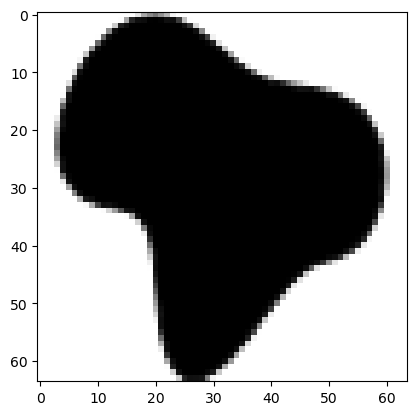

In [41]:
plt.imshow(data_array,cmap='gray')

the porousity before extraction is  0.9984599589322382
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (59, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01278400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01339200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01149500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 9.50033570e-10 7.60026530e-09 4.75015858e-08
  8.55027290e-08 5.70006455e-07]]
Max Re for dp=6e-07is:  0.22739967500123665 0
the test value is  0
[array([44.65654768,  1.0525942 ,  0.        ])]
[44.65654768  1.0525942   0.        ]
[44.65654768  1.0525942   0.        ]
[9.50033732e-07]


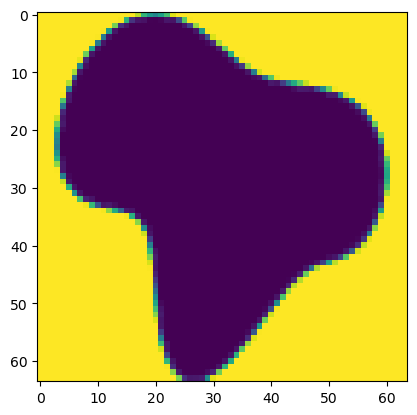

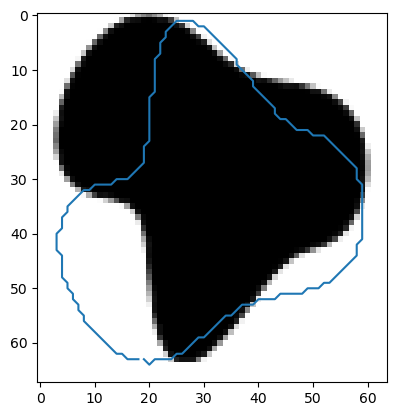

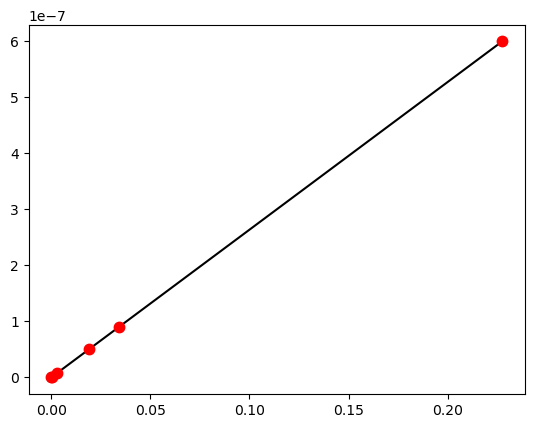

In [42]:
##### Testing one image at a time
import os
import h5py
import numpy as np
dp_lst = [ 0.0000006,.00000005,0.00000009,
       0.000000001, 
       0.000000008]
plt.figure()
plt.imshow(data_array)
porousity_extracted,x,y=contour_retriever(data_array)
plt.plot(x,y)
print('The porousity after extraction is',porousity_extracted)
bounds_x= {'actual': {'lower': 0, 'upper': 64}, 'desired': {'lower': -0.5, 'upper': 0.499}}
bounds_y= {'actual': {'lower': 0, 'upper': 64}, 'desired': {'lower': -0.5, 'upper': 0.499}}
#########################################################################################
## Not every contour extracted is fit for training, only those meeting the following conditions are retained and added to 
## dataset
#if porousity_extracted>0.4 and porousity_extracted<0.6:

print('the original max values of x and y are',(max(x),max(y)))
x_norm=normalize(x,bounds_x)
y_norm=normalize(y,bounds_y)
standard=np.column_stack((x_norm,y_norm))
gen_coords=standard[::-1]
#np.savetxt('shapes/coords_gen/final_check',standard_rev,delimiter=' ')


################################################################################

permu=permeability_finder(gen_coords,mu,dp_lst,6)
print(permu)

In [12]:
folder_path = 'training_images_0255_1_decmial_class_imbalance_problem'
chk=os.listdir(folder_path)
len(chk)

8900

In [18]:
cd ..

/DATA3/mahadev/structured_code_to_hpc


the porousity before extraction is  0.9979633401221996
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01444200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.73003422e-09 1.38402720e-08 8.65017080e-08
  1.55703038e-07 1.03801798e-06]]
Max Re for dp=6e-07is:  0.41410926003888876 0
the test value is  0
[array([1.44371328, 0.57802317, 0.        ])]
[1.44371328 0.57802317 0.        ]
[1.44371328 0.57802317 0.        ]
the porousity before extraction is  0.9938524590163934
number of contours in the image are 2
1951.5
The porousity after extraction is 0.4764404296875
the original max values of x and y are (58, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01552000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01132600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.03133700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01056900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70894291e-09 1.36715445e-08 8.54471490e-08
  1.53804805e-07 1.02536331e-06]]
Max Re for dp=6e-07is:  0.4090607771313612 0
the test value is  0
[array([1.38872949, 0.58515702, 0.        ])]
[1.38872949 0.58515702 0.        ]
[1.38872949 0.58515702 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01520100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01286100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01102900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.92931475e-09 1.54345177e-08 9.64656760e-08
  1.73638298e-07 1.15758706e-06]]
Max Re for dp=6e-07is:  0.46181042147959006 0
the test value is  0
[array([0.65101583, 0.51831879, 0.        ])]
[0.65101583 0.51831879 0.        ]
[0.65101583 0.51831879 0.        ]
the porousity before extraction is  0.9974358974358974
number of contours in the image are 2
1960.0
The porousity after extraction is 0.478515625
the original max values of x and y are (59, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01150600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01251600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01622300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01165400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.71010120e-09 1.36808086e-08 8.55050370e-08
  1.53909070e-07 1.02605886e-06]]
Max Re for dp=6e-07is:  0.4093382614344943 0
the test value is  0
[array([1.02588354, 0.58476072, 0.        ])]
[1.02588354 0.58476072 0.        ]
[1.02588354 0.58476072 0.        ]
the porousity before extraction is  0.9964267483409903
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (62, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01058400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01253600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01216100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.07112663e-09 1.65690045e-08 1.03556298e-07
  1.86401304e-07 1.24267435e-06]]
Max Re for dp=6e-07is:  0.49575533778854125 0
the test value is  0
[array([0.3842991 , 0.48282916, 0.        ])]
[0.3842991  0.48282916 0.        ]
[0.3842991  0.48282916 0.        ]
the porousity before extraction is  0.9969403365629781
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01360900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02037200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01090900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01085800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01250500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.63232903e-09 1.30586288e-08 8.16164590e-08
  1.46909618e-07 9.79395690e-07]]
Max Re for dp=6e-07is:  0.3907223499839347 0
the test value is  0
[array([1.3066915 , 0.61262139, 0.        ])]
[1.3066915  0.61262139 0.        ]
[1.3066915  0.61262139 0.        ]
the porousity before extraction is  0.9994895354772844
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01277600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01280200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01107600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01257800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.84476421e-09 1.47581062e-08 9.22382170e-08
  1.66028738e-07 1.10685709e-06]]
Max Re for dp=6e-07is:  0.44157209156309385 0
the test value is  0
[array([0.63677374, 0.5420747 , 0.        ])]
[0.63677374 0.5420747  0.        ]
[0.63677374 0.5420747  0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (56, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01376400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01132400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01596300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.13354799e-09 9.06838290e-09 5.66773530e-08
  1.02019223e-07 6.80124900e-07]]
Max Re for dp=6e-07is:  0.2713305785637964 0
the test value is  0
[array([7.20594004, 0.882186  , 0.        ])]
[7.20594004 0.882186   0.        ]
[7.20594004 0.882186   0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01007400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01086800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01120300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01290700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01282900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.05785688e-09 1.64628542e-08 1.02892791e-07
  1.85206986e-07 1.23471215e-06]]
Max Re for dp=6e-07is:  0.4925788799624713 0
the test value is  0
[array([0.42667905, 0.4859427 , 0.        ])]
[0.42667905 0.4859427  0.        ]
[0.42667905 0.4859427  0.        ]
the porousity before extraction is  0.996938775510204
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01349100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01466200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01275500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01350200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01244100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.50793921e-09 1.20635123e-08 7.53969350e-08
  1.35714456e-07 9.04761640e-07]]
Max Re for dp=6e-07is:  0.36094767188134 0
the test value is  0
[array([1.3516269 , 0.66315687, 0.        ])]
[1.3516269  0.66315687 0.        ]
[1.3516269  0.66315687 0.        ]
the porousity before extraction is  0.9989775051124744
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

/tmp/ipykernel_1349325/2359393280.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01256300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01319700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01128600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.55484466e-09 1.24387585e-08 7.77422140e-08
  1.39935977e-07 9.32904860e-07]]
Max Re for dp=6e-07is:  0.3721751922459793 0
the test value is  0
[array([1.42216915, 0.64315107, 0.        ])]
[1.42216915 0.64315107 0.        ]
[1.42216915 0.64315107 0.        ]
the porousity before extraction is  0.9974411463664279
number of contours in the image are 2
1960.5
The porousity after extraction is 0.4786376953125
the original max values of x and y are (57, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01130400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01201800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.50440886e-09 1.20352695e-08 7.52204150e-08
  1.35396794e-07 9.02642370e-07]]
Max Re for dp=6e-07is:  0.36010220547475374 0
the test value is  0
[array([2.67547941, 0.66471267, 0.        ])]
[2.67547941 0.66471267 0.        ]
[2.67547941 0.66471267 0.        ]
the porousity before extraction is  0.9989775051124744
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (52, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01256100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01261000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.44647351e-09 1.15717841e-08 7.23236890e-08
  1.30182568e-07 8.67881650e-07]]
Max Re for dp=6e-07is:  0.3462346845695581 0
the test value is  0
[array([2.38731598, 0.69133643, 0.        ])]
[2.38731598 0.69133643 0.        ]
[2.38731598 0.69133643 0.        ]
the porousity before extraction is  0.9974541751527495
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01115500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01368500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.87620301e-09 1.50096196e-08 9.38101490e-08
  1.68858187e-07 1.12571947e-06]]
Max Re for dp=6e-07is:  0.44909709245409224 0
the test value is  0
[array([0.92733448, 0.53299143, 0.        ])]
[0.92733448 0.53299143 0.        ]
[0.92733448 0.53299143 0.        ]
the porousity before extraction is  0.9974554707379135
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (53, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.00992200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01075800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01105600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01341900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.07556469e-09 8.60451660e-09 5.37782040e-08
  9.68007430e-08 6.45334810e-07]]
Max Re for dp=6e-07is:  0.2574513407238253 0
the test value is  0
[array([9.05843949, 0.92974409, 0.        ])]
[9.05843949 0.92974409 0.        ]
[9.05843949 0.92974409 0.        ]
the porousity before extraction is  0.9974437627811861
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01491200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01428500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01072700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01006100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.92923163e-09 1.54338553e-08 9.64615320e-08
  1.73630812e-07 1.15753727e-06]]
Max Re for dp=6e-07is:  0.4617905581434489 0
the test value is  0
[array([0.6195598 , 0.51834112, 0.        ])]
[0.6195598  0.51834112 0.        ]
[0.6195598  0.51834112 0.        ]
the porousity before extraction is  0.9989780275932549
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (55, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01440600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01263700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01299800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01276400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.21049697e-09 9.68397670e-09 6.05248210e-08
  1.08944670e-07 7.26295270e-07]]
Max Re for dp=6e-07is:  0.2897498912585743 0
the test value is  0
[array([4.59624444, 0.82610696, 0.        ])]
[4.59624444 0.82610696 0.        ]
[4.59624444 0.82610696 0.        ]
the porousity before extraction is  0.9989811512990321
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (54, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01399800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01350800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02658700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01126400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.26947432e-09 1.01557940e-08 6.34737040e-08
  1.14252650e-07 7.61681050e-07]]
Max Re for dp=6e-07is:  0.3038667750255577 0
the test value is  0
[array([5.18583679, 0.78772735, 0.        ])]
[5.18583679 0.78772735 0.        ]
[5.18583679 0.78772735 0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (54, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01284200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01138200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01110000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01304700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.42467232e-09 1.13973783e-08 7.12336060e-08
  1.28220439e-07 8.54801170e-07]]
Max Re for dp=6e-07is:  0.34101632804961274 0
the test value is  0
[array([2.04364709, 0.70191587, 0.        ])]
[2.04364709 0.70191587 0.        ]
[2.04364709 0.70191587 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01266300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01258600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01093500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.01696202e-09 1.61356940e-08 1.00848124e-07
  1.81526544e-07 1.21017512e-06]]
Max Re for dp=6e-07is:  0.4827900220578775 0
the test value is  0
[array([0.76947114, 0.49579508, 0.        ])]
[0.76947114 0.49579508 0.        ]
[0.76947114 0.49579508 0.        ]
the porousity before extraction is  0.9984717269485481
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01260900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01562300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.65938562e-09 1.32750854e-08 8.29692590e-08
  1.49344646e-07 9.95628560e-07]]
Max Re for dp=6e-07is:  0.39719832815919465 0
the test value is  0
[array([1.71676441, 0.60263267, 0.        ])]
[1.71676441 0.60263267 0.        ]
[1.71676441 0.60263267 0.        ]
the porousity before extraction is  0.9964358452138493
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01115600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01090600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.94814282e-09 1.55851421e-08 9.74071120e-08
  1.75332819e-07 1.16888354e-06]]
Max Re for dp=6e-07is:  0.4663170649712992 0
the test value is  0
[array([0.81961863, 0.51330938, 0.        ])]
[0.81961863 0.51330938 0.        ]
[0.81961863 0.51330938 0.        ]
the porousity before extraction is  0.99846547314578
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (62, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01278800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.24716214e-09 1.79772981e-08 1.12358097e-07
  2.02244522e-07 1.34829589e-06]]
Max Re for dp=6e-07is:  0.5378922370124792 0
the test value is  0
[array([0.28618822, 0.44500579, 0.        ])]
[0.28618822 0.44500579 0.        ]
[0.28618822 0.44500579 0.        ]
the porousity before extraction is  0.998467824310521
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01281000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01161900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01236900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.81626508e-09 1.45301158e-08 9.08132510e-08
  1.63463839e-07 1.08975667e-06]]
Max Re for dp=6e-07is:  0.4347500110124715 0
the test value is  0
[array([1.21646565, 0.5505803 , 0.        ])]
[1.21646565 0.5505803  0.        ]
[1.21646565 0.5505803  0.        ]
the porousity before extraction is  0.9959287531806615
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01106600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01288500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.35219172e-09 1.08175306e-08 6.76095610e-08
  1.21697184e-07 8.11311050e-07]]
Max Re for dp=6e-07is:  0.3236662804018808 0
the test value is  0
[array([4.60337253, 0.73954   , 0.        ])]
[4.60337253 0.73954    0.        ]
[4.60337253 0.73954    0.        ]
the porousity before extraction is  0.9984709480122325
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (57, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01301500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01314800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01277800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01335300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.48375467e-09 1.18700403e-08 7.41877190e-08
  1.33537865e-07 8.90250120e-07]]
Max Re for dp=6e-07is:  0.35515841300044904 0
the test value is  0
[array([2.3190511 , 0.67396583, 0.        ])]
[2.3190511  0.67396583 0.        ]
[2.3190511  0.67396583 0.        ]
the porousity before extraction is  0.9974476773864216
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (56, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01144700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01277000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01084000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01383100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.56638736e-09 1.25310999e-08 7.83193820e-08
  1.40974804e-07 9.39830210e-07]]
Max Re for dp=6e-07is:  0.37493800716755743 0
the test value is  0
[array([1.63160508, 0.63841165, 0.        ])]
[1.63160508 0.63841165 0.        ]
[1.63160508 0.63841165 0.        ]
the porousity before extraction is  0.9989806320081549
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01546100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01214700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.77504677e-09 1.42003809e-08 8.87523360e-08
  1.59754222e-07 1.06502670e-06]]
Max Re for dp=6e-07is:  0.42488418038641257 0
the test value is  0
[array([0.81359052, 0.56336529, 0.        ])]
[0.81359052 0.56336529 0.        ]
[0.81359052 0.56336529 0.        ]
the porousity before extraction is  0.9984709480122325
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01336200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01356000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01490200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.14361525e-09 9.14891790e-09 5.71807290e-08
  1.02925248e-07 6.86166100e-07]]
Max Re for dp=6e-07is:  0.2737406686681576 0
the test value is  0
[array([4.98815204, 0.87442042, 0.        ])]
[4.98815204 0.87442042 0.        ]
[4.98815204 0.87442042 0.        ]
the porousity before extraction is  0.9989759344598055
number of contours in the image are 2
1962.0
The porousity after extraction is 0.47900390625
the original max values of x and y are (58, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01363300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01257600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01193700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.55029328e-09 1.24023451e-08 7.75146920e-08
  1.39526389e-07 9.30173660e-07]]
Max Re for dp=6e-07is:  0.3710856010897468 0
the test value is  0
[array([2.02820529, 0.64503895, 0.        ])]
[2.02820529 0.64503895 0.        ]
[2.02820529 0.64503895 0.        ]
the porousity before extraction is  0.9994908350305499
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (54, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01373400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01743100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.39473094e-09 1.11578491e-08 6.97365700e-08
  1.25525790e-07 8.36836870e-07]]
Max Re for dp=6e-07is:  0.3338496092417973 0
the test value is  0
[array([2.11274932, 0.71698385, 0.        ])]
[2.11274932 0.71698385 0.        ]
[2.11274932 0.71698385 0.        ]
the porousity before extraction is  0.9984717269485481
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (54, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01345100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01341400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01271200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01129600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.5107678e-10 7.6086131e-09 4.7553802e-08 8.5596787e-08
  5.7064033e-07]]
Max Re for dp=6e-07is:  0.22765255453922606 0
the test value is  0
[array([18.6681566 ,  1.05143974,  0.        ])]
[18.6681566   1.05143974  0.        ]
[18.6681566   1.05143974  0.        ]
the porousity before extraction is  0.9994895354772844
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01283000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01495600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01350100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.61442445e-09 1.29153996e-08 8.07211840e-08
  1.45298126e-07 9.68652260e-07]]
Max Re for dp=6e-07is:  0.3864363415204015 0
the test value is  0
[array([1.46675162, 0.61941591, 0.        ])]
[1.46675162 0.61941591 0.        ]
[1.46675162 0.61941591 0.        ]
the porousity before extraction is  0.9989801121876594
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01334000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01265000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01258000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01073700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.95676158e-09 1.56540942e-08 9.78380370e-08
  1.76108515e-07 1.17405497e-06]]
Max Re for dp=6e-07is:  0.4683801670484357 0
the test value is  0
[array([0.73447987, 0.51104846, 0.        ])]
[0.73447987 0.51104846 0.        ]
[0.73447987 0.51104846 0.        ]
the porousity before extraction is  0.9994895354772844
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01200900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01265800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01344400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01277500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.52670704e-09 1.22136560e-08 7.63353560e-08
  1.37403588e-07 9.16022070e-07]]
Max Re for dp=6e-07is:  0.36543993350384074 0
the test value is  0
[array([1.74510469, 0.65500445, 0.        ])]
[1.74510469 0.65500445 0.        ]
[1.74510469 0.65500445 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01101000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01221000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01284200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.59821578e-09 1.27857301e-08 7.99108060e-08
  1.43839433e-07 9.58927120e-07]]
Max Re for dp=6e-07is:  0.3825565719915782 0
the test value is  0
[array([1.93282935, 0.62569742, 0.        ])]
[1.93282935 0.62569742 0.        ]
[1.93282935 0.62569742 0.        ]
the porousity before extraction is  0.9959162838182747
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (57, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01268300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.60152504e-09 1.28122011e-08 8.00762620e-08
  1.44137199e-07 9.60912700e-07]]
Max Re for dp=6e-07is:  0.3833487038046978 0
the test value is  0
[array([1.62384817, 0.6244048 , 0.        ])]
[1.62384817 0.6244048  0.        ]
[1.62384817 0.6244048  0.        ]
the porousity before extraction is  0.9994900560938297
number of contours in the image are 2
1980.5
The porousity after extraction is 0.4835205078125
the original max values of x and y are (60, 53)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01016100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.25436634e-09 1.80349281e-08 1.12718296e-07
  2.02892863e-07 1.35261796e-06]]
Max Re for dp=6e-07is:  0.539616495070103 0
the test value is  0
[array([0.34753166, 0.44358376, 0.        ])]
[0.34753166 0.44358376 0.        ]
[0.34753166 0.44358376 0.        ]
the porousity before extraction is  0.9994897959183674
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01061600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01048700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01712800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01568100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.76604209e-09 1.41283351e-08 8.83020660e-08
  1.58943737e-07 1.05962301e-06]]
Max Re for dp=6e-07is:  0.4227284199752301 0
the test value is  0
[array([1.0898336 , 0.56623796, 0.        ])]
[1.0898336  0.56623796 0.        ]
[1.0898336  0.56623796 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (63, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01086200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01352900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.83568721e-09 1.46854964e-08 9.17843293e-08
  1.65211762e-07 1.10141022e-06]]
Max Re for dp=6e-07is:  0.43939910642001273 0
the test value is  0
[array([0.81550946, 0.54475526, 0.        ])]
[0.81550946 0.54475526 0.        ]
[0.81550946 0.54475526 0.        ]
the porousity before extraction is  0.9984646878198568
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (56, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01615900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01500200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01250800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01259000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01369800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.40837807e-09 1.12670260e-08 7.04188710e-08
  1.26753956e-07 8.45023500e-07]]
Max Re for dp=6e-07is:  0.33711560208280006 0
the test value is  0
[array([3.32045811, 0.71003662, 0.        ])]
[3.32045811 0.71003662 0.        ]
[3.32045811 0.71003662 0.        ]
the porousity before extraction is  0.996938775510204
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01492200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01158700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.23742779e-09 1.78994176e-08 1.11871380e-07
  2.01368459e-07 1.34245456e-06]]
Max Re for dp=6e-07is:  0.5355618842995865 0
the test value is  0
[array([0.53494528, 0.44694178, 0.        ])]
[0.53494528 0.44694178 0.        ]
[0.53494528 0.44694178 0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (57, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01488300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01077200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01053100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01216300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.95371635e-09 1.56297256e-08 9.76857550e-08
  1.75834355e-07 1.17222762e-06]]
Max Re for dp=6e-07is:  0.4676511598723441 0
the test value is  0
[array([0.61087194, 0.51184527, 0.        ])]
[0.61087194 0.51184527 0.        ]
[0.61087194 0.51184527 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (57, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01351300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01364300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.92382812e-09 1.53906263e-08 9.61913850e-08
  1.73144492e-07 1.15429423e-06]]
Max Re for dp=6e-07is:  0.4604967723704158 0
the test value is  0
[array([1.07365488, 0.51979691, 0.        ])]
[1.07365488 0.51979691 0.        ]
[1.07365488 0.51979691 0.        ]
the porousity before extraction is  0.9979664463650229
number of contours in the image are 2
1975.5
The porousity after extraction is 0.4822998046875
the original max values of x and y are (52, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01251400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01395400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01344800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.5409121e-10 7.6327284e-09 4.7704524e-08 8.5868105e-08
  5.7244984e-07]]
Max Re for dp=6e-07is:  0.22837444458503525 0
the test value is  0
[array([15.70894718,  1.04811777,  0.        ])]
[15.70894718  1.04811777  0.        ]
[15.70894718  1.04811777  0.        ]
the porousity before extraction is  0.9984725050916496
number of contours in the image are 2
1976.5
The porousity after extraction is 0.4825439453125
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01597300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01594800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01614300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.10203994e-09 1.68163163e-08 1.05101956e-07
  1.89183515e-07 1.26122157e-06]]
Max Re for dp=6e-07is:  0.5031546112219866 0
the test value is  0
[array([0.64487503, 0.47572844, 0.        ])]
[0.64487503 0.47572844 0.        ]
[0.64487503 0.47572844 0.        ]
the porousity before extraction is  0.9994887525562373
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01178600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01134000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01118900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01343600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.04152770e-09 1.63322217e-08 1.02076340e-07
  1.83737434e-07 1.22491442e-06]]
Max Re for dp=6e-07is:  0.48867015201139835 0
the test value is  0
[array([0.66722563, 0.48982932, 0.        ])]
[0.66722563 0.48982932 0.        ]
[0.66722563 0.48982932 0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (54, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01262500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01277900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01280100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01284400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01262700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.44592837e-09 1.15674295e-08 7.22964050e-08
  1.30133500e-07 8.67554380e-07]]
Max Re for dp=6e-07is:  0.3461041227294511 0
the test value is  0
[array([2.47694428, 0.69159715, 0.        ])]
[2.47694428 0.69159715 0.        ]
[2.47694428 0.69159715 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (54, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01121800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 6.36609270e-10 5.09287410e-09 3.18304235e-08
  5.72947040e-08 3.81959740e-07]]
Max Re for dp=6e-07is:  0.15237988969713834 0
the test value is  0
[array([62.75029992,  1.57082222,  0.        ])]
[62.75029992  1.57082222  0.        ]
[62.75029992  1.57082222  0.        ]
the porousity before extraction is  0.998470168281489
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01006600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01274500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01083900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01144100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.28108586e-09 1.02486913e-08 6.40542420e-08
  1.15297639e-07 7.68646950e-07]]
Max Re for dp=6e-07is:  0.30664576705660596 0
the test value is  0
[array([6.05750134, 0.78058779, 0.        ])]
[6.05750134 0.78058779 0.        ]
[6.05750134 0.78058779 0.        ]
the porousity before extraction is  0.9994908350305499
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (58, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01422000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01161700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01641000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01163300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.93597504e-09 1.54878032e-08 9.67987790e-08
  1.74237791e-07 1.16158413e-06]]
Max Re for dp=6e-07is:  0.4634050217003143 0
the test value is  0
[array([0.51261183, 0.51653539, 0.        ])]
[0.51261183 0.51653539 0.        ]
[0.51261183 0.51653539 0.        ]
the porousity before extraction is  0.9974463738508682
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01292200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01047800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01480000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.06674694e-09 1.65339710e-08 1.03337322e-07
  1.86007153e-07 1.24004540e-06]]
Max Re for dp=6e-07is:  0.49470653967730666 0
the test value is  0
[array([0.84574106, 0.4838522 , 0.        ])]
[0.84574106 0.4838522  0.        ]
[0.84574106 0.4838522  0.        ]
the porousity before extraction is  0.9979529170931423
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01268500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01094700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01141500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01185900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.75280757e-09 1.40224551e-08 8.76403590e-08
  1.57752627e-07 1.05168161e-06]]
Max Re for dp=6e-07is:  0.4195602597496501 0
the test value is  0
[array([1.54684447, 0.57051325, 0.        ])]
[1.54684447 0.57051325 0.        ]
[1.54684447 0.57051325 0.        ]
the porousity before extraction is  0.9964322120285423
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (56, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.03450700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01143800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01139200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.67037306e-09 1.33629841e-08 8.35186570e-08
  1.50333507e-07 1.00222182e-06]]
Max Re for dp=6e-07is:  0.3998286583388742 0
the test value is  0
[array([1.15984512, 0.5986687 , 0.        ])]
[1.15984512 0.5986687  0.        ]
[1.15984512 0.5986687  0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (55, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01257500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01213500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01335300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.59435785e-09 1.27548654e-08 7.97178740e-08
  1.43492139e-07 9.56612460e-07]]
Max Re for dp=6e-07is:  0.38163315625282435 0
the test value is  0
[array([1.47040729, 0.62721183, 0.        ])]
[1.47040729 0.62721183 0.        ]
[1.47040729 0.62721183 0.        ]
the porousity before extraction is  0.9964303926568078
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (54, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01336500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01306000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01348800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01250100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01270200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.27976097e-09 1.02380855e-08 6.39880010e-08
  1.15178444e-07 7.67853330e-07]]
Max Re for dp=6e-07is:  0.3063291584840338 0
the test value is  0
[array([4.42163097, 0.78139583, 0.        ])]
[4.42163097 0.78139583 0.        ]
[4.42163097 0.78139583 0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (57, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01321500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01210200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.62357709e-09 1.29886180e-08 8.11788440e-08
  1.46121925e-07 9.74144240e-07]]
Max Re for dp=6e-07is:  0.38862732454552057 0
the test value is  0
[array([1.43525052, 0.61592382, 0.        ])]
[1.43525052 0.61592382 0.        ]
[1.43525052 0.61592382 0.        ]
the porousity before extraction is  0.998470168281489
number of contours in the image are 2
1975.5
The porousity after extraction is 0.4822998046875
the original max values of x and y are (59, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01246500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01225800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01533700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01280600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01286400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.06773460e-09 1.65418749e-08 1.03386683e-07
  1.86096051e-07 1.24063854e-06]]
Max Re for dp=6e-07is:  0.4949431683015041 0
the test value is  0
[array([0.63969614, 0.48362113, 0.        ])]
[0.63969614 0.48362113 0.        ]
[0.63969614 0.48362113 0.        ]
the porousity before extraction is  1.0
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01250500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01336900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01597500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.39405368e-09 1.11524264e-08 6.97026270e-08
  1.25464717e-07 8.36428460e-07]]
Max Re for dp=6e-07is:  0.33368667722505857 0
the test value is  0
[array([3.55712054, 0.71733273, 0.        ])]
[3.55712054 0.71733273 0.        ]
[3.55712054 0.71733273 0.        ]
the porousity before extraction is  0.9989790709545686
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (62, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01370300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01528900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.17862912e-09 1.74290330e-08 1.08931422e-07
  1.96076567e-07 1.30717627e-06]]
Max Re for dp=6e-07is:  0.5214878812425543 0
the test value is  0
[array([0.25858695, 0.45900432, 0.        ])]
[0.25858695 0.45900432 0.        ]
[0.25858695 0.45900432 0.        ]
the porousity before extraction is  1.0
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.00995000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01270600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.83491881e-09 1.46793497e-08 9.17459580e-08
  1.65142662e-07 1.10094900e-06]]
Max Re for dp=6e-07is:  0.4392151046656768 0
the test value is  0
[array([1.13213557, 0.54498313, 0.        ])]
[1.13213557 0.54498313 0.        ]
[1.13213557 0.54498313 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01344100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01117800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02300300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01069300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.87555904e-09 1.50044686e-08 9.37779180e-08
  1.68800202e-07 1.12533306e-06]]
Max Re for dp=6e-07is:  0.4489429371675222 0
the test value is  0
[array([0.82831679, 0.53317455, 0.        ])]
[0.82831679 0.53317455 0.        ]
[0.82831679 0.53317455 0.        ]
the porousity before extraction is  0.9979550102249489
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (55, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01953400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01363100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01233800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01533700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.87110346e-09 1.49688304e-08 9.35551640e-08
  1.68399228e-07 1.12266048e-06]]
Max Re for dp=6e-07is:  0.447876732007767 0
the test value is  0
[array([0.56532145, 0.53444412, 0.        ])]
[0.56532145 0.53444412 0.        ]
[0.56532145 0.53444412 0.        ]
the porousity before extraction is  0.9964267483409903
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (56, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01395200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01533000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01279800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01337500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01572500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.21062060e-09 9.68496290e-09 6.05309820e-08
  1.08955731e-07 7.26367390e-07]]
Max Re for dp=6e-07is:  0.2897786629758369 0
the test value is  0
[array([7.60741422, 0.82602275, 0.        ])]
[7.60741422 0.82602275 0.        ]
[7.60741422 0.82602275 0.        ]
the porousity before extraction is  0.9979539641943734
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (58, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01374700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01375600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01567900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.98398078e-09 1.58718430e-08 9.91990010e-08
  1.78558201e-07 1.19038643e-06]]
Max Re for dp=6e-07is:  0.4748954769431205 0
the test value is  0
[array([0.64765111, 0.50403723, 0.        ])]
[0.64765111 0.50403723 0.        ]
[0.64765111 0.50403723 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01165400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01404100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01218000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01496900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.74262387e-09 1.39409919e-08 8.71311490e-08
  1.56836093e-07 1.04557195e-06]]
Max Re for dp=6e-07is:  0.4171228580567728 0
the test value is  0
[array([1.18917381, 0.57384736, 0.        ])]
[1.18917381 0.57384736 0.        ]
[1.18917381 0.57384736 0.        ]
the porousity before extraction is  0.998467824310521
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01083200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01069400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01163100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01341700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.90766242e-09 1.52612980e-08 9.53831420e-08
  1.71689565e-07 1.14459594e-06]]
Max Re for dp=6e-07is:  0.4566277144418215 0
the test value is  0
[array([0.6050351 , 0.52420176, 0.        ])]
[0.6050351  0.52420176 0.        ]
[0.6050351  0.52420176 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (62, 54)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01329700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01228600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01277300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.23974724e-09 1.79179839e-08 1.11987365e-07
  2.01577199e-07 1.34384692e-06]]
Max Re for dp=6e-07is:  0.5361173555731262 0
the test value is  0
[array([0.3346233 , 0.44647897, 0.        ])]
[0.3346233  0.44647897 0.        ]
[0.3346233  0.44647897 0.        ]
the porousity before extraction is  0.9994897959183674
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (57, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01089600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01242700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01262400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01250000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.60361001e-09 1.28288778e-08 8.01805350e-08
  1.44324912e-07 9.62164650e-07]]
Max Re for dp=6e-07is:  0.38384815959264634 0
the test value is  0
[array([1.17462255, 0.62359276, 0.        ])]
[1.17462255 0.62359276 0.        ]
[1.17462255 0.62359276 0.        ]
the porousity before extraction is  0.9969403365629781
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (62, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01242800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01232800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01275100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01061500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01240900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.07946869e-09 1.66357478e-08 1.03973436e-07
  1.87152098e-07 1.24767927e-06]]
Max Re for dp=6e-07is:  0.49775201318339485 0
the test value is  0
[array([0.54485858, 0.48089214, 0.        ])]
[0.54485858 0.48089214 0.        ]
[0.54485858 0.48089214 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01182300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01246500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01217400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.12407670e-09 1.69926092e-08 1.06203856e-07
  1.91166886e-07 1.27444447e-06]]
Max Re for dp=6e-07is:  0.5084297839046797 0
the test value is  0
[array([0.50909059, 0.47079272, 0.        ])]
[0.50909059 0.47079272 0.        ]
[0.50909059 0.47079272 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (57, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01359200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.75407674e-09 1.40326136e-08 8.77038170e-08
  1.57866889e-07 1.05244367e-06]]
Max Re for dp=6e-07is:  0.4198642777038529 0
the test value is  0
[array([1.32120043, 0.57010038, 0.        ])]
[1.32120043 0.57010038 0.        ]
[1.32120043 0.57010038 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (52, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01335700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01126700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01124200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.4966851e-10 7.5973436e-09 4.7483388e-08 8.5470075e-08
  5.6979754e-07]]
Max Re for dp=6e-07is:  0.2273163299747266 0
the test value is  0
[array([11.21836025,  1.05299921,  0.        ])]
[11.21836025  1.05299921  0.        ]
[11.21836025  1.05299921  0.        ]
the porousity before extraction is  0.9984670413898825
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (57, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01491900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01323100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01135700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01136800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.07933397e-09 1.66346689e-08 1.03966693e-07
  1.87140004e-07 1.24759853e-06]]
Max Re for dp=6e-07is:  0.49771980258367526 0
the test value is  0
[array([0.55858933, 0.48092324, 0.        ])]
[0.55858933 0.48092324 0.        ]
[0.55858933 0.48092324 0.        ]
the porousity before extraction is  0.998470168281489
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (54, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01098100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02678100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01056600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01099900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.35832115e-09 1.08665685e-08 6.79160250e-08
  1.22248836e-07 8.14989880e-07]]
Max Re for dp=6e-07is:  0.32513392123129 0
the test value is  0
[array([3.03788015, 0.73620298, 0.        ])]
[3.03788015 0.73620298 0.        ]
[3.03788015 0.73620298 0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01138400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01118000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01138700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01250100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01734000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.78818862e-09 1.43055124e-08 8.94093940e-08
  1.60936924e-07 1.07291146e-06]]
Max Re for dp=6e-07is:  0.4280297445212306 0
the test value is  0
[array([0.75393812, 0.55922521, 0.        ])]
[0.75393812 0.55922521 0.        ]
[0.75393812 0.55922521 0.        ]
the porousity before extraction is  0.998470168281489
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01280200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01164000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01067200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.85969000e-09 1.48775157e-08 9.29844930e-08
  1.67372042e-07 1.11581211e-06]]
Max Re for dp=6e-07is:  0.4451446276629343 0
the test value is  0
[array([0.78610883, 0.53772406, 0.        ])]
[0.78610883 0.53772406 0.        ]
[0.78610883 0.53772406 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (62, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01064400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01561400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01329200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01342100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.87936955e-09 1.50349524e-08 9.39684350e-08
  1.69143187e-07 1.12761949e-06]]
Max Re for dp=6e-07is:  0.4498550923614696 0
the test value is  0
[array([0.84215977, 0.53209343, 0.        ])]
[0.84215977 0.53209343 0.        ]
[0.84215977 0.53209343 0.        ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (60, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01714600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01397300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01523500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.79347210e-09 1.43477750e-08 8.96735740e-08
  1.61412478e-07 1.07608130e-06]]
Max Re for dp=6e-07is:  0.42929432771933823 0
the test value is  0
[array([1.00580282, 0.55757761, 0.        ])]
[1.00580282 0.55757761 0.        ]
[1.00580282 0.55757761 0.        ]
the porousity before extraction is  0.9974424552429667
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (58, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.83588757e-09 1.46870997e-08 9.17943800e-08
  1.65229865e-07 1.10153036e-06]]
Max Re for dp=6e-07is:  0.4394470337498111 0
the test value is  0
[array([1.08933183, 0.54469554, 0.        ])]
[1.08933183 0.54469554 0.        ]
[1.08933183 0.54469554 0.        ]
the porousity before extraction is  0.9979633401221996
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01133400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01112100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01289300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.65478211e-09 1.32382549e-08 8.27390700e-08
  1.48930311e-07 9.92866630e-07]]
Max Re for dp=6e-07is:  0.3960964775066855 0
the test value is  0
[array([1.51044481, 0.60430927, 0.        ])]
[1.51044481 0.60430927 0.        ]
[1.51044481 0.60430927 0.        ]
the porousity before extraction is  0.9969340827797649
number of contours in the image are 2
1963.0
The porousity after extraction is 0.479248046875
the original max values of x and y are (53, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01251700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01583300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.53458198e-09 1.22766554e-08 7.67290570e-08
  1.38112324e-07 9.20746440e-07]]
Max Re for dp=6e-07is:  0.36732468444510086 0
the test value is  0
[array([2.08531635, 0.65164328, 0.        ])]
[2.08531635 0.65164328 0.        ]
[2.08531635 0.65164328 0.        ]
the porousity before extraction is  0.9964358452138493
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01234300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01227500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01626900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01337500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.73149162e-09 1.38519342e-08 8.65745800e-08
  1.55834178e-07 1.03889258e-06]]
Max Re for dp=6e-07is:  0.4144581749573278 0
the test value is  0
[array([1.26639343, 0.57753674, 0.        ])]
[1.26639343 0.57753674 0.        ]
[1.26639343 0.57753674 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (59, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01253600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.81390023e-09 1.45112010e-08 9.06949860e-08
  1.63250999e-07 1.08833816e-06]]
Max Re for dp=6e-07is:  0.43418410739829916 0
the test value is  0
[array([0.96242165, 0.55129819, 0.        ])]
[0.96242165 0.55129819 0.        ]
[0.96242165 0.55129819 0.        ]
the porousity before extraction is  0.9969403365629781
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (54, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.17420988e-09 9.39367520e-09 5.87104430e-08
  1.05678698e-07 7.04519570e-07]]
Max Re for dp=6e-07is:  0.28106264384323676 0
the test value is  0
[array([10.39328767,  0.85163687,  0.        ])]
[10.39328767  0.85163687  0.        ]
[10.39328767  0.85163687  0.        ]
the porousity before extraction is  0.9964249233912156
number of contours in the image are 2
1961.0
The porousity after extraction is 0.478759765625
the original max values of x and y are (53, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01443700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.9543051e-10 7.9634496e-09 4.9771519e-08 8.9588707e-08
  5.9725488e-07]]
Max Re for dp=6e-07is:  0.23827022380808405 0
the test value is  0
[array([10.44138439,  1.00458999,  0.        ])]
[10.44138439  1.00458999  0.        ]
[10.44138439  1.00458999  0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (57, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01336600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01131500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.65128812e-09 1.32103061e-08 8.25643800e-08
  1.48615883e-07 9.90769610e-07]]
Max Re for dp=6e-07is:  0.39525988756583813 0
the test value is  0
[array([2.09630006, 0.60558775, 0.        ])]
[2.09630006 0.60558775 0.        ]
[2.09630006 0.60558775 0.        ]
the porousity before extraction is  0.9984709480122325
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (62, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02286400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01135200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01278000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.07256210e-09 1.65804933e-08 1.03628075e-07
  1.86530579e-07 1.24353537e-06]]
Max Re for dp=6e-07is:  0.4960988362676394 0
the test value is  0
[array([0.62910549, 0.48249454, 0.        ])]
[0.62910549 0.48249454 0.        ]
[0.62910549 0.48249454 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (54, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01336500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01339700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01548000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.05989007e-09 8.47912020e-09 5.29944840e-08
  9.53900320e-08 6.35930030e-07]]
Max Re for dp=6e-07is:  0.25369937634395145 0
the test value is  0
[array([9.64085794, 0.9434939 , 0.        ])]
[9.64085794 0.9434939  0.        ]
[9.64085794 0.9434939  0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (54, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01351200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01247300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01358600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01070800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.60333909e-09 1.28267160e-08 8.01669500e-08
  1.44300476e-07 9.62001000e-07]]
Max Re for dp=6e-07is:  0.38378287268845857 0
the test value is  0
[array([1.73496506, 0.62369831, 0.        ])]
[1.73496506 0.62369831 0.        ]
[1.73496506 0.62369831 0.        ]
the porousity before extraction is  0.9994900560938297
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (56, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01151900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01350800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01173200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01153400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01167400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.55495476e-09 1.24396391e-08 7.77477320e-08
  1.39945847e-07 9.32968690e-07]]
Max Re for dp=6e-07is:  0.3722006567317373 0
the test value is  0
[array([3.18912977, 0.64310542, 0.        ])]
[3.18912977 0.64310542 0.        ]
[3.18912977 0.64310542 0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01294400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01504000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01296000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.72075415e-09 1.37660342e-08 8.60377070e-08
  1.54867849e-07 1.03244999e-06]]
Max Re for dp=6e-07is:  0.41188795341103634 0
the test value is  0
[array([1.4940651 , 0.58114041, 0.        ])]
[1.4940651  0.58114041 0.        ]
[1.4940651  0.58114041 0.        ]
the porousity before extraction is  0.9979623025980642
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01465400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01367100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01255900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.17199244e-09 1.73692982e-08 1.08599580e-07
  1.95479266e-07 1.30319383e-06]]
Max Re for dp=6e-07is:  0.519899116749508 0
the test value is  0
[array([-0.67833855,  0.46040822,  0.        ])]
[-0.67833855  0.46040822  0.        ]
[-0.67833855  0.46040822  0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (54, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01442200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01602400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01465600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.40413583e-09 1.12330820e-08 7.02067810e-08
  1.26372129e-07 8.42478580e-07]]
Max Re for dp=6e-07is:  0.3361003258945609 0
the test value is  0
[array([2.78661565, 0.71218193, 0.        ])]
[2.78661565 0.71218193 0.        ]
[2.78661565 0.71218193 0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01368700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01264000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01273100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.98263011e-09 1.58610436e-08 9.91315200e-08
  1.78436712e-07 1.18957628e-06]]
Max Re for dp=6e-07is:  0.47457227385465317 0
the test value is  0
[array([0.75641848, 0.50438037, 0.        ])]
[0.75641848 0.50438037 0.        ]
[0.75641848 0.50438037 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01278600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01284100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.98233910e-09 1.58587186e-08 9.91169642e-08
  1.78410522e-07 1.18940188e-06]]
Max Re for dp=6e-07is:  0.4745026983209512 0
the test value is  0
[array([0.66807019, 0.50445444, 0.        ])]
[0.66807019 0.50445444 0.        ]
[0.66807019 0.50445444 0.        ]
the porousity before extraction is  0.9989801121876594
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (60, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01622700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01140200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01126300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01104600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.85488034e-09 1.48390449e-08 9.27440300e-08
  1.66939176e-07 1.11292616e-06]]
Max Re for dp=6e-07is:  0.4439933001888097 0
the test value is  0
[array([0.9095593 , 0.53911831, 0.        ])]
[0.9095593  0.53911831 0.        ]
[0.9095593  0.53911831 0.        ]
the porousity before extraction is  0.9984709480122325
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01506900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01963100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01184700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01099500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.19991961e-09 9.59935450e-09 5.99959350e-08
  1.07992647e-07 7.19948410e-07]]
Max Re for dp=6e-07is:  0.28721786045678566 0
the test value is  0
[array([4.88161479, 0.83338953, 0.        ])]
[4.88161479 0.83338953 0.        ]
[4.88161479 0.83338953 0.        ]
the porousity before extraction is  0.9979550102249489
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01134100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01091400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01144800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.05627345e-09 1.64501834e-08 1.02813607e-07
  1.85064536e-07 1.23376182e-06]]
Max Re for dp=6e-07is:  0.49219975394302184 0
the test value is  0
[array([0.61962213, 0.48631676, 0.        ])]
[0.61962213 0.48631676 0.        ]
[0.61962213 0.48631676 0.        ]
the porousity before extraction is  0.9989769820971867
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (60, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01331000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01353200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01105900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.02565345e-09 1.62052328e-08 1.01282703e-07
  1.82308828e-07 1.21539076e-06]]
Max Re for dp=6e-07is:  0.4848707613732305 0
the test value is  0
[array([0.57417977, 0.49366769, 0.        ])]
[0.57417977 0.49366769 0.        ]
[0.57417977 0.49366769 0.        ]
the porousity before extraction is  0.9964340295466123
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01211300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01289000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01289400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.10563331e-09 1.68450672e-08 1.05281643e-07
  1.89506972e-07 1.26337768e-06]]
Max Re for dp=6e-07is:  0.5040147726674714 0
the test value is  0
[array([0.72394825, 0.47491645, 0.        ])]
[0.72394825 0.47491645 0.        ]
[0.72394825 0.47491645 0.        ]
the porousity before extraction is  0.9969481180061037
number of contours in the image are 2
1976.0
The porousity after extraction is 0.482421875
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01593900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01254500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01263000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01259500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.02568716e-09 1.62054992e-08 1.01284360e-07
  1.82311813e-07 1.21541010e-06]]
Max Re for dp=6e-07is:  0.4848784769169334 0
the test value is  0
[array([0.78856794, 0.49365958, 0.        ])]
[0.78856794 0.49365958 0.        ]
[0.78856794 0.49365958 0.        ]
the porousity before extraction is  0.9974541751527495
number of contours in the image are 2
1975.5
The porousity after extraction is 0.4822998046875
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01333600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01913000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01136300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01142000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.91894029e-09 1.53515203e-08 9.59470110e-08
  1.72704622e-07 1.15136258e-06]]
Max Re for dp=6e-07is:  0.459327213234077 0
the test value is  0
[array([0.70789367, 0.52112086, 0.        ])]
[0.70789367 0.52112086 0.        ]
[0.70789367 0.52112086 0.        ]
the porousity before extraction is  0.9974476773864216
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01110600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01116800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01118700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01101000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01134600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.94151675e-09 1.55321303e-08 9.70758200e-08
  1.74736454e-07 1.16490805e-06]]
Max Re for dp=6e-07is:  0.4647310739249862 0
the test value is  0
[array([0.73518824, 0.51506126, 0.        ])]
[0.73518824 0.51506126 0.        ]
[0.73518824 0.51506126 0.        ]
the porousity before extraction is  0.9989775051124744
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (60, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01155100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01159900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01222900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01497300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.08371840e-09 1.66697462e-08 1.04185901e-07
  1.87534591e-07 1.25022838e-06]]
Max Re for dp=6e-07is:  0.4987689609397888 0
the test value is  0
[array([0.80700214, 0.47991131, 0.        ])]
[0.80700214 0.47991131 0.        ]
[0.80700214 0.47991131 0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01806200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01142100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.19434929e-09 9.55479480e-09 5.97174280e-08
  1.07491344e-07 7.16606140e-07]]
Max Re for dp=6e-07is:  0.28588448764126834 0
the test value is  0
[array([5.39073466, 0.83727615, 0.        ])]
[5.39073466 0.83727615 0.        ]
[5.39073466 0.83727615 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (57, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01344400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.66479085e-09 1.33183326e-08 8.32395410e-08
  1.49831125e-07 9.98872070e-07]]
Max Re for dp=6e-07is:  0.3984923014350995 0
the test value is  0
[array([1.51484906, 0.60067601, 0.        ])]
[1.51484906 0.60067601 0.        ]
[1.51484906 0.60067601 0.        ]
the porousity before extraction is  0.9964358452138493
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01353900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.81163552e-09 1.44930823e-08 9.05817780e-08
  1.63047150e-07 1.08697910e-06]]
Max Re for dp=6e-07is:  0.433641920902697 0
the test value is  0
[array([1.06881124, 0.55198737, 0.        ])]
[1.06881124 0.55198737 0.        ]
[1.06881124 0.55198737 0.        ]
the porousity before extraction is  0.9959287531806615
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (56, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01118700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01563100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.62811666e-09 1.30249299e-08 8.14058520e-08
  1.46530451e-07 9.76868110e-07]]
Max Re for dp=6e-07is:  0.38971399145483765 0
the test value is  0
[array([1.26175683, 0.61420655, 0.        ])]
[1.26175683 0.61420655 0.        ]
[1.26175683 0.61420655 0.        ]
the porousity before extraction is  0.9989790709545686
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (61, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01087000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.03894609e-09 1.63115668e-08 1.01947278e-07
  1.83505141e-07 1.22336583e-06]]
Max Re for dp=6e-07is:  0.4880523539853914 0
the test value is  0
[array([0.64549196, 0.4904494 , 0.        ])]
[0.64549196 0.4904494  0.        ]
[0.64549196 0.4904494  0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (56, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01349200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01350000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.65423943e-09 1.32339094e-08 8.27119090e-08
  1.48881491e-07 9.92541640e-07]]
Max Re for dp=6e-07is:  0.3959668252549779 0
the test value is  0
[array([1.0908312 , 0.60450756, 0.        ])]
[1.0908312  0.60450756 0.        ]
[1.0908312  0.60450756 0.        ]
the porousity before extraction is  0.9984709480122325
number of contours in the image are 2
1979.5
The porousity after extraction is 0.4832763671875
the original max values of x and y are (60, 53)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01344900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.26645684e-09 1.81413625e-08 1.13383493e-07
  2.04090312e-07 1.35987304e-06]]
Max Re for dp=6e-07is:  0.5425108505568845 0
the test value is  0
[array([200.38474102,   0.44094515,   0.        ])]
[200.38474102   0.44094515   0.        ]
[200.38474102   0.44094515   0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (55, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01370600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01292800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01289400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.77939591e-09 1.42351677e-08 8.89698020e-08
  1.60145609e-07 1.06763580e-06]]
Max Re for dp=6e-07is:  0.4259250606902079 0
the test value is  0
[array([0.93883992, 0.5619884 , 0.        ])]
[0.93883992 0.5619884  0.        ]
[0.93883992 0.5619884  0.        ]
the porousity before extraction is  0.9984732824427481
number of contours in the image are 2
1979.0
The porousity after extraction is 0.483154296875
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01359800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01276600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01096400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.06194622e-09 1.64955687e-08 1.03097300e-07
  1.85575124e-07 1.23716570e-06]]
Max Re for dp=6e-07is:  0.4935577055924348 0
the test value is  0
[array([0.66510193, 0.48497868, 0.        ])]
[0.66510193 0.48497868 0.        ]
[0.66510193 0.48497868 0.        ]
the porousity before extraction is  0.9969403365629781
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (52, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01023400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01492100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01126700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01034200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.45214509e-09 1.16171579e-08 7.26072090e-08
  1.30692939e-07 8.71283820e-07]]
Max Re for dp=6e-07is:  0.34759195402767146 0
the test value is  0
[array([2.62012109, 0.6886367 , 0.        ])]
[2.62012109 0.6886367  0.        ]
[2.62012109 0.6886367  0.        ]
the porousity before extraction is  0.9989790709545686
number of contours in the image are 2
1975.5
The porousity after extraction is 0.4822998046875
the original max values of x and y are (60, 54)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01132000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01389600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01107800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01136800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01130600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.21034850e-09 1.76827840e-08 1.10517381e-07
  1.98931285e-07 1.32620706e-06]]
Max Re for dp=6e-07is:  0.5290800695987644 0
the test value is  0
[array([0.44708577, 0.45241745, 0.        ])]
[0.44708577 0.45241745 0.        ]
[0.44708577 0.45241745 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (57, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01111000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01103700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01318900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01141900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.05658890e-09 1.64527146e-08 1.02829478e-07
  1.85093031e-07 1.23395185e-06]]
Max Re for dp=6e-07is:  0.49227556494456653 0
the test value is  0
[array([0.63994258, 0.48624185, 0.        ])]
[0.63994258 0.48624185 0.        ]
[0.63994258 0.48624185 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (55, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01712700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01107000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01310000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01163600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.89814477e-09 1.51851599e-08 9.49072040e-08
  1.70833020e-07 1.13888425e-06]]
Max Re for dp=6e-07is:  0.4543490798082753 0
the test value is  0
[array([1.15360518, 0.5268301 , 0.        ])]
[1.15360518 0.5268301  0.        ]
[1.15360518 0.5268301  0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (56, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01361200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01346500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01859500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01151600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01807700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.05284047e-09 1.64227221e-08 1.02642017e-07
  1.84755594e-07 1.23170228e-06]]
Max Re for dp=6e-07is:  0.4913781147630749 0
the test value is  0
[array([0.64624718, 0.48712991, 0.        ])]
[0.64624718 0.48712991 0.        ]
[0.64624718 0.48712991 0.        ]
the porousity before extraction is  0.9984615384615385
number of contours in the image are 2
1959.5
The porousity after extraction is 0.4783935546875
the original max values of x and y are (57, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01162100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01262600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01513700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01153100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.55907487e-09 1.24725993e-08 7.79537500e-08
  1.40316731e-07 9.35443110e-07]]
Max Re for dp=6e-07is:  0.3731878074892082 0
the test value is  0
[array([1.5169176 , 0.64140584, 0.        ])]
[1.5169176  0.64140584 0.        ]
[1.5169176  0.64140584 0.        ]
the porousity before extraction is  0.9979643765903308
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01263500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01469500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02727000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01129700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01147100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.26379551e-09 1.01103647e-08 6.31897690e-08
  1.13741552e-07 7.58274420e-07]]
Max Re for dp=6e-07is:  0.3025077262848737 0
the test value is  0
[array([4.20222082, 0.79126708, 0.        ])]
[4.20222082 0.79126708 0.        ]
[4.20222082 0.79126708 0.        ]
the porousity before extraction is  0.9994884910485934
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (57, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01123300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02025500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01098400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01130400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01543700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.61842212e-09 1.29473780e-08 8.09211220e-08
  1.45657929e-07 9.71051100e-07]]
Max Re for dp=6e-07is:  0.3873933402203196 0
the test value is  0
[array([1.44531432, 0.61788575, 0.        ])]
[1.44531432 0.61788575 0.        ]
[1.44531432 0.61788575 0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01123900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01035100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01125700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01228200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01200900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.43687608e-09 1.14950069e-08 7.18437890e-08
  1.29318804e-07 8.62123500e-07]]
Max Re for dp=6e-07is:  0.34393751507766446 0
the test value is  0
[array([2.03776319, 0.69595422, 0.        ])]
[2.03776319 0.69595422 0.        ]
[2.03776319 0.69595422 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (61, 53)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01216000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01112000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01694300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01328200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.23475022e-09 1.78780002e-08 1.11737496e-07
  2.01127530e-07 1.34084796e-06]]
Max Re for dp=6e-07is:  0.5349209428340089 0
the test value is  0
[array([0.624624  , 0.44747719, 0.        ])]
[0.624624   0.44747719 0.        ]
[0.624624   0.44747719 0.        ]
the porousity before extraction is  0.9964285714285714
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (57, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01136000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01113200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01123600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.54778647e-09 1.23822945e-08 7.73893160e-08
  1.39300722e-07 9.28669350e-07]]
Max Re for dp=6e-07is:  0.3704854682279163 0
the test value is  0
[array([1.90993718, 0.64608394, 0.        ])]
[1.90993718 0.64608394 0.        ]
[1.90993718 0.64608394 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01348000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.94567719e-09 1.55654099e-08 9.72838200e-08
  1.75110830e-07 1.16740411e-06]]
Max Re for dp=6e-07is:  0.46572685779340495 0
the test value is  0
[array([0.65252881, 0.51396008, 0.        ])]
[0.65252881 0.51396008 0.        ]
[0.65252881 0.51396008 0.        ]
the porousity before extraction is  0.9984732824427481
number of contours in the image are 2
1976.5
The porousity after extraction is 0.4825439453125
the original max values of x and y are (60, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01350200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.06953831e-09 1.65563039e-08 1.03476893e-07
  1.86258382e-07 1.24172033e-06]]
Max Re for dp=6e-07is:  0.49537474007101956 0
the test value is  0
[array([0.81690611, 0.48319958, 0.        ])]
[0.81690611 0.48319958 0.        ]
[0.81690611 0.48319958 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (56, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01246500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01414400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01090900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.06108322e-09 1.64886613e-08 1.03054108e-07
  1.85497392e-07 1.23664775e-06]]
Max Re for dp=6e-07is:  0.49335107511385856 0
the test value is  0
[array([0.56065136, 0.48518193, 0.        ])]
[0.56065136 0.48518193 0.        ]
[0.56065136 0.48518193 0.        ]
the porousity before extraction is  0.9969356486210419
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01261600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01234800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01174800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.88393677e-09 1.50714945e-08 9.41967990e-08
  1.69554220e-07 1.13035981e-06]]
Max Re for dp=6e-07is:  0.4509483202755301 0
the test value is  0
[array([0.80984319, 0.53080352, 0.        ])]
[0.80984319 0.53080352 0.        ]
[0.80984319 0.53080352 0.        ]
the porousity before extraction is  0.9964249233912156
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (56, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01215700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01318200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01653300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02211900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.68932567e-09 1.35146036e-08 8.44662650e-08
  1.52039316e-07 1.01359374e-06]]
Max Re for dp=6e-07is:  0.4043653980362169 0
the test value is  0
[array([1.08542675, 0.59195204, 0.        ])]
[1.08542675 0.59195204 0.        ]
[1.08542675 0.59195204 0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01085900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01388700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01416100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.79187790e-09 1.43350196e-08 8.95938590e-08
  1.61268912e-07 1.07512426e-06]]
Max Re for dp=6e-07is:  0.42891252399930285 0
the test value is  0
[array([1.04595576, 0.5580739 , 0.        ])]
[1.04595576 0.5580739  0.        ]
[1.04595576 0.5580739  0.        ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (62, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01638900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01129200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01316300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01486600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01113000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.03345687e-09 1.62676551e-08 1.01672879e-07
  1.83011074e-07 1.22007223e-06]]
Max Re for dp=6e-07is:  0.4867383976906613 0
the test value is  0
[array([0.67708494, 0.49177334, 0.        ])]
[0.67708494 0.49177334 0.        ]
[0.67708494 0.49177334 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (59, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01035800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01492000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.72388505e-09 1.37910810e-08 8.61942310e-08
  1.55149576e-07 1.03432796e-06]]
Max Re for dp=6e-07is:  0.41263715504536175 0
the test value is  0
[array([1.63540386, 0.58008511, 0.        ])]
[1.63540386 0.58008511 0.        ]
[1.63540386 0.58008511 0.        ]
the porousity before extraction is  0.9984732824427481
number of contours in the image are 2
1975.5
The porousity after extraction is 0.4822998046875
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01261900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.23862296e-09 9.90898020e-09 6.19311130e-08
  1.11475973e-07 7.43169390e-07]]
Max Re for dp=6e-07is:  0.29648169117114176 0
the test value is  0
[array([6.43048298, 0.80734817, 0.        ])]
[6.43048298 0.80734817 0.        ]
[6.43048298 0.80734817 0.        ]
the porousity before extraction is  0.9974541751527495
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.63544937e-09 1.30835932e-08 8.17724010e-08
  1.47190323e-07 9.81267080e-07]]
Max Re for dp=6e-07is:  0.391468926578055 0
the test value is  0
[array([1.27565776, 0.61145307, 0.        ])]
[1.27565776 0.61145307 0.        ]
[1.27565776 0.61145307 0.        ]
the porousity before extraction is  0.9994877049180327
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01318300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.53495928e-09 1.22796747e-08 7.67479400e-08
  1.38146272e-07 9.20973590e-07]]
Max Re for dp=6e-07is:  0.36741530418409407 0
the test value is  0
[array([1.41038398, 0.65148318, 0.        ])]
[1.41038398 0.65148318 0.        ]
[1.41038398 0.65148318 0.        ]
the porousity before extraction is  0.9984709480122325
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01145600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01112000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01149200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01253500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.86616048e-09 1.49292833e-08 9.33080150e-08
  1.67954424e-07 1.11969495e-06]]
Max Re for dp=6e-07is:  0.44669365670696815 0
the test value is  0
[array([0.59890765, 0.53585957, 0.        ])]
[0.59890765 0.53585957 0.        ]
[0.59890765 0.53585957 0.        ]
the porousity before extraction is  0.9984639016897081
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (58, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01118600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01317200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01276200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01416200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.87984051e-09 1.50387242e-08 9.39920070e-08
  1.69185613e-07 1.12790252e-06]]
Max Re for dp=6e-07is:  0.44996800339932264 0
the test value is  0
[array([0.75560283, 0.53196001, 0.        ])]
[0.75560283 0.53196001 0.        ]
[0.75560283 0.53196001 0.        ]
the porousity before extraction is  0.9969403365629781
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (60, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01241700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01341300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.91709026e-09 1.53367210e-08 9.58544810e-08
  1.72538090e-07 1.15025247e-06]]
Max Re for dp=6e-07is:  0.4588843434191805 0
the test value is  0
[array([0.647266  , 0.52162387, 0.        ])]
[0.647266   0.52162387 0.        ]
[0.647266   0.52162387 0.        ]
the porousity before extraction is  0.9959308240081384
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (54, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01507400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02315500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01145400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01971900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01211500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.49066122e-09 1.19252874e-08 7.45330430e-08
  1.34159506e-07 8.94394510e-07]]
Max Re for dp=6e-07is:  0.356811785397922 0
the test value is  0
[array([2.07670815, 0.67084305, 0.        ])]
[2.07670815 0.67084305 0.        ]
[2.07670815 0.67084305 0.        ]
the porousity before extraction is  0.9974450689831375
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (61, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01078300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01069200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01279100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01157100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.11179051e-09 1.68943220e-08 1.05589543e-07
  1.90061097e-07 1.26707224e-06]]
Max Re for dp=6e-07is:  0.5054886888589515 0
the test value is  0
[array([0.63726388, 0.47353178, 0.        ])]
[0.63726388 0.47353178 0.        ]
[0.63726388 0.47353178 0.        ]
the porousity before extraction is  0.9974476773864216
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (58, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01086700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01133600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01398900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01371400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.07385217e-09 1.65908197e-08 1.03692594e-07
  1.86646645e-07 1.24430932e-06]]
Max Re for dp=6e-07is:  0.4964075976455562 0
the test value is  0
[array([0.60680416, 0.48219446, 0.        ])]
[0.60680416 0.48219446 0.        ]
[0.60680416 0.48219446 0.        ]
the porousity before extraction is  0.9974554707379135
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01405400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01533700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01578000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01193600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01223900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.71156037e-09 1.36924828e-08 8.55780390e-08
  1.54040357e-07 1.02693461e-06]]
Max Re for dp=6e-07is:  0.4096876351365559 0
the test value is  0
[array([0.82654208, 0.58426225, 0.        ])]
[0.82654208 0.58426225 0.        ]
[0.82654208 0.58426225 0.        ]
the porousity before extraction is  0.9974424552429667
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01212700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01166300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01185200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01166300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01217000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.78943318e-09 1.43154632e-08 8.94716560e-08
  1.61048974e-07 1.07365878e-06]]
Max Re for dp=6e-07is:  0.4283278820662202 0
the test value is  0
[array([0.59086923, 0.55883613, 0.        ])]
[0.59086923 0.55883613 0.        ]
[0.59086923 0.55883613 0.        ]
the porousity before extraction is  0.9974358974358974
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01270700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01224500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01353800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01430400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01457200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.18202296e-09 1.74561854e-08 1.09101160e-07
  1.96960430e-07 1.30921242e-06]]
Max Re for dp=6e-07is:  0.5223001883646781 0
the test value is  0
[array([8.84346510e+02, 4.57132381e-01, 0.00000000e+00])]
[8.84346510e+02 4.57132381e-01 0.00000000e+00]
[8.84346510e+02 4.57132381e-01 0.00000000e+00]
the porousity before extraction is  0.9994884910485934
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (58, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01426600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01204400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01120900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01419900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01341600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.61530856e-09 1.29224697e-08 8.07653890e-08
  1.45377662e-07 9.69182860e-07]]
Max Re for dp=6e-07is:  0.38664802029438244 0
the test value is  0
[array([1.23246946, 0.61907703, 0.        ])]
[1.23246946 0.61907703 0.        ]
[1.23246946 0.61907703 0.        ]
the porousity before extraction is  0.9974476773864216
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (57, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01429800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01360500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01423300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01435200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01383700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.61714088e-09 1.29371242e-08 8.08570160e-08
  1.45542589e-07 9.70281110e-07]]
Max Re for dp=6e-07is:  0.38708615865383333 0
the test value is  0
[array([2.18460434, 0.61837537, 0.        ])]
[2.18460434 0.61837537 0.        ]
[2.18460434 0.61837537 0.        ]
the porousity before extraction is  0.9969340827797649
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (62, 54)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01362300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01121000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01130700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02138000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.33120258e-09 1.86306511e-08 1.16441515e-07
  2.09808133e-07 1.39729667e-06]]
Max Re for dp=6e-07is:  0.557440721123955 0
the test value is  0
[array([268.89517017,   0.42902465,   0.        ])]
[268.89517017   0.42902465   0.        ]
[268.89517017   0.42902465   0.        ]
the porousity before extraction is  0.9984732824427481
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (56, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01128100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01040800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01105300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01341700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01394600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.73672764e-09 1.38938159e-08 8.68363520e-08
  1.56305418e-07 1.04203464e-06]]
Max Re for dp=6e-07is:  0.41571167553888605 0
the test value is  0
[array([0.92079501, 0.57579564, 0.        ])]
[0.92079501 0.57579564 0.        ]
[0.92079501 0.57579564 0.        ]
the porousity before extraction is  0.9994903160040775
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (56, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01128500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01104800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.64824015e-09 1.31859222e-08 8.24120110e-08
  1.48341625e-07 9.88941030e-07]]
Max Re for dp=6e-07is:  0.39453038969074167 0
the test value is  0
[array([2.23683816, 0.60670737, 0.        ])]
[2.23683816 0.60670737 0.        ]
[2.23683816 0.60670737 0.        ]
the porousity before extraction is  0.9994903160040775
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (54, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01823300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01160200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01213700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01264800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.16315919e-09 9.30527320e-09 5.81579480e-08
  1.04684277e-07 6.97892070e-07]]
Max Re for dp=6e-07is:  0.2784186538798763 0
the test value is  0
[array([6.43150094, 0.8597273 , 0.        ])]
[6.43150094 0.8597273  0.        ]
[6.43150094 0.8597273  0.        ]
the porousity before extraction is  0.9969465648854962
number of contours in the image are 2
1978.0
The porousity after extraction is 0.48291015625
the original max values of x and y are (61, 54)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.23034256e-09 1.78427419e-08 1.11517171e-07
  2.00730865e-07 1.33820437e-06]]
Max Re for dp=6e-07is:  0.5338663046067317 0
the test value is  0
[array([0.42150549, 0.44836144, 0.        ])]
[0.42150549 0.44836144 0.        ]
[0.42150549 0.44836144 0.        ]
the porousity before extraction is  0.9964267483409903
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.03529412e-09 1.62823496e-08 1.01764679e-07
  1.83176384e-07 1.22117467e-06]]
Max Re for dp=6e-07is:  0.487178207618267 0
the test value is  0
[array([0.48950698, 0.49132961, 0.        ])]
[0.48950698 0.49132961 0.        ]
[0.48950698 0.49132961 0.        ]
the porousity before extraction is  0.9979643765903308
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (54, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01290300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.47246749e-09 1.17797399e-08 7.36233540e-08
  1.32522040e-07 8.83477850e-07]]
Max Re for dp=6e-07is:  0.3524566681631549 0
the test value is  0
[array([2.42076759, 0.67913204, 0.        ])]
[2.42076759 0.67913204 0.        ]
[2.42076759 0.67913204 0.        ]
the porousity before extraction is  0.9994887525562373
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (60, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01251000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01361100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.04982780e-09 1.63986237e-08 1.02491399e-07
  1.84484494e-07 1.22989520e-06]]
Max Re for dp=6e-07is:  0.49065719574277616 0
the test value is  0
[array([0.54567222, 0.48784577, 0.        ])]
[0.54567222 0.48784577 0.        ]
[0.54567222 0.48784577 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (61, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.14949844e-09 1.71959919e-08 1.07474944e-07
  1.93454822e-07 1.28969738e-06]]
Max Re for dp=6e-07is:  0.5145148138049531 0
the test value is  0
[array([0.50463096, 0.46522477, 0.        ])]
[0.50463096 0.46522477 0.        ]
[0.50463096 0.46522477 0.        ]
the porousity before extraction is  0.9969262295081968
number of contours in the image are 2
1961.0
The porousity after extraction is 0.478759765625
the original max values of x and y are (60, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01343600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01385800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.83368085e-09 1.46694456e-08 9.16840590e-08
  1.65031241e-07 1.10020653e-06]]
Max Re for dp=6e-07is:  0.43891890199074735 0
the test value is  0
[array([0.96199174, 0.54535109, 0.        ])]
[0.96199174 0.54535109 0.        ]
[0.96199174 0.54535109 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (60, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01527900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02238400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.95266199e-09 1.56212950e-08 9.76330750e-08
  1.75739501e-07 1.17159470e-06]]
Max Re for dp=6e-07is:  0.4673986613242325 0
the test value is  0
[array([0.87424871, 0.51212147, 0.        ])]
[0.87424871 0.51212147 0.        ]
[0.87424871 0.51212147 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (61, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01055500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01130700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01144600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01197100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.76453654e-09 1.41162888e-08 8.82268090e-08
  1.58808236e-07 1.05871917e-06]]
Max Re for dp=6e-07is:  0.4223678399845121 0
the test value is  0
[array([1.42056711, 0.56672102, 0.        ])]
[1.42056711 0.56672102 0.        ]
[1.42056711 0.56672102 0.        ]
the porousity before extraction is  0.9969309462915601
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01360500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01109900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01223200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01940200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.02208130e-09 1.61766550e-08 1.01104080e-07
  1.81987324e-07 1.21324750e-06]]
Max Re for dp=6e-07is:  0.4840157243413372 0
the test value is  0
[array([0.52775655, 0.49453984, 0.        ])]
[0.52775655 0.49453984 0.        ]
[0.52775655 0.49453984 0.        ]
the porousity before extraction is  0.9969309462915601
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (54, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01482000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.27596482e-09 1.02077165e-08 6.37982200e-08
  1.14836729e-07 7.65575800e-07]]
Max Re for dp=6e-07is:  0.3054205554721512 0
the test value is  0
[array([3.8659192 , 0.78372087, 0.        ])]
[3.8659192  0.78372087 0.        ]
[3.8659192  0.78372087 0.        ]
the porousity before extraction is  0.9969434538970963
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (63, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01476000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01296900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.11771353e-09 1.69417049e-08 1.05885637e-07
  1.90594196e-07 1.27062616e-06]]
Max Re for dp=6e-07is:  0.5069064993639906 0
the test value is  0
[array([0.58204079, 0.47220739, 0.        ])]
[0.58204079 0.47220739 0.        ]
[0.58204079 0.47220739 0.        ]
the porousity before extraction is  0.9979550102249489
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01335400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01288700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01290300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01139800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.14698514e-09 1.71758744e-08 1.07349253e-07
  1.93228612e-07 1.28818933e-06]]
Max Re for dp=6e-07is:  0.5139131888989937 0
the test value is  0
[array([0.4812515 , 0.46576942, 0.        ])]
[0.4812515  0.46576942 0.        ]
[0.4812515  0.46576942 0.        ]
the porousity before extraction is  0.998470168281489
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (59, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.04220193e-09 1.63376102e-08 1.02110075e-07
  1.83798134e-07 1.22531935e-06]]
Max Re for dp=6e-07is:  0.4888316965068858 0
the test value is  0
[array([0.57998654, 0.48966755, 0.        ])]
[0.57998654 0.48966755 0.        ]
[0.57998654 0.48966755 0.        ]
the porousity before extraction is  0.9969496695475343
number of contours in the image are 2
1976.5
The porousity after extraction is 0.4825439453125
the original max values of x and y are (58, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01120400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01298300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.88738413e-09 1.50990706e-08 9.43691820e-08
  1.69864542e-07 1.13242834e-06]]
Max Re for dp=6e-07is:  0.451773544350809 0
the test value is  0
[array([0.91264307, 0.52983382, 0.        ])]
[0.91264307 0.52983382 0.        ]
[0.91264307 0.52983382 0.        ]
the porousity before extraction is  0.9994887525562373
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (56, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01326500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01338000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.47860720e-09 1.18288579e-08 7.39303540e-08
  1.33074617e-07 8.87161530e-07]]
Max Re for dp=6e-07is:  0.35392624386262406 0
the test value is  0
[array([2.59357234, 0.67631197, 0.        ])]
[2.59357234 0.67631197 0.        ]
[2.59357234 0.67631197 0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01303500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.80635792e-09 1.44508592e-08 9.03178760e-08
  1.62572118e-07 1.08381227e-06]]
Max Re for dp=6e-07is:  0.43237853852085334 0
the test value is  0
[array([1.05916972, 0.55360026, 0.        ])]
[1.05916972 0.55360026 0.        ]
[1.05916972 0.55360026 0.        ]
the porousity before extraction is  0.9959308240081384
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (56, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01138000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01275100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01271200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01697700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.46080716e-09 1.16864579e-08 7.30403520e-08
  1.31472597e-07 8.76481350e-07]]
Max Re for dp=6e-07is:  0.34966546849832625 0
the test value is  0
[array([2.76632493, 0.68455293, 0.        ])]
[2.76632493 0.68455293 0.        ]
[2.76632493 0.68455293 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (59, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01380800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01261400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01342700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01257900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.01490450e-09 1.61192369e-08 1.00745207e-07
  1.81341356e-07 1.20894112e-06]]
Max Re for dp=6e-07is:  0.4822977272838621 0
the test value is  0
[array([0.50243043, 0.49630148, 0.        ])]
[0.50243043 0.49630148 0.        ]
[0.50243043 0.49630148 0.        ]
the porousity before extraction is  0.9949186991869918
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (53, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01310700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01493200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.24658046e-09 9.97263710e-09 6.23289870e-08
  1.12192127e-07 7.47943950e-07]]
Max Re for dp=6e-07is:  0.2983864650254551 0
the test value is  0
[array([6.02905776, 0.80219464, 0.        ])]
[6.02905776 0.80219464 0.        ]
[6.02905776 0.80219464 0.        ]
the porousity before extraction is  0.9989743589743589
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (60, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01354300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02013400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01088100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01087500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.75083299e-09 1.40066653e-08 8.75416270e-08
  1.57574896e-07 1.05049721e-06]]
Max Re for dp=6e-07is:  0.4190877525127428 0
the test value is  0
[array([1.28554682, 0.57115676, 0.        ])]
[1.28554682 0.57115676 0.        ]
[1.28554682 0.57115676 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (55, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01470200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01491400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01249700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.62226211e-09 1.29780952e-08 8.11131040e-08
  1.46003522e-07 9.73355160e-07]]
Max Re for dp=6e-07is:  0.3883125271709014 0
the test value is  0
[array([1.32269205, 0.61642325, 0.        ])]
[1.32269205 0.61642325 0.        ]
[1.32269205 0.61642325 0.        ]
the porousity before extraction is  0.9994897959183674
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01264700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01379400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.68992398e-09 1.35193932e-08 8.44961840e-08
  1.52093066e-07 1.01395159e-06]]
Max Re for dp=6e-07is:  0.40450815953125857 0
the test value is  0
[array([1.52352092, 0.59174268, 0.        ])]
[1.52352092 0.59174268 0.        ]
[1.52352092 0.59174268 0.        ]
the porousity before extraction is  0.9974398361495136
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (62, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01627900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01281400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.79000532e-09 1.43200415e-08 8.95002490e-08
  1.61100412e-07 1.07400153e-06]]
Max Re for dp=6e-07is:  0.42846461953282766 0
the test value is  0
[array([0.7141483 , 0.55865766, 0.        ])]
[0.7141483  0.55865766 0.        ]
[0.7141483  0.55865766 0.        ]
the porousity before extraction is  0.9984709480122325
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (59, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01386000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01486800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01110000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01183100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.71563210e-09 1.37250593e-08 8.57816040e-08
  1.54406840e-07 1.02937664e-06]]
Max Re for dp=6e-07is:  0.41066186415356465 0
the test value is  0
[array([1.50600172, 0.58287548, 0.        ])]
[1.50600172 0.58287548 0.        ]
[1.50600172 0.58287548 0.        ]
the porousity before extraction is  0.9969309462915601
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01293500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01128600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01321700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.83620908e-09 1.46896731e-08 9.18104500e-08
  1.65258817e-07 1.10172400e-06]]
Max Re for dp=6e-07is:  0.43952428493298806 0
the test value is  0
[array([0.74234406, 0.54460019, 0.        ])]
[0.74234406 0.54460019 0.        ]
[0.74234406 0.54460019 0.        ]
the porousity before extraction is  0.9989769820971867
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (61, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01315700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.26771900e-09 1.81417537e-08 1.13385958e-07
  2.04094696e-07 1.36062949e-06]]
Max Re for dp=6e-07is:  0.5428126303252118 0
the test value is  0
[array([0.51336298, 0.44097166, 0.        ])]
[0.51336298 0.44097166 0.        ]
[0.51336298 0.44097166 0.        ]
the porousity before extraction is  0.9964230965763924
number of contours in the image are 2
1961.5
The porousity after extraction is 0.4788818359375
the original max values of x and y are (55, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01155300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01134100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02089800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01147100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.34158348e-09 1.07326662e-08 6.70791250e-08
  1.20742455e-07 8.04947130e-07]]
Max Re for dp=6e-07is:  0.32112744364478846 0
the test value is  0
[array([3.34463003, 0.74538788, 0.        ])]
[3.34463003 0.74538788 0.        ]
[3.34463003 0.74538788 0.        ]
the porousity before extraction is  0.9989790709545686
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (59, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01143400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01132400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01119000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01138100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.78774367e-09 1.43019518e-08 8.93871770e-08
  1.60896863e-07 1.07264404e-06]]
Max Re for dp=6e-07is:  0.4279230593766056 0
the test value is  0
[array([1.01422662, 0.55936435, 0.        ])]
[1.01422662 0.55936435 0.        ]
[1.01422662 0.55936435 0.        ]
the porousity before extraction is  0.9959287531806615
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01132400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01129400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01137500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01159800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01133500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.66635160e-09 1.33308072e-08 8.33175260e-08
  1.49971529e-07 9.99808410e-07]]
Max Re for dp=6e-07is:  0.39886584704993056 0
the test value is  0
[array([1.25621936, 0.60011372, 0.        ])]
[1.25621936 0.60011372 0.        ]
[1.25621936 0.60011372 0.        ]
the porousity before extraction is  0.9989780275932549
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01368300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01156800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01191600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01132900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01166300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.15657961e-09 1.72526393e-08 1.07828994e-07
  1.94092134e-07 1.29394623e-06]]
Max Re for dp=6e-07is:  0.516209860111979 0
the test value is  0
[array([0.45469702, 0.4636972 , 0.        ])]
[0.45469702 0.4636972  0.        ]
[0.45469702 0.4636972  0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1962.0
The porousity after extraction is 0.47900390625
the original max values of x and y are (54, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01129600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01322200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.36288763e-09 1.09030978e-08 6.81443720e-08
  1.22659800e-07 8.17729430e-07]]
Max Re for dp=6e-07is:  0.32622684355556375 0
the test value is  0
[array([3.39947879, 0.73373625, 0.        ])]
[3.39947879 0.73373625 0.        ]
[3.39947879 0.73373625 0.        ]
the porousity before extraction is  0.9964194373401535
number of contours in the image are 2
1959.0
The porousity after extraction is 0.478271484375
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01495000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01312700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.65683913e-09 1.32547090e-08 8.28419350e-08
  1.49115464e-07 9.94101010e-07]]
Max Re for dp=6e-07is:  0.39658892387876743 0
the test value is  0
[array([1.48927567, 0.60355892, 0.        ])]
[1.48927567 0.60355892 0.        ]
[1.48927567 0.60355892 0.        ]
the porousity before extraction is  0.9974450689831375
number of contours in the image are 2
1961.5
The porousity after extraction is 0.4788818359375
the original max values of x and y are (54, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02407500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01138900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01128000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01137900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01141800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.58648855e-09 1.26919076e-08 7.93244340e-08
  1.42783955e-07 9.51891000e-07]]
Max Re for dp=6e-07is:  0.3797495662336002 0
the test value is  0
[array([1.66550305, 0.63032268, 0.        ])]
[1.66550305 0.63032268 0.        ]
[1.66550305 0.63032268 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (58, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02028700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01280400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01230400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01153200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01140100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.91796772e-09 1.53437350e-08 9.58983530e-08
  1.72617043e-07 1.15077904e-06]]
Max Re for dp=6e-07is:  0.4590944144557715 0
the test value is  0
[array([0.55958435, 0.52138529, 0.        ])]
[0.55958435 0.52138529 0.        ]
[0.55958435 0.52138529 0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01152000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.46964722e-09 1.17571756e-08 7.34823470e-08
  1.32268162e-07 8.81784930e-07]]
Max Re for dp=6e-07is:  0.3517812907978177 0
the test value is  0
[array([2.94889275, 0.68043543, 0.        ])]
[2.94889275 0.68043543 0.        ]
[2.94889275 0.68043543 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (62, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01296700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.08978723e-09 1.67183047e-08 1.04489403e-07
  1.88080834e-07 1.25387133e-06]]
Max Re for dp=6e-07is:  0.5002222893159465 0
the test value is  0
[array([0.36752574, 0.47851754, 0.        ])]
[0.36752574 0.47851754 0.        ]
[0.36752574 0.47851754 0.        ]
the porousity before extraction is  0.998470168281489
number of contours in the image are 2
1976.0
The porousity after extraction is 0.482421875
the original max values of x and y are (62, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01117400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01115400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01148500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01135500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.23471300e-09 1.78777009e-08 1.11735653e-07
  2.01124097e-07 1.34082611e-06]]
Max Re for dp=6e-07is:  0.5349122251472976 0
the test value is  0
[array([0.38270941, 0.44748481, 0.        ])]
[0.38270941 0.44748481 0.        ]
[0.38270941 0.44748481 0.        ]
the porousity before extraction is  0.9979518689196109
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (56, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01307300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01302200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.60295376e-09 1.28236331e-08 8.01477270e-08
  1.44265850e-07 9.61770210e-07]]
Max Re for dp=6e-07is:  0.3836908007995648 0
the test value is  0
[array([1.72697017, 0.62384798, 0.        ])]
[1.72697017 0.62384798 0.        ]
[1.72697017 0.62384798 0.        ]
the porousity before extraction is  0.9989821882951654
number of contours in the image are 2
1980.0
The porousity after extraction is 0.4833984375
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01325700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01265000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01307100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.15991918e-09 1.72793504e-08 1.07995933e-07
  1.94392616e-07 1.29594967e-06]]
Max Re for dp=6e-07is:  0.517009116635284 0
the test value is  0
[array([0.38509589, 0.46298044, 0.        ])]
[0.38509589 0.46298044 0.        ]
[0.38509589 0.46298044 0.        ]
the porousity before extraction is  0.9969434538970963
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.71358316e-09 1.37086643e-08 8.56791200e-08
  1.54222383e-07 1.02814731e-06]]
Max Re for dp=6e-07is:  0.4101714324399987 0
the test value is  0
[array([1.25291512, 0.58357267, 0.        ])]
[1.25291512 0.58357267 0.        ]
[1.25291512 0.58357267 0.        ]
the porousity before extraction is  0.9964303926568078
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (59, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01319300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01317200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.99341265e-09 1.59473000e-08 9.96706460e-08
  1.79407128e-07 1.19604595e-06]]
Max Re for dp=6e-07is:  0.47715329875789797 0
the test value is  0
[array([0.65788756, 0.50165218, 0.        ])]
[0.65788756 0.50165218 0.        ]
[0.65788756 0.50165218 0.        ]
the porousity before extraction is  0.9979633401221996
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (59, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01334700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01350800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01165100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.63096204e-09 1.30476992e-08 8.15480770e-08
  1.46786538e-07 9.78574650e-07]]
Max Re for dp=6e-07is:  0.39039480241403385 0
the test value is  0
[array([1.67878898, 0.61313502, 0.        ])]
[1.67878898 0.61313502 0.        ]
[1.67878898 0.61313502 0.        ]
the porousity before extraction is  0.9989801121876594
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (54, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01124200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.43624532e-09 1.14899645e-08 7.18122730e-08
  1.29262054e-07 8.61745070e-07]]
Max Re for dp=6e-07is:  0.34378654335049225 0
the test value is  0
[array([2.18398908, 0.69625972, 0.        ])]
[2.18398908 0.69625972 0.        ]
[2.18398908 0.69625972 0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01346800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.72319864e-09 1.37855911e-08 8.61599240e-08
  1.55087845e-07 1.03391704e-06]]
Max Re for dp=6e-07is:  0.41247322168349937 0
the test value is  0
[array([1.22610246, 0.58031609, 0.        ])]
[1.22610246 0.58031609 0.        ]
[1.22610246 0.58031609 0.        ]
the porousity before extraction is  0.9979674796747967
number of contours in the image are 2
1982.0
The porousity after extraction is 0.48388671875
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01108900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.09426463e-09 1.67541156e-08 1.04713184e-07
  1.88483803e-07 1.25655698e-06]]
Max Re for dp=6e-07is:  0.5012937070555374 0
the test value is  0
[array([0.55346039, 0.47749456, 0.        ])]
[0.55346039 0.47749456 0.        ]
[0.55346039 0.47749456 0.        ]
the porousity before extraction is  0.9979633401221996
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (59, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01540100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01105800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01112100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.81652057e-09 1.45321606e-08 9.08260200e-08
  1.63486803e-07 1.08991019e-06]]
Max Re for dp=6e-07is:  0.4348112566313588 0
the test value is  0
[array([1.00688539, 0.55050298, 0.        ])]
[1.00688539 0.55050298 0.        ]
[1.00688539 0.55050298 0.        ]
the porousity before extraction is  0.9994890137966275
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (57, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01531200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01335000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01289900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.61240020e-09 1.28992025e-08 8.06199920e-08
  1.45116015e-07 9.67438210e-07]]
Max Re for dp=6e-07is:  0.3859520056448802 0
the test value is  0
[array([1.40693728, 0.62019329, 0.        ])]
[1.40693728 0.62019329 0.        ]
[1.40693728 0.62019329 0.        ]
the porousity before extraction is  0.9989759344598055
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (63, 53)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01116900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01386600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01352300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.09422550e-09 1.67538018e-08 1.04711239e-07
  1.88480276e-07 1.25653386e-06]]
Max Re for dp=6e-07is:  0.5012844819142455 0
the test value is  0
[array([0.43292002, 0.4775035 , 0.        ])]
[0.43292002 0.4775035  0.        ]
[0.43292002 0.4775035  0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01160000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01134100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01262200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01355800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.17111584e-09 9.36892590e-09 5.85557740e-08
  1.05400367e-07 7.02666520e-07]]
Max Re for dp=6e-07is:  0.28032338385053895 0
the test value is  0
[array([5.26100441, 0.85388642, 0.        ])]
[5.26100441 0.85388642 0.        ]
[5.26100441 0.85388642 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01288400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01661700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01262300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01336900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.55823378e-09 1.24658694e-08 7.79116370e-08
  1.40240960e-07 9.34937420e-07]]
Max Re for dp=6e-07is:  0.372986066367432 0
the test value is  0
[array([1.94179156, 0.64175237, 0.        ])]
[1.94179156 0.64175237 0.        ]
[1.94179156 0.64175237 0.        ]
the porousity before extraction is  0.99846547314578
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (52, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02059400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01099200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01155800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01144300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01602100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.25255096e-09 1.00204051e-08 6.26275330e-08
  1.12729492e-07 7.51528130e-07]]
Max Re for dp=6e-07is:  0.29981634596802437 0
the test value is  0
[array([3.14699844, 0.79837094, 0.        ])]
[3.14699844 0.79837094 0.        ]
[3.14699844 0.79837094 0.        ]
the porousity before extraction is  0.9989806320081549
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (59, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01843900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01334100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01051600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.43489885e-09 1.14791968e-08 7.17449420e-08
  1.29140883e-07 8.60936350e-07]]
Max Re for dp=6e-07is:  0.343463910749486 0
the test value is  0
[array([3.13722845, 0.69691293, 0.        ])]
[3.13722845 0.69691293 0.        ]
[3.13722845 0.69691293 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (54, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01125400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01120900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01248300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.4261083e-10 7.5408863e-09 4.7130508e-08 8.4834839e-08
  5.6556160e-07]]
Max Re for dp=6e-07is:  0.22562643441148295 0
the test value is  0
[array([15.76831452,  1.06088348,  0.        ])]
[15.76831452  1.06088348  0.        ]
[15.76831452  1.06088348  0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (60, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01345900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01569100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01466300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01263200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.98136439e-09 1.58509130e-08 9.90682010e-08
  1.78322811e-07 1.18881652e-06]]
Max Re for dp=6e-07is:  0.4742691734676954 0
the test value is  0
[array([0.87957524, 0.50470257, 0.        ])]
[0.87957524 0.50470257 0.        ]
[0.87957524 0.50470257 0.        ]
the porousity before extraction is  0.9969418960244648
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01264700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01122200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01138000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.97544427e-09 1.58035543e-08 9.87721880e-08
  1.77789941e-07 1.18526491e-06]]
Max Re for dp=6e-07is:  0.47285228607519886 0
the test value is  0
[array([0.56535596, 0.50621528, 0.        ])]
[0.56535596 0.50621528 0.        ]
[0.56535596 0.50621528 0.        ]
the porousity before extraction is  0.9954151808456444
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (52, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01102500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01447100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01156000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 8.8808579e-10 7.1046835e-09 4.4404229e-08 7.9927528e-08
  5.3284393e-07]]
Max Re for dp=6e-07is:  0.2125739725322614 0
the test value is  0
[array([29.27494497,  1.12601768,  0.        ])]
[29.27494497  1.12601768  0.        ]
[29.27494497  1.12601768  0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (60, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01247600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01214100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01231800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.04308302e-09 1.63446665e-08 1.02154145e-07
  1.83877400e-07 1.22584784e-06]]
Max Re for dp=6e-07is:  0.4890425327147706 0
the test value is  0
[array([0.60031965, 0.48945642, 0.        ])]
[0.60031965 0.48945642 0.        ]
[0.60031965 0.48945642 0.        ]
the porousity before extraction is  0.99846547314578
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01607900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70605263e-09 1.36484212e-08 8.53026110e-08
  1.53544674e-07 1.02362951e-06]]
Max Re for dp=6e-07is:  0.40836909100560115 0
the test value is  0
[array([1.09345258, 0.58614845, 0.        ])]
[1.09345258 0.58614845 0.        ]
[1.09345258 0.58614845 0.        ]
the porousity before extraction is  0.9959204487506375
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01222700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.07646177e-09 1.66116978e-08 1.03823060e-07
  1.86881576e-07 1.24587540e-06]]
Max Re for dp=6e-07is:  0.49703237317204707 0
the test value is  0
[array([0.59434115, 0.48158835, 0.        ])]
[0.59434115 0.48158835 0.        ]
[0.59434115 0.48158835 0.        ]
the porousity before extraction is  0.9954245043213015
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (58, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01089200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01266900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01126900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01103700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.57739305e-09 1.26191455e-08 7.88696130e-08
  1.41965344e-07 9.46433360e-07]]
Max Re for dp=6e-07is:  0.3775722828863901 0
the test value is  0
[array([1.79600033, 0.63395736, 0.        ])]
[1.79600033 0.63395736 0.        ]
[1.79600033 0.63395736 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (57, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01118000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01224000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01146000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01125800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01399900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.58808136e-09 1.27046493e-08 7.94040450e-08
  1.42927218e-07 9.52846230e-07]]
Max Re for dp=6e-07is:  0.3801306478681081 0
the test value is  0
[array([1.59764487, 0.62969085, 0.        ])]
[1.59764487 0.62969085 0.        ]
[1.59764487 0.62969085 0.        ]
the porousity before extraction is  0.9989806320081549
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (55, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01335200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01198100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01137300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01155800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01339500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.37389975e-09 1.09911958e-08 6.86949410e-08
  1.23650872e-07 8.24337010e-07]]
Max Re for dp=6e-07is:  0.32886288658869856 0
the test value is  0
[array([2.68735795, 0.72785544, 0.        ])]
[2.68735795 0.72785544 0.        ]
[2.68735795 0.72785544 0.        ]
the porousity before extraction is  0.9979674796747967
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (59, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01347400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01487400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.72728779e-09 1.38183054e-08 8.63643700e-08
  1.55455795e-07 1.03637030e-06]]
Max Re for dp=6e-07is:  0.4134519308223168 0
the test value is  0
[array([1.11266737, 0.57894249, 0.        ])]
[1.11266737 0.57894249 0.        ]
[1.11266737 0.57894249 0.        ]
the porousity before extraction is  0.9974463738508682
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (57, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01135800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.76322060e-09 1.41057692e-08 8.81610430e-08
  1.58689831e-07 1.05793050e-06]]
Max Re for dp=6e-07is:  0.42205320617622794 0
the test value is  0
[array([1.04372887, 0.5671439 , 0.        ])]
[1.04372887 0.5671439  0.        ]
[1.04372887 0.5671439  0.        ]
the porousity before extraction is  0.9979623025980642
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01147000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01122700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01193500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01523600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01120700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.08233378e-09 1.66586766e-08 1.04116670e-07
  1.87409993e-07 1.24939844e-06]]
Max Re for dp=6e-07is:  0.49843786238465027 0
the test value is  0
[array([0.54691248, 0.48023043, 0.        ])]
[0.54691248 0.48023043 0.        ]
[0.54691248 0.48023043 0.        ]
the porousity before extraction is  0.9954105048444671
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (57, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01143200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01124300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01582800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01339400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01342500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.84657715e-09 1.47726186e-08 9.23288730e-08
  1.66191934e-07 1.10794432e-06]]
Max Re for dp=6e-07is:  0.44200583357861467 0
the test value is  0
[array([1.0016924 , 0.54154235, 0.        ])]
[1.0016924  0.54154235 0.        ]
[1.0016924  0.54154235 0.        ]
the porousity before extraction is  0.9954151808456444
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01283300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01293100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01353900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.71758065e-09 1.37406419e-08 8.58789940e-08
  1.54582194e-07 1.03054583e-06]]
Max Re for dp=6e-07is:  0.4111283034783872 0
the test value is  0
[array([1.34181919, 0.58221435, 0.        ])]
[1.34181919 0.58221435 0.        ]
[1.34181919 0.58221435 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (53, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01193700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01249400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.89640762e-09 1.51449531e-08 9.46559247e-08
  1.70380690e-07 1.13586951e-06]]
Max Re for dp=6e-07is:  0.4531463721589157 0
the test value is  0
[array([0.91213482, 0.52822866, 0.        ])]
[0.91213482 0.52822866 0.        ]
[0.91213482 0.52822866 0.        ]
the porousity before extraction is  0.9964303926568078
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01306400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.27758975e-09 1.02207176e-08 6.38794800e-08
  1.14983036e-07 7.66550770e-07]]
Max Re for dp=6e-07is:  0.3058095122272741 0
the test value is  0
[array([4.3783714 , 0.78272366, 0.        ])]
[4.3783714  0.78272366 0.        ]
[4.3783714  0.78272366 0.        ]
the porousity before extraction is  0.9984717269485481
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.76447771e-09 1.41158170e-08 8.82238980e-08
  1.58802835e-07 1.05868344e-06]]
Max Re for dp=6e-07is:  0.4223535857768333 0
the test value is  0
[array([1.41757346, 0.56674015, 0.        ])]
[1.41757346 0.56674015 0.        ]
[1.41757346 0.56674015 0.        ]
the porousity before extraction is  0.9984717269485481
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01370000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01492400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.58020178e-09 1.26416178e-08 7.90100640e-08
  1.42218138e-07 9.48118480e-07]]
Max Re for dp=6e-07is:  0.37824454850194017 0
the test value is  0
[array([1.95173402, 0.63283045, 0.        ])]
[1.95173402 0.63283045 0.        ]
[1.95173402 0.63283045 0.        ]
the porousity before extraction is  0.9954198473282443
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01183400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.57076717e-09 1.25661351e-08 7.85383350e-08
  1.41369024e-07 9.42457890e-07]]
Max Re for dp=6e-07is:  0.3759862998189226 0
the test value is  0
[array([1.84661328, 0.63663148, 0.        ])]
[1.84661328 0.63663148 0.        ]
[1.84661328 0.63663148 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (60, 54)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01265700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.16455468e-09 1.73164344e-08 1.08227709e-07
  1.94809866e-07 1.29873081e-06]]
Max Re for dp=6e-07is:  0.5181186309689997 0
the test value is  0
[array([0.52029036, 0.46198883, 0.        ])]
[0.52029036 0.46198883 0.        ]
[0.52029036 0.46198883 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (54, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01307600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01508500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01001900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.56118544e-09 1.24894831e-08 7.80592510e-08
  1.40506680e-07 9.36708120e-07]]
Max Re for dp=6e-07is:  0.37369247346333884 0
the test value is  0
[array([2.5527579 , 0.64053866, 0.        ])]
[2.5527579  0.64053866 0.        ]
[2.5527579  0.64053866 0.        ]
the porousity before extraction is  0.9994890137966275
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (61, 54)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01164000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01196400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01163300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01141800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01143400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.18574632e-09 1.74859685e-08 1.09287313e-07
  1.96717129e-07 1.31144615e-06]]
Max Re for dp=6e-07is:  0.5231913177046793 0
the test value is  0
[array([0.43984543, 0.45750963, 0.        ])]
[0.43984543 0.45750963 0.        ]
[0.43984543 0.45750963 0.        ]
the porousity before extraction is  0.996937212863706
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02129100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01562200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01113200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01125000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.97854846e-09 1.58283852e-08 9.89274330e-08
  1.78069322e-07 1.18712768e-06]]
Max Re for dp=6e-07is:  0.47359542378686226 0
the test value is  0
[array([0.50805817, 0.50542102, 0.        ])]
[0.50805817 0.50542102 0.        ]
[0.50805817 0.50542102 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01615500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01518900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.56095377e-09 1.24876328e-08 7.80476780e-08
  1.40485771e-07 9.36569180e-07]]
Max Re for dp=6e-07is:  0.37363704442289997 0
the test value is  0
[array([2.28404492, 0.64063393, 0.        ])]
[2.28404492 0.64063393 0.        ]
[2.28404492 0.64063393 0.        ]
the porousity before extraction is  0.9964212678936605
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01325800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01156500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01197900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.00170297e-09 1.60136185e-08 1.00085141e-07
  1.80153187e-07 1.20101927e-06]]
Max Re for dp=6e-07is:  0.47913736637986404 0
the test value is  0
[array([0.83371873, 0.49957466, 0.        ])]
[0.83371873 0.49957466 0.        ]
[0.83371873 0.49957466 0.        ]
the porousity before extraction is  0.9994895354772844
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (56, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01377400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01420600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01251000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01213800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01176200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.42430654e-09 1.13944517e-08 7.12152480e-08
  1.28187485e-07 8.54580980e-07]]
Max Re for dp=6e-07is:  0.34092848494889116 0
the test value is  0
[array([2.43126595, 0.70209639, 0.        ])]
[2.43126595 0.70209639 0.        ]
[2.43126595 0.70209639 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01386400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01405000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01375800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01411600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01385700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.76831715e-09 1.41465377e-08 8.84158710e-08
  1.59148467e-07 1.06098810e-06]]
Max Re for dp=6e-07is:  0.42327301209278334 0
the test value is  0
[array([1.07173321, 0.56550945, 0.        ])]
[1.07173321 0.56550945 0.        ]
[1.07173321 0.56550945 0.        ]
the porousity before extraction is  0.9959225280326198
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (61, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01414000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01120400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01232800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01217100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01202400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.06738581e-09 1.65390820e-08 1.03369263e-07
  1.86064653e-07 1.24042928e-06]]
Max Re for dp=6e-07is:  0.4948596856399073 0
the test value is  0
[array([0.64311622, 0.48370271, 0.        ])]
[0.64311622 0.48370271 0.        ]
[0.64311622 0.48370271 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01602100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01210600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.95698054e-09 1.56558449e-08 9.78490390e-08
  1.76128192e-07 1.17418633e-06]]
Max Re for dp=6e-07is:  0.4684325721063893 0
the test value is  0
[array([0.74726736, 0.51099127, 0.        ])]
[0.74726736 0.51099127 0.        ]
[0.74726736 0.51099127 0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (58, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01392400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.02760310e-09 1.62208266e-08 1.01380121e-07
  1.82484201e-07 1.21656052e-06]]
Max Re for dp=6e-07is:  0.48533742729726825 0
the test value is  0
[array([0.32772736, 0.49319332, 0.        ])]
[0.32772736 0.49319332 0.        ]
[0.32772736 0.49319332 0.        ]
the porousity before extraction is  0.9989754098360656
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (60, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70841359e-09 1.36673070e-08 8.54206520e-08
  1.53757184e-07 1.02504534e-06]]
Max Re for dp=6e-07is:  0.4089339254544619 0
the test value is  0
[array([1.62919395, 0.58533829, 0.        ])]
[1.62919395 0.58533829 0.        ]
[1.62919395 0.58533829 0.        ]
the porousity before extraction is  0.9989769820971867
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (60, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01412800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01882500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.67146448e-09 1.33717221e-08 8.35732520e-08
  1.50431806e-07 1.00287677e-06]]
Max Re for dp=6e-07is:  0.4000899455854231 0
the test value is  0
[array([1.3841333, 0.5982775, 0.       ])]
[1.3841333 0.5982775 0.       ]
[1.3841333 0.5982775 0.       ]
the porousity before extraction is  0.9994887525562373
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (57, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01115400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01056300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01085200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01703800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01006400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.69623184e-09 1.35698509e-08 8.48115760e-08
  1.52660799e-07 1.01773639e-06]]
Max Re for dp=6e-07is:  0.40601807627412184 0
the test value is  0
[array([1.53115082, 0.58954207, 0.        ])]
[1.53115082 0.58954207 0.        ]
[1.53115082 0.58954207 0.        ]
the porousity before extraction is  0.9984740590030519
number of contours in the image are 2
1983.5
The porousity after extraction is 0.4842529296875
the original max values of x and y are (61, 53)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01049700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01099700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01143700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01111700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01271500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.21568920e-09 1.77255149e-08 1.10784454e-07
  1.99411986e-07 1.32941184e-06]]
Max Re for dp=6e-07is:  0.5303585910422645 0
the test value is  0
[array([0.42810068, 0.45132684, 0.        ])]
[0.42810068 0.45132684 0.        ]
[0.42810068 0.45132684 0.        ]
the porousity before extraction is  0.9969340827797649
number of contours in the image are 2
1961.5
The porousity after extraction is 0.4788818359375
the original max values of x and y are (50, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01352900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.6850365e-10 7.7480277e-09 4.8425144e-08 8.7165182e-08
  5.8109822e-07]]
Max Re for dp=6e-07is:  0.23182464902401345 0
the test value is  0
[array([11.02252859,  1.03252128,  0.        ])]
[11.02252859  1.03252128  0.        ]
[11.02252859  1.03252128  0.        ]
the porousity before extraction is  0.9984662576687117
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (60, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.82243458e-09 1.45794776e-08 9.11216870e-08
  1.64019063e-07 1.09345797e-06]]
Max Re for dp=6e-07is:  0.43622661607492136 0
the test value is  0
[array([1.27442976, 0.54871654, 0.        ])]
[1.27442976 0.54871654 0.        ]
[1.27442976 0.54871654 0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01334000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.69284327e-09 1.35427481e-08 8.46421060e-08
  1.52355828e-07 1.01570372e-06]]
Max Re for dp=6e-07is:  0.40520715826901826 0
the test value is  0
[array([1.15011147, 0.59072228, 0.        ])]
[1.15011147 0.59072228 0.        ]
[1.15011147 0.59072228 0.        ]
the porousity before extraction is  0.9964212678936605
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (63, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01359300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01868100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.23123763e-09 1.78499029e-08 1.11561885e-07
  2.00811374e-07 1.33874109e-06]]
Max Re for dp=6e-07is:  0.5340804245085264 0
the test value is  0
[array([0.41371422, 0.4481817 , 0.        ])]
[0.41371422 0.4481817  0.        ]
[0.41371422 0.4481817  0.        ]
the porousity before extraction is  0.9974398361495136
number of contours in the image are 2
1966.0
The porousity after extraction is 0.47998046875
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01317900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01302500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01234000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.05132075e-09 1.64105651e-08 1.02566031e-07
  1.84618854e-07 1.23079084e-06]]
Max Re for dp=6e-07is:  0.4910145044067949 0
the test value is  0
[array([0.56501916, 0.48749075, 0.        ])]
[0.56501916 0.48749075 0.        ]
[0.56501916 0.48749075 0.        ]
the porousity before extraction is  0.9984670413898825
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.99226681e-09 1.59381345e-08 9.96133230e-08
  1.79303946e-07 1.19535764e-06]]
Max Re for dp=6e-07is:  0.4768787027968747 0
the test value is  0
[array([0.83486191, 0.50194083, 0.        ])]
[0.83486191 0.50194083 0.        ]
[0.83486191 0.50194083 0.        ]
the porousity before extraction is  0.9964285714285714
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (57, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.90191899e-09 1.52153551e-08 9.50959180e-08
  1.71172687e-07 1.14114973e-06]]
Max Re for dp=6e-07is:  0.45525287556567917 0
the test value is  0
[array([0.68046171, 0.52578474, 0.        ])]
[0.68046171 0.52578474 0.        ]
[0.68046171 0.52578474 0.        ]
the porousity before extraction is  0.9994897959183674
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (56, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01143000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01284500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.53311803e-09 1.22649456e-08 7.66558890e-08
  1.37980541e-07 9.19867870e-07]]
Max Re for dp=6e-07is:  0.36697418572580864 0
the test value is  0
[array([2.22666479, 0.65226554, 0.        ])]
[2.22666479 0.65226554 0.        ]
[2.22666479 0.65226554 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (53, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01308600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01338300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02276200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01057100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.28425887e-09 1.02740693e-08 6.42129120e-08
  1.15583148e-07 7.70549630e-07]]
Max Re for dp=6e-07is:  0.30740482655468016 0
the test value is  0
[array([7.33353864, 0.77865931, 0.        ])]
[7.33353864 0.77865931 0.        ]
[7.33353864 0.77865931 0.        ]
the porousity before extraction is  0.9984662576687117
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (54, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01124500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01339800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01588100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01210600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.48261949e-09 1.18609511e-08 7.41309520e-08
  1.33435714e-07 8.89569580e-07]]
Max Re for dp=6e-07is:  0.35488691682094464 0
the test value is  0
[array([1.81310196, 0.67448188, 0.        ])]
[1.81310196 0.67448188 0.        ]
[1.81310196 0.67448188 0.        ]
the porousity before extraction is  0.9984763839512443
number of contours in the image are 2
1980.0
The porousity after extraction is 0.4833984375
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01503600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01467500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01255200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01212500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01338100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.78675382e-09 1.42940292e-08 8.93376750e-08
  1.60807818e-07 1.07205058e-06]]
Max Re for dp=6e-07is:  0.4276863030908785 0
the test value is  0
[array([0.86196051, 0.55967416, 0.        ])]
[0.86196051 0.55967416 0.        ]
[0.86196051 0.55967416 0.        ]
the porousity before extraction is  0.9979643765903308
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (54, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01555100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01433700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01085200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01076600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.00616147e-09 8.04928990e-09 5.03080300e-08
  9.05543700e-08 6.03689610e-07]]
Max Re for dp=6e-07is:  0.24083730966805156 0
the test value is  0
[array([19.91698826,  0.99387621,  0.        ])]
[19.91698826  0.99387621  0.        ]
[19.91698826  0.99387621  0.        ]
the porousity before extraction is  0.9964285714285714
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (58, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01133400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01100900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01703000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.95800346e-09 1.56640334e-08 9.79001710e-08
  1.76220350e-07 1.17480062e-06]]
Max Re for dp=6e-07is:  0.4686776383598169 0
the test value is  0
[array([0.70152412, 0.51072414, 0.        ])]
[0.70152412 0.51072414 0.        ]
[0.70152412 0.51072414 0.        ]
the porousity before extraction is  0.9974567650050865
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (55, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01108800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01124200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01113100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01314300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.62529145e-09 1.30023324e-08 8.12645740e-08
  1.46276213e-07 9.75172560e-07]]
Max Re for dp=6e-07is:  0.38903756487130303 0
the test value is  0
[array([1.66167751, 0.6152741 , 0.        ])]
[1.66167751 0.6152741  0.        ]
[1.66167751 0.6152741  0.        ]
the porousity before extraction is  0.9989806320081549
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01313500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.80666190e-09 1.44532972e-08 9.03330760e-08
  1.62599531e-07 1.08399456e-06]]
Max Re for dp=6e-07is:  0.43245126170914766 0
the test value is  0
[array([1.2629031 , 0.55350694, 0.        ])]
[1.2629031  0.55350694 0.        ]
[1.2629031  0.55350694 0.        ]
the porousity before extraction is  0.996415770609319
number of contours in the image are 2
1960.0
The porousity after extraction is 0.478515625
the original max values of x and y are (61, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01326800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.83470142e-09 1.46776125e-08 9.17350430e-08
  1.65123096e-07 1.10081914e-06]]
Max Re for dp=6e-07is:  0.43916329802114407 0
the test value is  0
[array([0.76281081, 0.54504782, 0.        ])]
[0.76281081 0.54504782 0.        ]
[0.76281081 0.54504782 0.        ]
the porousity before extraction is  0.9989764585465711
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01542100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70371129e-09 1.36296900e-08 8.51855650e-08
  1.53333992e-07 1.02222446e-06]]
Max Re for dp=6e-07is:  0.40780855715452313 0
the test value is  0
[array([1.42169395, 0.58695378, 0.        ])]
[1.42169395 0.58695378 0.        ]
[1.42169395 0.58695378 0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (61, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01273500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.91435191e-09 1.53148135e-08 9.57175570e-08
  1.72291598e-07 1.14860891e-06]]
Max Re for dp=6e-07is:  0.4582286578448039 0
the test value is  0
[array([0.8003055 , 0.52237009, 0.        ])]
[0.8003055  0.52237009 0.        ]
[0.8003055  0.52237009 0.        ]
the porousity before extraction is  0.9989790709545686
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01382300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02033200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01513200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.93409698e-09 1.54727770e-08 9.67048160e-08
  1.74068710e-07 1.16045585e-06]]
Max Re for dp=6e-07is:  0.4629549031041829 0
the test value is  0
[array([0.95148807, 0.51703709, 0.        ])]
[0.95148807 0.51703709 0.        ]
[0.95148807 0.51703709 0.        ]
the porousity before extraction is  0.9989801121876594
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01214600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01218700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01138300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.23573681e-09 1.78858967e-08 1.11786787e-07
  2.01216230e-07 1.34144055e-06]]
Max Re for dp=6e-07is:  0.5351573536357213 0
the test value is  0
[array([0.27504707, 0.44727998, 0.        ])]
[0.27504707 0.44727998 0.        ]
[0.27504707 0.44727998 0.        ]
the porousity before extraction is  0.9984717269485481
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (58, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01364500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01273100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.69946201e-09 1.35956967e-08 8.49730790e-08
  1.52951479e-07 1.01967445e-06]]
Max Re for dp=6e-07is:  0.4067912503500767 0
the test value is  0
[array([1.4263123 , 0.58842164, 0.        ])]
[1.4263123  0.58842164 0.        ]
[1.4263123  0.58842164 0.        ]
the porousity before extraction is  0.9979550102249489
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (53, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01246900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01261700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.25465693e-09 1.00372534e-08 6.27327930e-08
  1.12919028e-07 7.52790990e-07]]
Max Re for dp=6e-07is:  0.3003201542162521 0
the test value is  0
[array([4.10566329, 0.79703089, 0.        ])]
[4.10566329 0.79703089 0.        ]
[4.10566329 0.79703089 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01258100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01057400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.75408097e-09 1.40326487e-08 8.77040080e-08
  1.57867232e-07 1.05244649e-06]]
Max Re for dp=6e-07is:  0.41986540272108364 0
the test value is  0
[array([1.00697291, 0.57009918, 0.        ])]
[1.00697291 0.57009918 0.        ]
[1.00697291 0.57009918 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (59, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01139000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01344500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01275800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01045400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.08764533e-09 1.67011569e-08 1.04382275e-07
  1.87888017e-07 1.25258572e-06]]
Max Re for dp=6e-07is:  0.49970940313612816 0
the test value is  0
[array([0.41852259, 0.47900861, 0.        ])]
[0.41852259 0.47900861 0.        ]
[0.41852259 0.47900861 0.        ]
the porousity before extraction is  0.9969434538970963
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (56, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01243000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02220500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01273500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01044300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01258100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 7.4349613e-10 5.9479665e-09 3.7174730e-08 6.6914415e-08
  4.4608811e-07]]
Max Re for dp=6e-07is:  0.17796340786336515 0
the test value is  0
[array([63.60477615,  1.34499739,  0.        ])]
[63.60477615  1.34499739  0.        ]
[63.60477615  1.34499739  0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (61, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01041800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01005300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01330700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.89625695e-09 1.51700583e-08 9.48128200e-08
  1.70663038e-07 1.13775217e-06]]
Max Re for dp=6e-07is:  0.45389744523147846 0
the test value is  0
[array([0.69738357, 0.52735483, 0.        ])]
[0.69738357 0.52735483 0.        ]
[0.69738357 0.52735483 0.        ]
the porousity before extraction is  0.9989806320081549
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01593600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01144100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02209400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01157000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01006400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.74049735e-09 1.39239769e-08 8.70248600e-08
  1.56644719e-07 1.04429633e-06]]
Max Re for dp=6e-07is:  0.41661395930504713 0
the test value is  0
[array([1.12088547, 0.57454839, 0.        ])]
[1.12088547 0.57454839 0.        ]
[1.12088547 0.57454839 0.        ]
the porousity before extraction is  0.9989811512990321
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (52, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01264500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01176000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01284900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01024500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01067400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 8.8117030e-10 7.0493646e-09 4.4058494e-08 7.9305238e-08
  5.2869646e-07]]
Max Re for dp=6e-07is:  0.2109193713925648 0
the test value is  0
[array([24.41460407,  1.13485378,  0.        ])]
[24.41460407  1.13485378  0.        ]
[24.41460407  1.13485378  0.        ]
the porousity before extraction is  0.999490575649516
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01033000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01093000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01248100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01258600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01238100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.71635420e-09 1.37308303e-08 8.58176670e-08
  1.54471813e-07 1.02980976e-06]]
Max Re for dp=6e-07is:  0.410834654034052 0
the test value is  0
[array([1.46129001, 0.58263038, 0.        ])]
[1.46129001 0.58263038 0.        ]
[1.46129001 0.58263038 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (54, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01216000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01266500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01298300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.59636576e-09 1.27709243e-08 7.98182580e-08
  1.43672832e-07 9.57816460e-07]]
Max Re for dp=6e-07is:  0.3821134827584276 0
the test value is  0
[array([1.94943908, 0.62642295, 0.        ])]
[1.94943908 0.62642295 0.        ]
[1.94943908 0.62642295 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01203700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01249100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01255900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01045000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01005900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.74102929e-09 1.39282352e-08 8.70514350e-08
  1.56692590e-07 1.04461480e-06]]
Max Re for dp=6e-07is:  0.4167410104530866 0
the test value is  0
[array([1.49117671, 0.57437284, 0.        ])]
[1.49117671 0.57437284 0.        ]
[1.49117671 0.57437284 0.        ]
the porousity before extraction is  0.9974463738508682
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01023000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01252600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01207600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01266400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.32996406e-09 1.06397115e-08 6.64981740e-08
  1.19696653e-07 7.97974790e-07]]
Max Re for dp=6e-07is:  0.31834588242545436 0
the test value is  0
[array([4.08491294, 0.75190019, 0.        ])]
[4.08491294 0.75190019 0.        ]
[4.08491294 0.75190019 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (57, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01103700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01062500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01289300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01049800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.92879804e-09 1.54303831e-08 9.64398910e-08
  1.73591770e-07 1.15727730e-06]]
Max Re for dp=6e-07is:  0.46168684511881286 0
the test value is  0
[array([0.54641358, 0.51845765, 0.        ])]
[0.54641358 0.51845765 0.        ]
[0.54641358 0.51845765 0.        ]
the porousity before extraction is  0.9984763839512443
number of contours in the image are 2
1979.0
The porousity after extraction is 0.483154296875
the original max values of x and y are (61, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01011200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01357400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01260400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01218800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.87672729e-09 1.50138133e-08 9.38363240e-08
  1.68905340e-07 1.12603417e-06]]
Max Re for dp=6e-07is:  0.4492226395897345 0
the test value is  0
[array([0.72873289, 0.53284269, 0.        ])]
[0.72873289 0.53284269 0.        ]
[0.72873289 0.53284269 0.        ]
the porousity before extraction is  0.9984646878198568
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (56, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01341800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01245000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01241700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.43217648e-09 1.14574141e-08 7.16088270e-08
  1.28895889e-07 8.59303860e-07]]
Max Re for dp=6e-07is:  0.3428126414661534 0
the test value is  0
[array([2.25295714, 0.69823768, 0.        ])]
[2.25295714 0.69823768 0.        ]
[2.25295714 0.69823768 0.        ]
the porousity before extraction is  0.9964322120285423
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01257400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01290800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01273100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01273600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01243100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.73599489e-09 1.38879633e-08 8.67997480e-08
  1.56239519e-07 1.04159447e-06]]
Max Re for dp=6e-07is:  0.41553607311532165 0
the test value is  0
[array([1.45165432, 0.57603841, 0.        ])]
[1.45165432 0.57603841 0.        ]
[1.45165432 0.57603841 0.        ]
the porousity before extraction is  0.9969450101832994
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01290700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01194900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01138700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.85081822e-09 1.48065413e-08 9.25408700e-08
  1.66573569e-07 1.11048851e-06]]
Max Re for dp=6e-07is:  0.44302081853898934 0
the test value is  0
[array([0.98283595, 0.54030166, 0.        ])]
[0.98283595 0.54030166 0.        ]
[0.98283595 0.54030166 0.        ]
the porousity before extraction is  0.998467824310521
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (54, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01076300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01175800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01107200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01271500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.19938236e-09 9.59505900e-09 5.99690980e-08
  1.07944354e-07 7.19625770e-07]]
Max Re for dp=6e-07is:  0.28708914571943694 0
the test value is  0
[array([6.11802178, 0.83376229, 0.        ])]
[6.11802178 0.83376229 0.        ]
[6.11802178 0.83376229 0.        ]
the porousity before extraction is  0.9969481180061037
number of contours in the image are 2
1979.5
The porousity after extraction is 0.4832763671875
the original max values of x and y are (63, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01139900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01139500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01268900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.34826233e-09 1.87860924e-08 1.17413067e-07
  2.11343575e-07 1.40895600e-06]]
Max Re for dp=6e-07is:  0.5620921192263387 0
the test value is  0
[array([0.26685114, 0.42584685, 0.        ])]
[0.26685114 0.42584685 0.        ]
[0.26685114 0.42584685 0.        ]
the porousity before extraction is  0.9964230965763924
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (60, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01096600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01085800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01112100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.88673973e-09 1.50939165e-08 9.43369610e-08
  1.69806483e-07 1.13204140e-06]]
Max Re for dp=6e-07is:  0.4516191776248304 0
the test value is  0
[array([0.90635058, 0.53001493, 0.        ])]
[0.90635058 0.53001493 0.        ]
[0.90635058 0.53001493 0.        ]
the porousity before extraction is  0.99644128113879
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (55, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01247200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01273600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01257500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01196500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70853979e-09 1.36683139e-08 8.54269120e-08
  1.53768485e-07 1.02512136e-06]]
Max Re for dp=6e-07is:  0.4089642530466181 0
the test value is  0
[array([1.15798217, 0.58529537, 0.        ])]
[1.15798217 0.58529537 0.        ]
[1.15798217 0.58529537 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (59, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01116400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01107000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02093000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01130900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.72519040e-09 1.38015218e-08 8.62594860e-08
  1.55267114e-07 1.03511222e-06]]
Max Re for dp=6e-07is:  0.4129500295181895 0
the test value is  0
[array([1.12793419, 0.57964613, 0.        ])]
[1.12793419 0.57964613 0.        ]
[1.12793419 0.57964613 0.        ]
the porousity before extraction is  0.9959162838182747
number of contours in the image are 2
1962.0
The porousity after extraction is 0.47900390625
the original max values of x and y are (53, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01119600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01034800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01113000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01078900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01062500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.10484394e-09 8.83875050e-09 5.52421660e-08
  9.94358510e-08 6.62903000e-07]]
Max Re for dp=6e-07is:  0.26446003450495104 0
the test value is  0
[array([6.54523399, 0.90510546, 0.        ])]
[6.54523399 0.90510546 0.        ]
[6.54523399 0.90510546 0.        ]
the porousity before extraction is  0.9964230965763924
number of contours in the image are 2
1962.0
The porousity after extraction is 0.47900390625
the original max values of x and y are (53, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01264200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.63610568e-09 1.30888452e-08 8.18052480e-08
  1.47249471e-07 9.81660800e-07]]
Max Re for dp=6e-07is:  0.3916259981326947 0
the test value is  0
[array([1.68231705, 0.61120743, 0.        ])]
[1.68231705 0.61120743 0.        ]
[1.68231705 0.61120743 0.        ]
the porousity before extraction is  0.9984709480122325
number of contours in the image are 2
1976.5
The porousity after extraction is 0.4825439453125
the original max values of x and y are (62, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01321100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01251400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.23492511e-09 1.78794031e-08 1.11746292e-07
  2.01143218e-07 1.34095258e-06]]
Max Re for dp=6e-07is:  0.5349626801753846 0
the test value is  0
[array([0.68494746, 0.4474422 , 0.        ])]
[0.68494746 0.4474422  0.        ]
[0.68494746 0.4474422  0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01283900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01105600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.84036539e-09 1.47229193e-08 9.20182500e-08
  1.65632801e-07 1.10421667e-06]]
Max Re for dp=6e-07is:  0.44051871638707624 0
the test value is  0
[array([1.07179757, 0.54337044, 0.        ])]
[1.07179757 0.54337044 0.        ]
[1.07179757 0.54337044 0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (53, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01345400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.32996291e-09 1.06397002e-08 6.64981000e-08
  1.19696568e-07 7.97974730e-07]]
Max Re for dp=6e-07is:  0.31834585848891755 0
the test value is  0
[array([3.28398171, 0.75190089, 0.        ])]
[3.28398171 0.75190089 0.        ]
[3.28398171 0.75190089 0.        ]
the porousity before extraction is  0.9969340827797649
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01293300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01277600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01135900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.55378596e-09 1.24302905e-08 7.76892890e-08
  1.39840710e-07 9.32268600e-07]]
Max Re for dp=6e-07is:  0.3719213612306511 0
the test value is  0
[array([2.40676349, 0.6435891 , 0.        ])]
[2.40676349 0.6435891  0.        ]
[2.40676349 0.6435891  0.        ]
the porousity before extraction is  0.9969403365629781
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01307500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01164800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01131500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.80722979e-09 1.44578378e-08 9.03614380e-08
  1.62650610e-07 1.08433555e-06]]
Max Re for dp=6e-07is:  0.43258729703734167 0
the test value is  0
[array([0.98582969, 0.55333318, 0.        ])]
[0.98582969 0.55333318 0.        ]
[0.98582969 0.55333318 0.        ]
the porousity before extraction is  0.9964249233912156
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (63, 53)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01121900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01281000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01226900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01275700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.15095534e-09 1.72076427e-08 1.07547749e-07
  1.93585936e-07 1.29057116e-06]]
Max Re for dp=6e-07is:  0.5148634002343186 0
the test value is  0
[array([0.57120098, 0.4649097 , 0.        ])]
[0.57120098 0.4649097  0.        ]
[0.57120098 0.4649097  0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01277500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01346700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01515300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.04412989e-09 1.63530441e-08 1.02206493e-07
  1.83971672e-07 1.22647617e-06]]
Max Re for dp=6e-07is:  0.48929320011781524 0
the test value is  0
[array([0.62689573, 0.48920564, 0.        ])]
[0.62689573 0.48920564 0.        ]
[0.62689573 0.48920564 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.04000000 real:      0.03908100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01088900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01344800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01234500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.75676802e-09 1.40541436e-08 8.78383600e-08
  1.58109058e-07 1.05405798e-06]]
Max Re for dp=6e-07is:  0.4205082942165277 0
the test value is  0
[array([1.41313608, 0.56922716, 0.        ])]
[1.41313608 0.56922716 0.        ]
[1.41313608 0.56922716 0.        ]
the porousity before extraction is  0.9969356486210419
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (57, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01274100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01281900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01317000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.76931321e-09 1.41545053e-08 8.84656730e-08
  1.59238171e-07 1.06158551e-06]]
Max Re for dp=6e-07is:  0.4235113442005177 0
the test value is  0
[array([1.36676666, 0.56519089, 0.        ])]
[1.36676666 0.56519089 0.        ]
[1.36676666 0.56519089 0.        ]
the porousity before extraction is  0.9969199178644764
number of contours in the image are 2
1957.0
The porousity after extraction is 0.477783203125
the original max values of x and y are (61, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01275000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01126100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.78328889e-09 1.42663117e-08 8.91644670e-08
  1.60495976e-07 1.06997174e-06]]
Max Re for dp=6e-07is:  0.42685696592068884 0
the test value is  0
[array([0.8704929 , 0.56076154, 0.        ])]
[0.8704929  0.56076154 0.        ]
[0.8704929  0.56076154 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (54, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01518400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01113100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01214400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.61108076e-09 1.28886459e-08 8.05540550e-08
  1.44997262e-07 9.66646350e-07]]
Max Re for dp=6e-07is:  0.3856360992107214 0
the test value is  0
[array([1.62701463, 0.62070113, 0.        ])]
[1.62701463 0.62070113 0.        ]
[1.62701463 0.62070113 0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01344200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.61749437e-09 1.29399576e-08 8.08747290e-08
  1.45574410e-07 9.70493930e-07]]
Max Re for dp=6e-07is:  0.38717106154994835 0
the test value is  0
[array([1.74872294, 0.61824019, 0.        ])]
[1.74872294 0.61824019 0.        ]
[1.74872294 0.61824019 0.        ]
the porousity before extraction is  1.0
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (53, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01512200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01130500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.35374105e-09 1.08299290e-08 6.76870250e-08
  1.21836608e-07 8.12240800e-07]]
Max Re for dp=6e-07is:  0.32403719698708405 0
the test value is  0
[array([4.28368412, 0.73869371, 0.        ])]
[4.28368412 0.73869371 0.        ]
[4.28368412 0.73869371 0.        ]
the porousity before extraction is  0.9964249233912156
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01103800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01478100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01664600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01210100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.00004875e-09 1.60003946e-08 1.00002443e-07
  1.80004381e-07 1.20002776e-06]]
Max Re for dp=6e-07is:  0.47874181111942316 0
the test value is  0
[array([0.5909247 , 0.49998772, 0.        ])]
[0.5909247  0.49998772 0.        ]
[0.5909247  0.49998772 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (59, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01117600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01109700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01072600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01521000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.04606050e-09 1.63684779e-08 1.02302987e-07
  1.84145358e-07 1.22763462e-06]]
Max Re for dp=6e-07is:  0.4897553548025462 0
the test value is  0
[array([0.42305847, 0.48874425, 0.        ])]
[0.42305847 0.48874425 0.        ]
[0.42305847 0.48874425 0.        ]
the porousity before extraction is  0.9979508196721312
number of contours in the image are 2
1963.0
The porousity after extraction is 0.479248046875
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01251300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01259300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01112700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01083300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70038185e-09 1.36030552e-08 8.50190900e-08
  1.53034286e-07 1.02022631e-06]]
Max Re for dp=6e-07is:  0.4070114106369391 0
the test value is  0
[array([1.55866015, 0.58810322, 0.        ])]
[1.55866015 0.58810322 0.        ]
[1.55866015 0.58810322 0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (57, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01260500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01466600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01103000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.96650155e-09 1.57320125e-08 9.83250583e-08
  1.76985077e-07 1.17989860e-06]]
Max Re for dp=6e-07is:  0.4707114381264579 0
the test value is  0
[array([0.82634703, 0.5085173 , 0.        ])]
[0.82634703 0.5085173  0.        ]
[0.82634703 0.5085173  0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1979.0
The porousity after extraction is 0.483154296875
the original max values of x and y are (63, 51)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01903600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.36445436e-09 1.88953309e-08 1.18222688e-07
  2.12572439e-07 1.41714790e-06]]
Max Re for dp=6e-07is:  0.5653602132963323 0
the test value is  0
[array([92.40878834,  0.42325481,  0.        ])]
[92.40878834  0.42325481  0.        ]
[92.40878834  0.42325481  0.        ]
the porousity before extraction is  0.9974567650050865
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01322400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.02879017e-09 1.62303206e-08 1.01439530e-07
  1.82591076e-07 1.21727192e-06]]
Max Re for dp=6e-07is:  0.48562123563343035 0
the test value is  0
[array([0.78630823, 0.49290452, 0.        ])]
[0.78630823 0.49290452 0.        ]
[0.78630823 0.49290452 0.        ]
the porousity before extraction is  0.9989806320081549
number of contours in the image are 2
1976.0
The porousity after extraction is 0.482421875
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01533600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01363900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01318700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.07697039e-09 1.66157599e-08 1.03848504e-07
  1.86927306e-07 1.24617998e-06]]
Max Re for dp=6e-07is:  0.4971538850065231 0
the test value is  0
[array([0.73460185, 0.48147047, 0.        ])]
[0.73460185 0.48147047 0.        ]
[0.73460185 0.48147047 0.        ]
the porousity before extraction is  0.99846547314578
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (59, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01209000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02247600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.64977481e-09 1.31981992e-08 8.24887110e-08
  1.48479666e-07 9.89862660e-07]]
Max Re for dp=6e-07is:  0.39489806686462803 0
the test value is  0
[array([1.28809166, 0.60614342, 0.        ])]
[1.28809166 0.60614342 0.        ]
[1.28809166 0.60614342 0.        ]
the porousity before extraction is  0.9959246051961284
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (57, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01126200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01075500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01342500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01869500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01086000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.00823967e-09 1.60659097e-08 1.00411916e-07
  1.80741463e-07 1.20494134e-06]]
Max Re for dp=6e-07is:  0.480702045929558 0
the test value is  0
[array([0.68224228, 0.49794873, 0.        ])]
[0.68224228 0.49794873 0.        ]
[0.68224228 0.49794873 0.        ]
the porousity before extraction is  0.9994900560938297
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01116600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01112800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01187800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.63204988e-09 1.30564088e-08 8.16025500e-08
  1.46884507e-07 9.79227700e-07]]
Max Re for dp=6e-07is:  0.39065533167025 0
the test value is  0
[array([1.83285034, 0.61272597, 0.        ])]
[1.83285034 0.61272597 0.        ]
[1.83285034 0.61272597 0.        ]
the porousity before extraction is  0.9969465648854962
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (54, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01213100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01246500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01258000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01253600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.24224350e-09 9.93794960e-09 6.21122020e-08
  1.11801951e-07 7.45344100e-07]]
Max Re for dp=6e-07is:  0.29734927493775354 0
the test value is  0
[array([3.77498468, 0.8049945 , 0.        ])]
[3.77498468 0.8049945  0.        ]
[3.77498468 0.8049945  0.        ]
the porousity before extraction is  0.9969481180061037
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01261000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01265200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01331100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01684800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.37364905e-09 1.09891949e-08 6.86824610e-08
  1.23628373e-07 8.24187260e-07]]
Max Re for dp=6e-07is:  0.32880314498220853 0
the test value is  0
[array([2.4591326 , 0.72798787, 0.        ])]
[2.4591326  0.72798787 0.        ]
[2.4591326  0.72798787 0.        ]
the porousity before extraction is  0.996938775510204
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (61, 53)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01342100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.33080470e-09 1.86822611e-08 1.16540209e-07
  2.09772368e-07 1.39848123e-06]]
Max Re for dp=6e-07is:  0.5579132909948007 0
the test value is  0
[array([4.98128631, 0.42902992, 0.        ])]
[4.98128631 0.42902992 0.        ]
[4.98128631 0.42902992 0.        ]
the porousity before extraction is  0.9979518689196109
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01098200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01216300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.15154308e-09 9.21234620e-09 5.75771200e-08
  1.03638820e-07 6.90923620e-07]]
Max Re for dp=6e-07is:  0.27563864454601295 0
the test value is  0
[array([3.86569554, 0.86840012, 0.        ])]
[3.86569554 0.86840012 0.        ]
[3.86569554 0.86840012 0.        ]
the porousity before extraction is  0.9989775051124744
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (61, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01270800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01274700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01341900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01402500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01367400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.21368225e-09 1.77094601e-08 1.10999448e-07
  1.99231355e-07 1.32820825e-06]]
Max Re for dp=6e-07is:  0.5298784285019386 0
the test value is  0
[array([278.03885113,   0.4513676 ,   0.        ])]
[278.03885113   0.4513676    0.        ]
[278.03885113   0.4513676    0.        ]
the porousity before extraction is  0.9989775051124744
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (55, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01811800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.28592540e-09 1.02874046e-08 6.42962530e-08
  1.15733224e-07 7.71552930e-07]]
Max Re for dp=6e-07is:  0.307805085344607 0
the test value is  0
[array([2.93978535, 0.77765015, 0.        ])]
[2.93978535 0.77765015 0.        ]
[2.93978535 0.77765015 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (58, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01115600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01139700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01093600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.80162234e-09 1.44129772e-08 9.00810790e-08
  1.62145925e-07 1.08097073e-06]]
Max Re for dp=6e-07is:  0.43124492807340137 0
the test value is  0
[array([1.16904857, 0.55505539, 0.        ])]
[1.16904857 0.55505539 0.        ]
[1.16904857 0.55505539 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (55, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01089900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01137500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01334200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.45291780e-09 1.16233405e-08 7.26459030e-08
  1.30762543e-07 8.71748430e-07]]
Max Re for dp=6e-07is:  0.34777730660056877 0
the test value is  0
[array([2.08265845, 0.68827014, 0.        ])]
[2.08265845 0.68827014 0.        ]
[2.08265845 0.68827014 0.        ]
the porousity before extraction is  1.0
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (53, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01348900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01768000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01144600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.11228926e-09 8.89831130e-09 5.56144290e-08
  1.00105939e-07 6.67368910e-07]]
Max Re for dp=6e-07is:  0.26624167482441846 0
the test value is  0
[array([9.48112676, 0.89904664, 0.        ])]
[9.48112676 0.89904664 0.        ]
[9.48112676 0.89904664 0.        ]
the porousity before extraction is  0.99846547314578
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01301000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01128200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.09969868e-09 1.67975851e-08 1.04984860e-07
  1.88972790e-07 1.25981739e-06]]
Max Re for dp=6e-07is:  0.5025944212591542 0
the test value is  0
[array([0.39590403, 0.476259  , 0.        ])]
[0.39590403 0.476259   0.        ]
[0.39590403 0.476259   0.        ]
the porousity before extraction is  0.9994887525562373
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01347400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01296500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01286400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.26657818e-09 1.81326214e-08 1.13328903e-07
  2.03992036e-07 1.35994548e-06]]
Max Re for dp=6e-07is:  0.5425397506138787 0
the test value is  0
[array([0.38757192, 0.44119363, 0.        ])]
[0.38757192 0.44119363 0.        ]
[0.38757192 0.44119363 0.        ]
the porousity before extraction is  0.9969418960244648
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (56, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01307000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01094100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01180400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01193900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.42846410e-09 1.14277102e-08 7.14231890e-08
  1.28561660e-07 8.57075310e-07]]
Max Re for dp=6e-07is:  0.3419235786471649 0
the test value is  0
[array([2.81212526, 0.70005276, 0.        ])]
[2.81212526 0.70005276 0.        ]
[2.81212526 0.70005276 0.        ]
the porousity before extraction is  0.9979550102249489
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (62, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01374000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01149100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01091900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01135100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01383600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.25655974e-09 1.80524768e-08 1.12827945e-07
  2.03090297e-07 1.35393405e-06]]
Max Re for dp=6e-07is:  0.5401415374201474 0
the test value is  0
[array([0.35476222, 0.44315257, 0.        ])]
[0.35476222 0.44315257 0.        ]
[0.35476222 0.44315257 0.        ]
the porousity before extraction is  0.9989754098360656
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (54, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01138700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01770800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01345700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01799900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.05999896e-09 8.47999450e-09 5.29999470e-08
  9.53998370e-08 6.35996130e-07]]
Max Re for dp=6e-07is:  0.25372574642868606 0
the test value is  0
[array([7.79651933, 0.94339701, 0.        ])]
[7.79651933 0.94339701 0.        ]
[7.79651933 0.94339701 0.        ]
the porousity before extraction is  0.9959141981613892
number of contours in the image are 2
1966.0
The porousity after extraction is 0.47998046875
the original max values of x and y are (57, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01274900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01329600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02207700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01113200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.59168800e-09 1.27335007e-08 7.95843860e-08
  1.43251864e-07 9.55010030e-07]]
Max Re for dp=6e-07is:  0.3809938791744407 0
the test value is  0
[array([1.94430199, 0.6282638 , 0.        ])]
[1.94430199 0.6282638  0.        ]
[1.94430199 0.6282638  0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (56, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01118300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01981400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01139100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01175300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01393300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.36657624e-09 1.09326130e-08 6.83288100e-08
  1.22991841e-07 8.19943450e-07]]
Max Re for dp=6e-07is:  0.3271101097432181 0
the test value is  0
[array([2.74436974, 0.73175553, 0.        ])]
[2.74436974 0.73175553 0.        ]
[2.74436974 0.73175553 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (53, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01167100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01117700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01288700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01211100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.31398985e-09 1.05119150e-08 6.56994990e-08
  1.18259029e-07 7.88391860e-07]]
Max Re for dp=6e-07is:  0.3145228464783271 0
the test value is  0
[array([2.5150688 , 0.76104088, 0.        ])]
[2.5150688  0.76104088 0.        ]
[2.5150688  0.76104088 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (61, 54)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01246500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01236300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01232300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.15418600e-09 1.72334917e-08 1.07709286e-07
  1.93876693e-07 1.29250992e-06]]
Max Re for dp=6e-07is:  0.5156368549262733 0
the test value is  0
[array([0.45063181, 0.46421249, 0.        ])]
[0.45063181 0.46421249 0.        ]
[0.45063181 0.46421249 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1975.5
The porousity after extraction is 0.4822998046875
the original max values of x and y are (59, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01279000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01540800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01242900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01468900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.12413831e-09 1.69931039e-08 1.06206906e-07
  1.91172447e-07 1.27448123e-06]]
Max Re for dp=6e-07is:  0.5084444482250229 0
the test value is  0
[array([0.57527481, 0.47077905, 0.        ])]
[0.57527481 0.47077905 0.        ]
[0.57527481 0.47077905 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (60, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01331300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01249200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01232300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.77849041e-09 1.42279222e-08 8.89245030e-08
  1.60064117e-07 1.06709228e-06]]
Max Re for dp=6e-07is:  0.4257082275819641 0
the test value is  0
[array([1.03281816, 0.56227454, 0.        ])]
[1.03281816 0.56227454 0.        ]
[1.03281816 0.56227454 0.        ]
the porousity before extraction is  0.9984670413898825
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01351900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.93242243e-09 1.54593802e-08 9.66211490e-08
  1.73918034e-07 1.15945179e-06]]
Max Re for dp=6e-07is:  0.46255434111812305 0
the test value is  0
[array([0.8103864, 0.517485 , 0.       ])]
[0.8103864 0.517485  0.       ]
[0.8103864 0.517485  0.       ]
the porousity before extraction is  0.9994895354772844
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (60, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01278300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01289100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.89143562e-09 1.51314821e-08 9.45717500e-08
  1.70229186e-07 1.13485973e-06]]
Max Re for dp=6e-07is:  0.45274352862195416 0
the test value is  0
[array([0.68606658, 0.52869892, 0.        ])]
[0.68606658 0.52869892 0.        ]
[0.68606658 0.52869892 0.        ]
the porousity before extraction is  0.9969450101832994
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01256100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01253000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01231600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.94469888e-09 1.55575971e-08 9.72349650e-08
  1.75022893e-07 1.16681778e-06]]
Max Re for dp=6e-07is:  0.46549294596613733 0
the test value is  0
[array([0.68917347, 0.51421831, 0.        ])]
[0.68917347 0.51421831 0.        ]
[0.68917347 0.51421831 0.        ]
the porousity before extraction is  0.9989801121876594
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (54, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01224500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01999000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.36512485e-09 1.09209989e-08 6.82562600e-08
  1.22861229e-07 8.19071950e-07]]
Max Re for dp=6e-07is:  0.3267624315458482 0
the test value is  0
[array([3.74448556, 0.73253331, 0.        ])]
[3.74448556 0.73253331 0.        ]
[3.74448556 0.73253331 0.        ]
the porousity before extraction is  0.9974541751527495
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01250000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02510600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01117600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.66127897e-09 1.32902303e-08 8.30639250e-08
  1.49515048e-07 9.96764350e-07]]
Max Re for dp=6e-07is:  0.3976514428118517 0
the test value is  0
[array([1.86247586, 0.60194584, 0.        ])]
[1.86247586 0.60194584 0.        ]
[1.86247586 0.60194584 0.        ]
the porousity before extraction is  0.99591211037302
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (57, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01345800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01342900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01342700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01245400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01087400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.51657516e-09 1.21326046e-08 7.58287340e-08
  1.36491704e-07 9.09942990e-07]]
Max Re for dp=6e-07is:  0.3630147314658981 0
the test value is  0
[array([1.59391061, 0.65938052, 0.        ])]
[1.59391061 0.65938052 0.        ]
[1.59391061 0.65938052 0.        ]
the porousity before extraction is  0.9974541751527495
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01099800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01545600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01342800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01356200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.68728738e-09 1.34982983e-08 8.43643260e-08
  1.51855780e-07 1.01236967e-06]]
Max Re for dp=6e-07is:  0.4038770647590459 0
the test value is  0
[array([1.47412924, 0.59266739, 0.        ])]
[1.47412924 0.59266739 0.        ]
[1.47412924 0.59266739 0.        ]
the porousity before extraction is  0.9989801121876594
number of contours in the image are 2
1976.0
The porousity after extraction is 0.482421875
the original max values of x and y are (58, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01347800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01385400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01264800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.88006458e-09 1.50405168e-08 9.40032390e-08
  1.69205801e-07 1.12803710e-06]]
Max Re for dp=6e-07is:  0.45002169305141904 0
the test value is  0
[array([0.78168736, 0.53189652, 0.        ])]
[0.78168736 0.53189652 0.        ]
[0.78168736 0.53189652 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (56, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01447900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01147600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01157500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.63816331e-09 1.31053053e-08 8.19081150e-08
  1.47434642e-07 9.82895750e-07]]
Max Re for dp=6e-07is:  0.3921186719018765 0
the test value is  0
[array([1.3164296 , 0.61043984, 0.        ])]
[1.3164296  0.61043984 0.        ]
[1.3164296  0.61043984 0.        ]
the porousity before extraction is  0.9969450101832994
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (56, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01323500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01235500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01343500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01268300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01029000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.75325578e-09 1.40260466e-08 8.76627770e-08
  1.57792963e-07 1.05195136e-06]]
Max Re for dp=6e-07is:  0.4196678744297885 0
the test value is  0
[array([1.06259339, 0.57036746, 0.        ])]
[1.06259339 0.57036746 0.        ]
[1.06259339 0.57036746 0.        ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (61, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01342800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01364700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01072400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.00064409e-09 1.60051559e-08 1.00032228e-07
  1.80058002e-07 1.20038499e-06]]
Max Re for dp=6e-07is:  0.478884325270251 0
the test value is  0
[array([0.68135792, 0.49983882, 0.        ])]
[0.68135792 0.49983882 0.        ]
[0.68135792 0.49983882 0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (63, 53)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01536000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01339200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01131600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01050200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.26028320e-09 1.80822632e-08 1.13014125e-07
  2.03425464e-07 1.35616822e-06]]
Max Re for dp=6e-07is:  0.5410328427734827 0
the test value is  0
[array([0.40842887, 0.44242244, 0.        ])]
[0.40842887 0.44242244 0.        ]
[0.40842887 0.44242244 0.        ]
the porousity before extraction is  0.9969325153374233
number of contours in the image are 2
1966.0
The porousity after extraction is 0.47998046875
the original max values of x and y are (61, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01135800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01073700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01265400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01261100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01246500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.12437252e-09 1.69949775e-08 1.06218622e-07
  1.91193481e-07 1.27462218e-06]]
Max Re for dp=6e-07is:  0.5085006791394454 0
the test value is  0
[array([0.36449623, 0.47072726, 0.        ])]
[0.36449623 0.47072726 0.        ]
[0.36449623 0.47072726 0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01456300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01064200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01279000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01246900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.90957227e-09 1.52765722e-08 9.54785820e-08
  1.71861409e-07 1.14574111e-06]]
Max Re for dp=6e-07is:  0.4570845711730688 0
the test value is  0
[array([0.7734419 , 0.52367763, 0.        ])]
[0.7734419  0.52367763 0.        ]
[0.7734419  0.52367763 0.        ]
the porousity before extraction is  0.9969434538970963
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (60, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01774400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01336700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01286000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01081900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.83604027e-09 1.46883203e-08 9.18019750e-08
  1.65243586e-07 1.10162278e-06]]
Max Re for dp=6e-07is:  0.43948390399536574 0
the test value is  0
[array([0.55673732, 0.54465043, 0.        ])]
[0.55673732 0.54465043 0.        ]
[0.55673732 0.54465043 0.        ]
the porousity before extraction is  0.9994895354772844
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (59, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01288000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01219000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01338900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.86351232e-09 1.49080994e-08 9.31756180e-08
  1.67716041e-07 1.11810521e-06]]
Max Re for dp=6e-07is:  0.4460594422061227 0
the test value is  0
[array([0.91627281, 0.53662111, 0.        ])]
[0.91627281 0.53662111 0.        ]
[0.91627281 0.53662111 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (58, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01341700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.89585074e-09 1.51668037e-08 9.47925540e-08
  1.70626526e-07 1.13750842e-06]]
Max Re for dp=6e-07is:  0.4538002030506307 0
the test value is  0
[array([0.87965533, 0.52746762, 0.        ])]
[0.87965533 0.52746762 0.        ]
[0.87965533 0.52746762 0.        ]
the porousity before extraction is  0.9974541751527495
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (54, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01126800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01144900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01215800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01280800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01407500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.32079308e-09 1.05663420e-08 6.60396380e-08
  1.18871309e-07 7.92472780e-07]]
Max Re for dp=6e-07is:  0.3161508980092629 0
the test value is  0
[array([3.72493423, 0.75712084, 0.        ])]
[3.72493423 0.75712084 0.        ]
[3.72493423 0.75712084 0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01091200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01104300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01083000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01165500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01101300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.47428576e-09 1.17942847e-08 7.37142830e-08
  1.32685698e-07 8.84569260e-07]]
Max Re for dp=6e-07is:  0.35289207775740783 0
the test value is  0
[array([2.07757864, 0.6782944 , 0.        ])]
[2.07757864 0.6782944  0.        ]
[2.07757864 0.6782944  0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01252300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01212900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01281500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.10184513e-09 1.68147607e-08 1.05092234e-07
  1.89165996e-07 1.26110450e-06]]
Max Re for dp=6e-07is:  0.5031079050545085 0
the test value is  0
[array([0.75303794, 0.47577247, 0.        ])]
[0.75303794 0.47577247 0.        ]
[0.75303794 0.47577247 0.        ]
the porousity before extraction is  0.9989769820971867
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (58, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01227300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01239900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02023100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02021400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.84102936e-09 1.47282380e-08 9.20514470e-08
  1.65692595e-07 1.10461566e-06]]
Max Re for dp=6e-07is:  0.4406778903675336 0
the test value is  0
[array([0.85167047, 0.54317441, 0.        ])]
[0.85167047 0.54317441 0.        ]
[0.85167047 0.54317441 0.        ]
the porousity before extraction is  0.9964340295466123
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (62, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01092900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01104100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01253700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.00996200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01157600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.97215206e-09 1.57772137e-08 9.86075773e-08
  1.77493633e-07 1.18328916e-06]]
Max Re for dp=6e-07is:  0.4720640742689266 0
the test value is  0
[array([0.72713477, 0.50706032, 0.        ])]
[0.72713477 0.50706032 0.        ]
[0.72713477 0.50706032 0.        ]
the porousity before extraction is  0.9964285714285714
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (58, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01139800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01277600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01276400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01213800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01213400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.89949076e-09 1.51959290e-08 9.49745510e-08
  1.70954193e-07 1.13969301e-06]]
Max Re for dp=6e-07is:  0.45467172836697284 0
the test value is  0
[array([0.75144567, 0.5264567 , 0.        ])]
[0.75144567 0.5264567  0.        ]
[0.75144567 0.5264567  0.        ]
the porousity before extraction is  0.9989816700610998
number of contours in the image are 2
1979.5
The porousity after extraction is 0.4832763671875
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01346300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01223600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01072900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.15574373e-09 1.72459478e-08 1.07787124e-07
  1.94016866e-07 1.29344433e-06]]
Max Re for dp=6e-07is:  0.5160096325772145 0
the test value is  0
[array([0.43779553, 0.46387715, 0.        ])]
[0.43779553 0.46387715 0.        ]
[0.43779553 0.46387715 0.        ]
the porousity before extraction is  0.9984732824427481
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01271200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01334500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01357800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01313100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.95638023e-09 1.56510406e-08 9.78189910e-08
  1.76074140e-07 1.17382591e-06]]
Max Re for dp=6e-07is:  0.4682887853296869 0
the test value is  0
[array([0.75503348, 0.51114816, 0.        ])]
[0.75503348 0.51114816 0.        ]
[0.75503348 0.51114816 0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (60, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01269900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01461400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01221000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.07642806e-09 1.66114204e-08 1.03821406e-07
  1.86878496e-07 1.24585522e-06]]
Max Re for dp=6e-07is:  0.49702432251682854 0
the test value is  0
[array([0.52865467, 0.48159623, 0.        ])]
[0.52865467 0.48159623 0.        ]
[0.52865467 0.48159623 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01295300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01250500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.90057960e-09 1.52046335e-08 9.50289460e-08
  1.71052143e-07 1.14034651e-06]]
Max Re for dp=6e-07is:  0.45493243714721515 0
the test value is  0
[array([0.48632537, 0.52615531, 0.        ])]
[0.48632537 0.52615531 0.        ]
[0.48632537 0.52615531 0.        ]
the porousity before extraction is  0.9964322120285423
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01268800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01226300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01287100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.02030421e-09 1.61624334e-08 1.01015231e-07
  1.81827358e-07 1.21218113e-06]]
Max Re for dp=6e-07is:  0.4835903042617856 0
the test value is  0
[array([0.52545682, 0.4949749 , 0.        ])]
[0.52545682 0.4949749  0.        ]
[0.52545682 0.4949749  0.        ]
the porousity before extraction is  0.9994900560938297
number of contours in the image are 2
1975.5
The porousity after extraction is 0.4822998046875
the original max values of x and y are (60, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01250700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01504300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.96484785e-09 1.57187837e-08 9.82423480e-08
  1.76836276e-07 1.17890681e-06]]
Max Re for dp=6e-07is:  0.4703157711621786 0
the test value is  0
[array([0.68231939, 0.50894528, 0.        ])]
[0.68231939 0.50894528 0.        ]
[0.68231939 0.50894528 0.        ]
the porousity before extraction is  0.9979623025980642
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01149300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01074900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01982300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01473200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.77375727e-09 1.41900593e-08 8.86878520e-08
  1.59638121e-07 1.06425196e-06]]
Max Re for dp=6e-07is:  0.4245751038440943 0
the test value is  0
[array([1.26402367, 0.56377492, 0.        ])]
[1.26402367 0.56377492 0.        ]
[1.26402367 0.56377492 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1963.0
The porousity after extraction is 0.479248046875
the original max values of x and y are (56, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01201900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01232500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01212600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01220100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01222100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.67122392e-09 1.33697892e-08 8.35611850e-08
  1.50410040e-07 1.00273092e-06]]
Max Re for dp=6e-07is:  0.4000317598538265 0
the test value is  0
[array([1.94694542, 0.59836396, 0.        ])]
[1.94694542 0.59836396 0.        ]
[1.94694542 0.59836396 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (57, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01276500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01354000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01281900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.82365298e-09 1.45892265e-08 9.11826180e-08
  1.64128775e-07 1.09418996e-06]]
Max Re for dp=6e-07is:  0.4365186378347525 0
the test value is  0
[array([0.93486029, 0.54834983, 0.        ])]
[0.93486029 0.54834983 0.        ]
[0.93486029 0.54834983 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01278300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01256700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01153300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01029600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.48703925e-09 1.18963145e-08 7.43519670e-08
  1.33833470e-07 8.92220660e-07]]
Max Re for dp=6e-07is:  0.3559445447216713 0
the test value is  0
[array([2.52538545, 0.67247713, 0.        ])]
[2.52538545 0.67247713 0.        ]
[2.52538545 0.67247713 0.        ]
the porousity before extraction is  0.9969403365629781
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01259400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01121300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01188400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01073400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01061000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.74074337e-09 1.39259466e-08 8.70371390e-08
  1.56666806e-07 1.04444335e-06]]
Max Re for dp=6e-07is:  0.41667261179911175 0
the test value is  0
[array([1.27531412, 0.57446736, 0.        ])]
[1.27531412 0.57446736 0.        ]
[1.27531412 0.57446736 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (57, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01109600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.73033925e-09 1.38427132e-08 8.65169480e-08
  1.55730491e-07 1.03820145e-06]]
Max Re for dp=6e-07is:  0.41418245397907405 0
the test value is  0
[array([1.14362551, 0.57792133, 0.        ])]
[1.14362551 0.57792133 0.        ]
[1.14362551 0.57792133 0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01317500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01223800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.04430704e-09 1.63544496e-08 1.02215345e-07
  1.83987572e-07 1.22658262e-06]]
Max Re for dp=6e-07is:  0.489335667523564 0
the test value is  0
[array([0.47743376, 0.48916336, 0.        ])]
[0.47743376 0.48916336 0.        ]
[0.47743376 0.48916336 0.        ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01225100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01014700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01359300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01366000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.71268615e-09 1.37014867e-08 8.56342890e-08
  1.54141665e-07 1.02760943e-06]]
Max Re for dp=6e-07is:  0.40995684936621646 0
the test value is  0
[array([1.12446664, 0.58387827, 0.        ])]
[1.12446664 0.58387827 0.        ]
[1.12446664 0.58387827 0.        ]
the porousity before extraction is  0.9969418960244648
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01390700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01384700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01424500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01382600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01378900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.80576980e-09 1.44461623e-08 9.02884900e-08
  1.62519261e-07 1.08345939e-06]]
Max Re for dp=6e-07is:  0.4322377597689452 0
the test value is  0
[array([1.29845398, 0.55378031, 0.        ])]
[1.29845398 0.55378031 0.        ]
[1.29845398 0.55378031 0.        ]
the porousity before extraction is  0.9989806320081549
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (54, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01509700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01343900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01408900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01387800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01384200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.37786961e-09 1.10229562e-08 6.88934500e-08
  1.24008209e-07 8.26719780e-07]]
Max Re for dp=6e-07is:  0.3298134742861708 0
the test value is  0
[array([1.97957893, 0.72575818, 0.        ])]
[1.97957893 0.72575818 0.        ]
[1.97957893 0.72575818 0.        ]
the porousity before extraction is  0.9959141981613892
number of contours in the image are 2
1963.0
The porousity after extraction is 0.479248046875
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01373800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01394600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01375200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01407900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01167600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.63479573e-09 1.30783657e-08 8.17397680e-08
  1.47131539e-07 9.80875110e-07]]
Max Re for dp=6e-07is:  0.39131255317240615 0
the test value is  0
[array([1.38662972, 0.61169731, 0.        ])]
[1.38662972 0.61169731 0.        ]
[1.38662972 0.61169731 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (56, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01373000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01390500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01401800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01445200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01374300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.48968064e-09 1.19174435e-08 7.44840360e-08
  1.34071208e-07 8.93805770e-07]]
Max Re for dp=6e-07is:  0.3565769121197585 0
the test value is  0
[array([2.30416837, 0.67128472, 0.        ])]
[2.30416837 0.67128472 0.        ]
[2.30416837 0.67128472 0.        ]
the porousity before extraction is  0.9989811512990321
number of contours in the image are 2
1976.0
The porousity after extraction is 0.482421875
the original max values of x and y are (61, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01399000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01379400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01404000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.90573406e-09 1.52458674e-08 9.52866810e-08
  1.71515991e-07 1.14343792e-06]]
Max Re for dp=6e-07is:  0.4561657313022709 0
the test value is  0
[array([0.96156934, 0.52473224, 0.        ])]
[0.96156934 0.52473224 0.        ]
[0.96156934 0.52473224 0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (58, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01553000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01208400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.43771590e-09 1.15017281e-08 7.18857720e-08
  1.29394412e-07 8.62627040e-07]]
Max Re for dp=6e-07is:  0.3441383984735379 0
the test value is  0
[array([2.5186764 , 0.69554755, 0.        ])]
[2.5186764  0.69554755 0.        ]
[2.5186764  0.69554755 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (54, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01388300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01100100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01370700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01430400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.22017236e-09 9.76137790e-09 6.10085680e-08
  1.09815429e-07 7.32099130e-07]]
Max Re for dp=6e-07is:  0.29206529640210493 0
the test value is  0
[array([6.56132187, 0.81955634, 0.        ])]
[6.56132187 0.81955634 0.        ]
[6.56132187 0.81955634 0.        ]
the porousity before extraction is  0.9994877049180327
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (59, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01389900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01393900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01387900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01220500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01157600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.02371375e-09 1.61897143e-08 1.01185686e-07
  1.82134199e-07 1.21422571e-06]]
Max Re for dp=6e-07is:  0.4844059736694486 0
the test value is  0
[array([0.9066057 , 0.49414096, 0.        ])]
[0.9066057  0.49414096 0.        ]
[0.9066057  0.49414096 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (56, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01414600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01401500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01206500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01200000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01351200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.23356514e-09 9.86851790e-09 6.16782500e-08
  1.11020784e-07 7.40134900e-07]]
Max Re for dp=6e-07is:  0.29527110481068625 0
the test value is  0
[array([6.43325024, 0.81065827, 0.        ])]
[6.43325024 0.81065827 0.        ]
[6.43325024 0.81065827 0.        ]
the porousity before extraction is  0.9964212678936605
number of contours in the image are 2
1963.0
The porousity after extraction is 0.479248046875
the original max values of x and y are (60, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01342200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01346900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01366400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70838248e-09 1.36670587e-08 8.54191140e-08
  1.53754334e-07 1.02502743e-06]]
Max Re for dp=6e-07is:  0.40892678039822 0
the test value is  0
[array([1.01775053, 0.58534915, 0.        ])]
[1.01775053 0.58534915 0.        ]
[1.01775053 0.58534915 0.        ]
the porousity before extraction is  0.9974437627811861
number of contours in the image are 2
1960.0
The porousity after extraction is 0.478515625
the original max values of x and y are (55, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01350500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.53171028e-09 1.22536730e-08 7.65854940e-08
  1.37853829e-07 9.19022420e-07]]
Max Re for dp=6e-07is:  0.3666368999748433 0
the test value is  0
[array([2.8567275 , 0.65286502, 0.        ])]
[2.8567275  0.65286502 0.        ]
[2.8567275  0.65286502 0.        ]
the porousity before extraction is  0.9994897959183674
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (56, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01334100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01286200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01773900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01118300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.91512849e-09 1.53210259e-08 9.57564010e-08
  1.72361575e-07 1.14907551e-06]]
Max Re for dp=6e-07is:  0.45841480431283926 0
the test value is  0
[array([0.71433922, 0.52215808, 0.        ])]
[0.71433922 0.52215808 0.        ]
[0.71433922 0.52215808 0.        ]
the porousity before extraction is  0.9964285714285714
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (58, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01135000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01224900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01958700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01266300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01216000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.69705792e-09 1.35764639e-08 8.48528950e-08
  1.52735153e-07 1.01823224e-06]]
Max Re for dp=6e-07is:  0.406215891803859 0
the test value is  0
[array([1.44945386, 0.58925506, 0.        ])]
[1.44945386 0.58925506 0.        ]
[1.44945386 0.58925506 0.        ]
the porousity before extraction is  0.9994879672299027
number of contours in the image are 2
1966.0
The porousity after extraction is 0.47998046875
the original max values of x and y are (58, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01122400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01096700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.94043685e-09 1.55234916e-08 9.70218110e-08
  1.74639282e-07 1.16425942e-06]]
Max Re for dp=6e-07is:  0.4644723079936494 0
the test value is  0
[array([1.06197251, 0.51534783, 0.        ])]
[1.06197251 0.51534783 0.        ]
[1.06197251 0.51534783 0.        ]
the porousity before extraction is  0.9989790709545686
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (60, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01234600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01203000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.96280790e-09 1.57024595e-08 9.81403660e-08
  1.76652627e-07 1.17768229e-06]]
Max Re for dp=6e-07is:  0.4698272583609813 0
the test value is  0
[array([0.82344279, 0.5094743 , 0.        ])]
[0.82344279 0.5094743  0.        ]
[0.82344279 0.5094743  0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (55, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01283400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01263900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01261100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.11062629e-09 8.88500710e-09 5.55312850e-08
  9.99562850e-08 6.66373310e-07]]
Max Re for dp=6e-07is:  0.2658444878900509 0
the test value is  0
[array([4.60878674, 0.90039313, 0.        ])]
[4.60878674 0.90039313 0.        ]
[4.60878674 0.90039313 0.        ]
the porousity before extraction is  0.9989801121876594
number of contours in the image are 2
1976.5
The porousity after extraction is 0.4825439453125
the original max values of x and y are (62, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01335900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01120800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01092600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01107600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01128800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.23741503e-09 1.78993181e-08 1.11870781e-07
  2.01367344e-07 1.34244686e-06]]
Max Re for dp=6e-07is:  0.5355588116461428 0
the test value is  0
[array([0.62957532, 0.44694422, 0.        ])]
[0.62957532 0.44694422 0.        ]
[0.62957532 0.44694422 0.        ]
the porousity before extraction is  0.9959308240081384
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01109700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01125200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01586400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.67029448e-09 1.33623554e-08 8.35147010e-08
  1.50326441e-07 1.00217372e-06]]
Max Re for dp=6e-07is:  0.39980946921518684 0
the test value is  0
[array([1.77999495, 0.59869681, 0.        ])]
[1.77999495 0.59869681 0.        ]
[1.77999495 0.59869681 0.        ]
the porousity before extraction is  0.9974411463664279
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01266500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01354300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.90054033e-09 1.52043201e-08 9.50270070e-08
  1.71048586e-07 1.14032179e-06]]
Max Re for dp=6e-07is:  0.4549225752940436 0
the test value is  0
[array([1.00817323, 0.52616612, 0.        ])]
[1.00817323 0.52616612 0.        ]
[1.00817323 0.52616612 0.        ]
the porousity before extraction is  0.9969465648854962
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (56, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01286900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01289100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01035200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.44025948e-09 1.15220732e-08 7.20129790e-08
  1.29623329e-07 8.64153690e-07]]
Max Re for dp=6e-07is:  0.34474744370591276 0
the test value is  0
[array([2.02715687, 0.69431919, 0.        ])]
[2.02715687 0.69431919 0.        ]
[2.02715687 0.69431919 0.        ]
the porousity before extraction is  0.9984725050916496
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (55, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01066100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01131400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.38207613e-09 1.10566065e-08 6.91037760e-08
  1.24386783e-07 8.29242370e-07]]
Max Re for dp=6e-07is:  0.3308198420932885 0
the test value is  0
[array([3.486804  , 0.72354914, 0.        ])]
[3.486804   0.72354914 0.        ]
[3.486804   0.72354914 0.        ]
the porousity before extraction is  0.9984725050916496
number of contours in the image are 2
1973.5
The porousity after extraction is 0.4818115234375
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01461800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.48967038e-09 1.19173664e-08 7.44835600e-08
  1.34070273e-07 8.93798930e-07]]
Max Re for dp=6e-07is:  0.35657418335456054 0
the test value is  0
[array([3.02028751, 0.67128922, 0.        ])]
[3.02028751 0.67128922 0.        ]
[3.02028751 0.67128922 0.        ]
the porousity before extraction is  0.9994897959183674
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (60, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01119200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02013500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.91699846e-09 1.53359847e-08 9.58498755e-08
  1.72529816e-07 1.15019700e-06]]
Max Re for dp=6e-07is:  0.4588622140908867 0
the test value is  0
[array([0.77610379, 0.52164888, 0.        ])]
[0.77610379 0.52164888 0.        ]
[0.77610379 0.52164888 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (54, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01096700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01087000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01306600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.43179621e-09 1.14543688e-08 7.15897760e-08
  1.28861600e-07 8.59075100e-07]]
Max Re for dp=6e-07is:  0.3427213794300888 0
the test value is  0
[array([2.43302998, 0.69842346, 0.        ])]
[2.43302998 0.69842346 0.        ]
[2.43302998 0.69842346 0.        ]
the porousity before extraction is  0.9969418960244648
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (58, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01339100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01593000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01103800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01366700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.77467446e-09 1.41973975e-08 8.87337310e-08
  1.59720653e-07 1.06480211e-06]]
Max Re for dp=6e-07is:  0.424794581939657 0
the test value is  0
[array([1.34657414, 0.56348355, 0.        ])]
[1.34657414 0.56348355 0.        ]
[1.34657414 0.56348355 0.        ]
the porousity before extraction is  0.9964322120285423
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01121900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01367800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01310400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.99424234e-09 1.59539377e-08 9.97120710e-08
  1.79481754e-07 1.19654313e-06]]
Max Re for dp=6e-07is:  0.47735164488086795 0
the test value is  0
[array([0.74907171, 0.50144363, 0.        ])]
[0.74907171 0.50144363 0.        ]
[0.74907171 0.50144363 0.        ]
the porousity before extraction is  0.9989780275932549
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (59, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01324000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01510300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01306900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01350600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.68937327e-09 1.35149875e-08 8.44686520e-08
  1.52043587e-07 1.01362168e-06]]
Max Re for dp=6e-07is:  0.4043765444835313 0
the test value is  0
[array([1.46914789, 0.59193534, 0.        ])]
[1.46914789 0.59193534 0.        ]
[1.46914789 0.59193534 0.        ]
the porousity before extraction is  0.9989816700610998
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (57, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01117600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01125100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01093000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01266700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.54508887e-09 1.23607099e-08 7.72544220e-08
  1.39057928e-07 9.27050390e-07]]
Max Re for dp=6e-07is:  0.3698395966336376 0
the test value is  0
[array([2.18617926, 0.64721198, 0.        ])]
[2.18617926 0.64721198 0.        ]
[2.18617926 0.64721198 0.        ]
the porousity before extraction is  0.9989790709545686
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01185300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01248100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01355100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.93936148e-09 1.55148915e-08 9.69680710e-08
  1.74542457e-07 1.16361451e-06]]
Max Re for dp=6e-07is:  0.4642150261275956 0
the test value is  0
[array([0.87384171, 0.51563367, 0.        ])]
[0.87384171 0.51563367 0.        ]
[0.87384171 0.51563367 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.73120843e-09 1.38496650e-08 8.65604130e-08
  1.55808724e-07 1.03872204e-06]]
Max Re for dp=6e-07is:  0.4143901393408282 0
the test value is  0
[array([1.7397795 , 0.57763107, 0.        ])]
[1.7397795  0.57763107 0.        ]
[1.7397795  0.57763107 0.        ]
the porousity before extraction is  0.9989780275932549
number of contours in the image are 2
1966.0
The porousity after extraction is 0.47998046875
the original max values of x and y are (57, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01241800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.62310511e-09 1.29848430e-08 8.11552280e-08
  1.46079444e-07 9.73861300e-07]]
Max Re for dp=6e-07is:  0.3885144478167038 0
the test value is  0
[array([1.20276192, 0.61610299, 0.        ])]
[1.20276192 0.61610299 0.        ]
[1.20276192 0.61610299 0.        ]
the porousity before extraction is  0.9969340827797649
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01128400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01284000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01173600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.82585296e-09 1.46068223e-08 9.12925920e-08
  1.64326739e-07 1.09550988e-06]]
Max Re for dp=6e-07is:  0.43704520972949995 0
the test value is  0
[array([0.83765195, 0.54768926, 0.        ])]
[0.83765195 0.54768926 0.        ]
[0.83765195 0.54768926 0.        ]
the porousity before extraction is  0.9984717269485481
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01260300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.17311764e-09 9.38494010e-09 5.86558210e-08
  1.05580488e-07 7.03866880e-07]]
Max Re for dp=6e-07is:  0.28080225820624166 0
the test value is  0
[array([6.00405411, 0.85242969, 0.        ])]
[6.00405411 0.85242969 0.        ]
[6.00405411 0.85242969 0.        ]
the porousity before extraction is  0.998470168281489
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (57, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01381700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.81583630e-09 1.45266922e-08 9.07917970e-08
  1.63425201e-07 1.08949983e-06]]
Max Re for dp=6e-07is:  0.43464754667717326 0
the test value is  0
[array([0.83944258, 0.55071051, 0.        ])]
[0.83944258 0.55071051 0.        ]
[0.83944258 0.55071051 0.        ]
the porousity before extraction is  0.9974476773864216
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (54, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01129900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.02616237e-09 8.20929780e-09 5.13080950e-08
  9.23545460e-08 6.15692830e-07]]
Max Re for dp=6e-07is:  0.24562590162701162 0
the test value is  0
[array([12.40824922,  0.97450428,  0.        ])]
[12.40824922  0.97450428  0.        ]
[12.40824922  0.97450428  0.        ]
the porousity before extraction is  0.9994890137966275
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (60, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01390900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01410600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.07318826e-09 1.65855059e-08 1.03659403e-07
  1.86586950e-07 1.24391105e-06]]
Max Re for dp=6e-07is:  0.4962487109035405 0
the test value is  0
[array([0.68593286, 0.48234875, 0.        ])]
[0.68593286 0.48234875 0.        ]
[0.68593286 0.48234875 0.        ]
the porousity before extraction is  0.9994887525562373
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (56, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01344200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01341300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01163600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01144100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.46953738e-09 1.17563007e-08 7.34768580e-08
  1.32258307e-07 8.81719760e-07]]
Max Re for dp=6e-07is:  0.35175529172940395 0
the test value is  0
[array([2.37323219, 0.68048623, 0.        ])]
[2.37323219 0.68048623 0.        ]
[2.37323219 0.68048623 0.        ]
the porousity before extraction is  0.997948717948718
number of contours in the image are 2
1958.5
The porousity after extraction is 0.4781494140625
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01337800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01363400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02040600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01228800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01120000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.52416333e-09 1.21933109e-08 7.62081830e-08
  1.37174656e-07 9.14495530e-07]]
Max Re for dp=6e-07is:  0.3648309321551168 0
the test value is  0
[array([2.08217436, 0.65609753, 0.        ])]
[2.08217436 0.65609753 0.        ]
[2.08217436 0.65609753 0.        ]
the porousity before extraction is  0.9969434538970963
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01116600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01148700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01158500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01133000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.48948844e-09 1.19159058e-08 7.44743950e-08
  1.34053874e-07 8.93689630e-07]]
Max Re for dp=6e-07is:  0.3565305789633127 0
the test value is  0
[array([2.83687182, 0.67137149, 0.        ])]
[2.83687182 0.67137149 0.        ]
[2.83687182 0.67137149 0.        ]
the porousity before extraction is  0.9984599589322382
number of contours in the image are 2
1959.5
The porousity after extraction is 0.4783935546875
the original max values of x and y are (61, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01132400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01900300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01113700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01352600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.71963740e-09 1.37571008e-08 8.59818550e-08
  1.54767329e-07 1.03178030e-06]]
Max Re for dp=6e-07is:  0.4116207857552743 0
the test value is  0
[array([1.20420211, 0.5815179 , 0.        ])]
[1.20420211 0.5815179  0.        ]
[1.20420211 0.5815179  0.        ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (58, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01116700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01107400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01321700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.90809739e-09 1.52647785e-08 9.54048870e-08
  1.71728696e-07 1.14485608e-06]]
Max Re for dp=6e-07is:  0.456731495286645 0
the test value is  0
[array([0.95078456, 0.52408225, 0.        ])]
[0.95078456 0.52408225 0.        ]
[0.95078456 0.52408225 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (55, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01060600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01337400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.69102475e-09 1.35281945e-08 8.45511940e-08
  1.52192144e-07 1.01461194e-06]]
Max Re for dp=6e-07is:  0.40477160106612153 0
the test value is  0
[array([1.56540235, 0.59135751, 0.        ])]
[1.56540235 0.59135751 0.        ]
[1.56540235 0.59135751 0.        ]
the porousity before extraction is  0.9994897959183674
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (56, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01121100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01178300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01198300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.68763983e-09 1.35011173e-08 8.43819870e-08
  1.51887554e-07 1.01258171e-06]]
Max Re for dp=6e-07is:  0.40396165648018223 0
the test value is  0
[array([1.34665668, 0.59254341, 0.        ])]
[1.34665668 0.59254341 0.        ]
[1.34665668 0.59254341 0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (58, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01061300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01162200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01494800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01310300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.80776697e-09 1.44621372e-08 9.03883610e-08
  1.62698988e-07 1.08465722e-06]]
Max Re for dp=6e-07is:  0.43271562480067854 0
the test value is  0
[array([1.52024962, 0.5531685 , 0.        ])]
[1.52024962 0.5531685  0.        ]
[1.52024962 0.5531685  0.        ]
the porousity before extraction is  0.9994913530010173
number of contours in the image are 2
1980.5
The porousity after extraction is 0.4835205078125
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01482000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01143500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01109500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01054100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.20332038e-09 1.76265655e-08 1.10165941e-07
  1.98298749e-07 1.32199017e-06]]
Max Re for dp=6e-07is:  0.5273977742849046 0
the test value is  0
[array([0.42012269, 0.45386061, 0.        ])]
[0.42012269 0.45386061 0.        ]
[0.42012269 0.45386061 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.42143186e-09 1.13714555e-08 7.10715850e-08
  1.27928839e-07 8.52855700e-07]]
Max Re for dp=6e-07is:  0.34024019781136017 0
the test value is  0
[array([3.62517776, 0.70351569, 0.        ])]
[3.62517776 0.70351569 0.        ]
[3.62517776 0.70351569 0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01280600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01302300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.20510145e-09 1.76408124e-08 1.10255081e-07
  1.98459090e-07 1.32305899e-06]]
Max Re for dp=6e-07is:  0.5278241705762162 0
the test value is  0
[array([0.50907457, 0.45349385, 0.        ])]
[0.50907457 0.45349385 0.        ]
[0.50907457 0.45349385 0.        ]
the porousity before extraction is  0.9969465648854962
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01268500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01144600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01105200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01106000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.93519876e-09 1.54815940e-08 9.67599360e-08
  1.74167830e-07 1.16111703e-06]]
Max Re for dp=6e-07is:  0.4632186757611388 0
the test value is  0
[array([0.85366173, 0.51674279, 0.        ])]
[0.85366173 0.51674279 0.        ]
[0.85366173 0.51674279 0.        ]
the porousity before extraction is  0.996938775510204
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (62, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01098800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01317400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01290000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.11386827e-09 1.69109468e-08 1.05693418e-07
  1.90248132e-07 1.26831954e-06]]
Max Re for dp=6e-07is:  0.5059862895652961 0
the test value is  0
[array([0.46532712, 0.47306632, 0.        ])]
[0.46532712 0.47306632 0.        ]
[0.46532712 0.47306632 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1966.0
The porousity after extraction is 0.47998046875
the original max values of x and y are (59, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.03000000 real:      0.02723600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01117200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01129600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.76753627e-09 1.41402896e-08 8.83767970e-08
  1.59078219e-07 1.06051994e-06]]
Max Re for dp=6e-07is:  0.42308624327479055 0
the test value is  0
[array([0.89740945, 0.56575927, 0.        ])]
[0.89740945 0.56575927 0.        ]
[0.89740945 0.56575927 0.        ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (57, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01498000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01352000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01095700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01413100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02238300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.89929272e-09 1.51943366e-08 9.49645670e-08
  1.70936180e-07 1.13957218e-06]]
Max Re for dp=6e-07is:  0.45462352417123186 0
the test value is  0
[array([1.13360554, 0.52651209, 0.        ])]
[1.13360554 0.52651209 0.        ]
[1.13360554 0.52651209 0.        ]
the porousity before extraction is  0.9989754098360656
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (62, 53)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01119300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01682200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01140200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01103600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.21074771e-09 1.76859833e-08 1.10537338e-07
  1.98967234e-07 1.32644684e-06]]
Max Re for dp=6e-07is:  0.5291757271808745 0
the test value is  0
[array([0.3994472 , 0.45233573, 0.        ])]
[0.3994472  0.45233573 0.        ]
[0.3994472  0.45233573 0.        ]
the porousity before extraction is  0.9979623025980642
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (57, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01062700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01107400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01143100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.58572795e-09 1.26858191e-08 7.92863690e-08
  1.42715397e-07 9.51433840e-07]]
Max Re for dp=6e-07is:  0.3795671857806919 0
the test value is  0
[array([1.81043575, 0.63062542, 0.        ])]
[1.81043575 0.63062542 0.        ]
[1.81043575 0.63062542 0.        ]
the porousity before extraction is  0.9979623025980642
number of contours in the image are 2
1976.0
The porousity after extraction is 0.482421875
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02128500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01112000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01358300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01356700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.16290893e-09 1.73032748e-08 1.08145427e-07
  1.94661753e-07 1.29774338e-06]]
Max Re for dp=6e-07is:  0.517724703393063 0
the test value is  0
[array([0.52844881, 0.46234034, 0.        ])]
[0.52844881 0.46234034 0.        ]
[0.52844881 0.46234034 0.        ]
the porousity before extraction is  0.9989801121876594
number of contours in the image are 2
1976.0
The porousity after extraction is 0.482421875
the original max values of x and y are (62, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01339300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.18358843e-09 1.74687081e-08 1.09179401e-07
  1.96522868e-07 1.31015108e-06]]
Max Re for dp=6e-07is:  0.5226746607224267 0
the test value is  0
[array([0.44978243, 0.45796186, 0.        ])]
[0.44978243 0.45796186 0.        ]
[0.44978243 0.45796186 0.        ]
the porousity before extraction is  0.9979623025980642
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (61, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01345700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01201400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01387300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01365900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01390000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.03186696e-09 1.62549364e-08 1.01593324e-07
  1.82867971e-07 1.21911869e-06]]
Max Re for dp=6e-07is:  0.4863579902686073 0
the test value is  0
[array([0.43508133, 0.49215828, 0.        ])]
[0.43508133 0.49215828 0.        ]
[0.43508133 0.49215828 0.        ]
the porousity before extraction is  0.9964285714285714
number of contours in the image are 2
1963.0
The porousity after extraction is 0.479248046875
the original max values of x and y are (55, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01383200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01240700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01365600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01386600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01384100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.8697120e-10 7.8957728e-09 4.9348546e-08 8.8827358e-08
  5.9217865e-07]]
Max Re for dp=6e-07is:  0.23624510103604185 0
the test value is  0
[array([12.59511166,  1.0132003 ,  0.        ])]
[12.59511166  1.0132003   0.        ]
[12.59511166  1.0132003   0.        ]
the porousity before extraction is  0.9969403365629781
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (58, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01368700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01409000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01207400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01382400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01393600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.60482317e-09 1.28385884e-08 8.02411410e-08
  1.44434034e-07 9.62891850e-07]]
Max Re for dp=6e-07is:  0.38413827041895426 0
the test value is  0
[array([1.35322155, 0.62312164, 0.        ])]
[1.35322155 0.62312164 0.        ]
[1.35322155 0.62312164 0.        ]
the porousity before extraction is  0.9994900560938297
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01582500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01131300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01402100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01352100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.47667224e-09 1.18133752e-08 7.38335520e-08
  1.32900459e-07 8.86000890e-07]]
Max Re for dp=6e-07is:  0.3534632154942989 0
the test value is  0
[array([2.05078063, 0.67719841, 0.        ])]
[2.05078063 0.67719841 0.        ]
[2.05078063 0.67719841 0.        ]
the porousity before extraction is  0.9959225280326198
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01441900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01267000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.15462471e-09 1.72576141e-08 1.07860057e-07
  1.93916115e-07 1.29431945e-06]]
Max Re for dp=6e-07is:  0.5163587529509281 0
the test value is  0
[array([-367.1661385 ,    0.46403956,    0.        ])]
[-367.1661385     0.46403956    0.        ]
[-367.1661385     0.46403956    0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (52, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01224000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01336400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.3593791e-10 7.4875006e-09 4.6796864e-08 8.4234346e-08
  5.6155927e-07]]
Max Re for dp=6e-07is:  0.22402973575436386 0
the test value is  0
[array([11.92603918,  1.06844686,  0.        ])]
[11.92603918  1.06844686  0.        ]
[11.92603918  1.06844686  0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01338000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01136500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01037500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.59160196e-09 1.27328172e-08 7.95801010e-08
  1.43244106e-07 9.54958280e-07]]
Max Re for dp=6e-07is:  0.38097323391142984 0
the test value is  0
[array([2.03012526, 0.62829776, 0.        ])]
[2.03012526 0.62829776 0.        ]
[2.03012526 0.62829776 0.        ]
the porousity before extraction is  0.9964376590330789
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (57, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01152500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01889000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01142000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01602400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.72857087e-09 1.38285655e-08 8.64285200e-08
  1.55571351e-07 1.03713963e-06]]
Max Re for dp=6e-07is:  0.41375884908689814 0
the test value is  0
[array([1.66500822, 0.57851247, 0.        ])]
[1.66500822 0.57851247 0.        ]
[1.66500822 0.57851247 0.        ]
the porousity before extraction is  0.9979550102249489
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (56, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01119100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01115900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01127900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01134000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01281500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.87514025e-09 1.50011211e-08 9.37570000e-08
  1.68762598e-07 1.12508240e-06]]
Max Re for dp=6e-07is:  0.44884293829551675 0
the test value is  0
[array([0.77249786, 0.5332934 , 0.        ])]
[0.77249786 0.5332934  0.        ]
[0.77249786 0.5332934  0.        ]
the porousity before extraction is  0.9974528782475802
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (59, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01349100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01219700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01556400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01257500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.12704253e-09 1.70163398e-08 1.06352115e-07
  1.91433760e-07 1.27622338e-06]]
Max Re for dp=6e-07is:  0.5091394663167087 0
the test value is  0
[array([0.58741026, 0.47013638, 0.        ])]
[0.58741026 0.47013638 0.        ]
[0.58741026 0.47013638 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1972.5
The porousity after extraction is 0.4815673828125
the original max values of x and y are (56, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01170700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01116800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01383700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.77537957e-09 1.42030368e-08 8.87689990e-08
  1.59784164e-07 1.06522608e-06]]
Max Re for dp=6e-07is:  0.42496372149827905 0
the test value is  0
[array([0.99370421, 0.56325965, 0.        ])]
[0.99370421 0.56325965 0.        ]
[0.99370421 0.56325965 0.        ]
the porousity before extraction is  0.9964249233912156
number of contours in the image are 2
1963.0
The porousity after extraction is 0.479248046875
the original max values of x and y are (60, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01258600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01290200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01371200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.76196059e-09 1.40956819e-08 8.80979860e-08
  1.58576402e-07 1.05717368e-06]]
Max Re for dp=6e-07is:  0.4217512786795745 0
the test value is  0
[array([1.3400521, 0.5675496, 0.       ])]
[1.3400521 0.5675496 0.       ]
[1.3400521 0.5675496 0.       ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01415300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01275300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01230100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.84980886e-09 1.47984651e-08 9.24904030e-08
  1.66482679e-07 1.10988311e-06]]
Max Re for dp=6e-07is:  0.4427792988824342 0
the test value is  0
[array([0.75680371, 0.54059663, 0.        ])]
[0.75680371 0.54059663 0.        ]
[0.75680371 0.54059663 0.        ]
the porousity before extraction is  0.996938775510204
number of contours in the image are 2
1966.0
The porousity after extraction is 0.47998046875
the original max values of x and y are (56, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01145000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01121900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.34237671e-09 1.07390108e-08 6.71187780e-08
  1.20813819e-07 8.05422830e-07]]
Max Re for dp=6e-07is:  0.32131722048757555 0
the test value is  0
[array([3.44391824, 0.74494755, 0.        ])]
[3.44391824 0.74494755 0.        ]
[3.44391824 0.74494755 0.        ]
the porousity before extraction is  0.9984670413898825
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01549400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01392800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01255900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.69606028e-09 1.35684797e-08 8.48029890e-08
  1.52645387e-07 1.01763367e-06]]
Max Re for dp=6e-07is:  0.405977096923079 0
the test value is  0
[array([1.46520808, 0.58960164, 0.        ])]
[1.46520808 0.58960164 0.        ]
[1.46520808 0.58960164 0.        ]
the porousity before extraction is  0.9974411463664279
number of contours in the image are 2
1961.0
The porousity after extraction is 0.478759765625
the original max values of x and y are (55, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02241500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01094000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01121000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.31734332e-09 1.05387485e-08 6.58671590e-08
  1.18560859e-07 7.90404280e-07]]
Max Re for dp=6e-07is:  0.3153256859022525 0
the test value is  0
[array([2.09333487, 0.75910355, 0.        ])]
[2.09333487 0.75910355 0.        ]
[2.09333487 0.75910355 0.        ]
the porousity before extraction is  0.9969434538970963
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (61, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01084300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02021900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.00320667e-09 1.60256565e-08 1.00160347e-07
  1.80288584e-07 1.20192204e-06]]
Max Re for dp=6e-07is:  0.47949751950234204 0
the test value is  0
[array([0.76561248, 0.49919951, 0.        ])]
[0.76561248 0.49919951 0.        ]
[0.76561248 0.49919951 0.        ]
the porousity before extraction is  0.9974437627811861
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (56, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01077300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01117000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01252900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01544300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.50663018e-09 1.20530409e-08 7.53314710e-08
  1.35596651e-07 9.03974700e-07]]
Max Re for dp=6e-07is:  0.36063372824320095 0
the test value is  0
[array([2.78148241, 0.66373288, 0.        ])]
[2.78148241 0.66373288 0.        ]
[2.78148241 0.66373288 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01106000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01117100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02002400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.20491013e-09 9.63928230e-09 6.02454840e-08
  1.08441813e-07 7.22941580e-07]]
Max Re for dp=6e-07is:  0.28841196252221474 0
the test value is  0
[array([7.2150146 , 0.82993736, 0.        ])]
[7.2150146  0.82993736 0.        ]
[7.2150146  0.82993736 0.        ]
the porousity before extraction is  0.9984670413898825
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01574300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02181200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01376400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01252700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.14502652e-09 9.16021500e-09 5.72513080e-08
  1.03052302e-07 6.87013220e-07]]
Max Re for dp=6e-07is:  0.2740786206527312 0
the test value is  0
[array([4.73265147, 0.87334239, 0.        ])]
[4.73265147 0.87334239 0.        ]
[4.73265147 0.87334239 0.        ]
the porousity before extraction is  0.9984662576687117
number of contours in the image are 2
1964.0
The porousity after extraction is 0.4794921875
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01148100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01272300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01152900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01259200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01577800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.18869738e-09 9.50957590e-09 5.94348340e-08
  1.06982653e-07 7.13214990e-07]]
Max Re for dp=6e-07is:  0.284531614527085 0
the test value is  0
[array([5.29983694, 0.84125728, 0.        ])]
[5.29983694 0.84125728 0.        ]
[5.29983694 0.84125728 0.        ]
the porousity before extraction is  0.9959141981613892
number of contours in the image are 2
1962.5
The porousity after extraction is 0.4791259765625
the original max values of x and y are (56, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01216200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.29177948e-09 1.03342366e-08 6.45889570e-08
  1.16260114e-07 7.75064450e-07]]
Max Re for dp=6e-07is:  0.3092059791410821 0
the test value is  0
[array([4.44615281, 0.77412572, 0.        ])]
[4.44615281 0.77412572 0.        ]
[4.44615281 0.77412572 0.        ]
the porousity before extraction is  0.9964303926568078
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (61, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01453500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01704100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01143600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01484500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.20223899e-09 1.76179121e-08 1.10111921e-07
  1.98201418e-07 1.32134160e-06]]
Max Re for dp=6e-07is:  0.5271390302953933 0
the test value is  0
[array([0.37664648, 0.45408344, 0.        ])]
[0.37664648 0.45408344 0.        ]
[0.37664648 0.45408344 0.        ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (58, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01068700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01183000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01200100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.13297198e-09 1.70725300e-08 1.06648612e-07
  1.92065913e-07 1.28043806e-06]]
Max Re for dp=6e-07is:  0.5108208779734175 0
the test value is  0
[array([-53.25258862,   0.46865773,   0.        ])]
[-53.25258862   0.46865773   0.        ]
[-53.25258862   0.46865773   0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (61, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01335700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01253300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01346400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01264800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.84834389e-09 1.47867487e-08 9.24171640e-08
  1.66350893e-07 1.10900430e-06]]
Max Re for dp=6e-07is:  0.44242870441699467 0
the test value is  0
[array([0.84093023, 0.54102492, 0.        ])]
[0.84093023 0.54102492 0.        ]
[0.84093023 0.54102492 0.        ]
the porousity before extraction is  0.9969418960244648
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01324700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01143500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.37989408e-09 1.10391524e-08 6.89946820e-08
  1.24190350e-07 8.27932810e-07]]
Max Re for dp=6e-07is:  0.3302974032405661 0
the test value is  0
[array([3.64444138, 0.72469347, 0.        ])]
[3.64444138 0.72469347 0.        ]
[3.64444138 0.72469347 0.        ]
the porousity before extraction is  0.9989795918367347
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (53, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01517900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01212200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01061700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.5925128e-10 7.6740083e-09 4.7962526e-08 8.6332463e-08
  5.7554418e-07]]
Max Re for dp=6e-07is:  0.22960890764097266 0
the test value is  0
[array([20.74402252,  1.04247971,  0.        ])]
[20.74402252  1.04247971  0.        ]
[20.74402252  1.04247971  0.        ]
the porousity before extraction is  0.9964285714285714
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01012300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01266800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01258000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01283600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.34937864e-09 1.07950294e-08 6.74688980e-08
  1.21444009e-07 8.09625150e-07]]
Max Re for dp=6e-07is:  0.3229937036113521 0
the test value is  0
[array([2.07507604, 0.74108202, 0.        ])]
[2.07507604 0.74108202 0.        ]
[2.07507604 0.74108202 0.        ]
the porousity before extraction is  0.9969434538970963
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (56, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01191900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01229100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01011700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.36049657e-09 1.08839740e-08 6.80248040e-08
  1.22444644e-07 8.16293800e-07]]
Max Re for dp=6e-07is:  0.32565411004955097 0
the test value is  0
[array([4.87627715, 0.73502549, 0.        ])]
[4.87627715 0.73502549 0.        ]
[4.87627715 0.73502549 0.        ]
the porousity before extraction is  0.9969340827797649
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (54, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01304400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.33290432e-09 1.06632324e-08 6.66451750e-08
  1.19961356e-07 7.99739880e-07]]
Max Re for dp=6e-07is:  0.3190500514551681 0
the test value is  0
[array([3.28013623, 0.75024132, 0.        ])]
[3.28013623 0.75024132 0.        ]
[3.28013623 0.75024132 0.        ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1974.5
The porousity after extraction is 0.4820556640625
the original max values of x and y are (61, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01208600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01534100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01123900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01274600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.08710913e-09 1.66968751e-08 1.04355436e-07
  1.87839823e-07 1.25226356e-06]]
Max Re for dp=6e-07is:  0.49958088029001635 0
the test value is  0
[array([0.65664143, 0.47913154, 0.        ])]
[0.65664143 0.47913154 0.        ]
[0.65664143 0.47913154 0.        ]
the porousity before extraction is  0.99846547314578
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (56, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01197100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01347700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.96197844e-09 1.56958253e-08 9.80989209e-08
  1.76577982e-07 1.17718485e-06]]
Max Re for dp=6e-07is:  0.4696288085130184 0
the test value is  0
[array([0.77348108, 0.50968964, 0.        ])]
[0.77348108 0.50968964 0.        ]
[0.77348108 0.50968964 0.        ]
the porousity before extraction is  0.9994897959183674
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (54, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.02195600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01064200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01703700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01720000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01125300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.50906618e-09 1.20725277e-08 7.54532240e-08
  1.35815831e-07 9.05435930e-07]]
Max Re for dp=6e-07is:  0.361216674671592 0
the test value is  0
[array([2.70414964, 0.66266178, 0.        ])]
[2.70414964 0.66266178 0.        ]
[2.70414964 0.66266178 0.        ]
the porousity before extraction is  0.9994903160040775
number of contours in the image are 2
1976.5
The porousity after extraction is 0.4825439453125
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01189600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01116800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.02296059e-09 1.61836848e-08 1.01148057e-07
  1.82066367e-07 1.21377449e-06]]
Max Re for dp=6e-07is:  0.484225962933686 0
the test value is  0
[array([0.58735596, 0.49432505, 0.        ])]
[0.58735596 0.49432505 0.        ]
[0.58735596 0.49432505 0.        ]
the porousity before extraction is  0.9994892747701737
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (56, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01366000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01252500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01286300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01307800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.68330003e-09 1.34664049e-08 8.41649770e-08
  1.51497016e-07 1.00997795e-06]]
Max Re for dp=6e-07is:  0.4029229065281642 0
the test value is  0
[array([1.38522618, 0.59407098, 0.        ])]
[1.38522618 0.59407098 0.        ]
[1.38522618 0.59407098 0.        ]
the porousity before extraction is  0.9964303926568078
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (57, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01509000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01079600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01156200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01981000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.30920619e-09 1.04736470e-08 6.54602610e-08
  1.17828417e-07 7.85519860e-07]]
Max Re for dp=6e-07is:  0.3133770842490142 0
the test value is  0
[array([4.29883124, 0.763822  , 0.        ])]
[4.29883124 0.763822   0.        ]
[4.29883124 0.763822   0.        ]
the porousity before extraction is  0.9989748846745259
number of contours in the image are 2
1966.0
The porousity after extraction is 0.47998046875
the original max values of x and y are (58, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01150400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01077600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01148400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01962700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01190700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.98375072e-09 1.58700079e-08 9.91875240e-08
  1.78537502e-07 1.19024858e-06]]
Max Re for dp=6e-07is:  0.47484048274976715 0
the test value is  0
[array([0.6175394 , 0.50409564, 0.        ])]
[0.6175394  0.50409564 0.        ]
[0.6175394  0.50409564 0.        ]
the porousity before extraction is  0.9979623025980642
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (58, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.95320425e-09 1.56256333e-08 9.76602190e-08
  1.75788343e-07 1.17192043e-06]]
Max Re for dp=6e-07is:  0.46752860879322755 0
the test value is  0
[array([0.83490435, 0.51197917, 0.        ])]
[0.83490435 0.51197917 0.        ]
[0.83490435 0.51197917 0.        ]
the porousity before extraction is  0.9989806320081549
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (60, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01109400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.83433827e-09 1.46747106e-08 9.17169120e-08
  1.65090448e-07 1.10060125e-06]]
Max Re for dp=6e-07is:  0.4390763724876674 0
the test value is  0
[array([0.89654825, 0.54515558, 0.        ])]
[0.89654825 0.54515558 0.        ]
[0.89654825 0.54515558 0.        ]
the porousity before extraction is  0.9984725050916496
number of contours in the image are 2
1979.5
The porousity after extraction is 0.4832763671875
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01306700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01364600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01323000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.26367287e-09 1.81622336e-08 1.13183638e-07
  2.03730524e-07 1.35820276e-06]]
Max Re for dp=6e-07is:  0.5418445043671027 0
the test value is  0
[array([7.74117838, 0.44174978, 0.        ])]
[7.74117838 0.44174978 0.        ]
[7.74117838 0.44174978 0.        ]
the porousity before extraction is  0.9969465648854962
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (63, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01311500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01288100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.00898875e-09 1.60719117e-08 1.00449421e-07
  1.80808965e-07 1.20539149e-06]]
Max Re for dp=6e-07is:  0.48088162780236937 0
the test value is  0
[array([0.63296255, 0.49776283, 0.        ])]
[0.63296255 0.49776283 0.        ]
[0.63296255 0.49776283 0.        ]
the porousity before extraction is  0.9974463738508682
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (59, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70872681e-09 1.36698143e-08 8.54363540e-08
  1.53785354e-07 1.02523371e-06]]
Max Re for dp=6e-07is:  0.4090090742118211 0
the test value is  0
[array([1.36304413, 0.58523102, 0.        ])]
[1.36304413 0.58523102 0.        ]
[1.36304413 0.58523102 0.        ]
the porousity before extraction is  0.9989759344598055
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01460300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.06071098e-09 1.64856847e-08 1.03035535e-07
  1.85463897e-07 1.23642484e-06]]
Max Re for dp=6e-07is:  0.4932621452145765 0
the test value is  0
[array([0.45808547, 0.48526953, 0.        ])]
[0.45808547 0.48526953 0.        ]
[0.45808547 0.48526953 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (53, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01361300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 9.4617779e-10 7.5694181e-09 4.7308856e-08 8.5155926e-08
  5.6770261e-07]]
Max Re for dp=6e-07is:  0.22648057382324516 0
the test value is  0
[array([13.56759598,  1.05688369,  0.        ])]
[13.56759598  1.05688369  0.        ]
[13.56759598  1.05688369  0.        ]
the porousity before extraction is  0.998470168281489
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (56, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01301900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.49453476e-09 1.19562776e-08 7.47266950e-08
  1.34508032e-07 8.96717150e-07]]
Max Re for dp=6e-07is:  0.3577383846960735 0
the test value is  0
[array([2.97257538, 0.66910464, 0.        ])]
[2.97257538 0.66910464 0.        ]
[2.97257538 0.66910464 0.        ]
the porousity before extraction is  0.9989811512990321
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (58, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.00376539e-09 1.60301248e-08 1.00188265e-07
  1.80338860e-07 1.20225748e-06]]
Max Re for dp=6e-07is:  0.47963134070087987 0
the test value is  0
[array([0.64350431, 0.49906038, 0.        ])]
[0.64350431 0.49906038 0.        ]
[0.64350431 0.49906038 0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01973000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01131700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01135000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.55934649e-09 1.24747706e-08 7.79672730e-08
  1.40341120e-07 9.35604630e-07]]
Max Re for dp=6e-07is:  0.3732522446463386 0
the test value is  0
[array([2.35749509, 0.64129432, 0.        ])]
[2.35749509 0.64129432 0.        ]
[2.35749509 0.64129432 0.        ]
the porousity before extraction is  0.9979623025980642
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01130100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01329200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01285500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.08230487e-09 8.65843240e-09 5.41151950e-08
  9.74073050e-08 6.49379240e-07]]
Max Re for dp=6e-07is:  0.2590648348509493 0
the test value is  0
[array([7.25457445, 0.92395461, 0.        ])]
[7.25457445 0.92395461 0.        ]
[7.25457445 0.92395461 0.        ]
the porousity before extraction is  0.9974463738508682
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (63, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01344100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01457700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01330100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.02356678e-09 1.61885358e-08 1.01178345e-07
  1.82121022e-07 1.21413874e-06]]
Max Re for dp=6e-07is:  0.4843712788561491 0
the test value is  0
[array([0.54248595, 0.4941768 , 0.        ])]
[0.54248595 0.4941768  0.        ]
[0.54248595 0.4941768  0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01329900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01505500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01265100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.65811491e-09 1.32649191e-08 8.29056920e-08
  1.49230309e-07 9.94866280e-07]]
Max Re for dp=6e-07is:  0.3968942224376903 0
the test value is  0
[array([1.6457864 , 0.60309449, 0.        ])]
[1.6457864  0.60309449 0.        ]
[1.6457864  0.60309449 0.        ]
the porousity before extraction is  0.9984725050916496
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01285500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01119300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01102700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.84689654e-09 1.47751671e-08 9.23448000e-08
  1.66220616e-07 1.10813535e-06]]
Max Re for dp=6e-07is:  0.4420820435224398 0
the test value is  0
[array([1.08283775, 0.5414489 , 0.        ])]
[1.08283775 0.5414489  0.        ]
[1.08283775 0.5414489  0.        ]
the porousity before extraction is  0.9989806320081549
number of contours in the image are 2
1977.5
The porousity after extraction is 0.4827880859375
the original max values of x and y are (61, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01297900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.14610376e-09 1.71688342e-08 1.07305214e-07
  1.93149316e-07 1.28766058e-06]]
Max Re for dp=6e-07is:  0.5137022481682315 0
the test value is  0
[array([0.53231439, 0.46596062, 0.        ])]
[0.53231439 0.46596062 0.        ]
[0.53231439 0.46596062 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.52820805e-09 1.22256641e-08 7.64103780e-08
  1.37538650e-07 9.16921630e-07]]
Max Re for dp=6e-07is:  0.3657988060215988 0
the test value is  0
[array([2.47349576, 0.65436118, 0.        ])]
[2.47349576 0.65436118 0.        ]
[2.47349576 0.65436118 0.        ]
the porousity before extraction is  0.9964358452138493
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (60, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01693300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01104800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01116000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.97047415e-09 1.57637915e-08 9.85237030e-08
  1.77342616e-07 1.18228235e-06]]
Max Re for dp=6e-07is:  0.4716624167873647 0
the test value is  0
[array([0.77017972, 0.50749208, 0.        ])]
[0.77017972 0.50749208 0.        ]
[0.77017972 0.50749208 0.        ]
the porousity before extraction is  0.99846547314578
number of contours in the image are 2
1966.0
The porousity after extraction is 0.47998046875
the original max values of x and y are (53, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01343900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.25047527e-09 1.00038055e-08 6.25237360e-08
  1.12542670e-07 7.50282050e-07]]
Max Re for dp=6e-07is:  0.29931923197126176 0
the test value is  0
[array([4.116816  , 0.79969617, 0.        ])]
[4.116816   0.79969617 0.        ]
[4.116816   0.79969617 0.        ]
the porousity before extraction is  0.9974450689831375
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (61, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01396100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01134600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01294600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.11602145e-09 1.69281690e-08 1.05801086e-07
  1.90441930e-07 1.26961155e-06]]
Max Re for dp=6e-07is:  0.5065017249862862 0
the test value is  0
[array([0.45989928, 0.47258491, 0.        ])]
[0.45989928 0.47258491 0.        ]
[0.45989928 0.47258491 0.        ]
the porousity before extraction is  0.9984662576687117
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (58, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01288600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01304400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.96441838e-09 1.57153504e-08 9.82208980e-08
  1.76797661e-07 1.17864878e-06]]
Max Re for dp=6e-07is:  0.4702128320855665 0
the test value is  0
[array([0.9380979 , 0.50905639, 0.        ])]
[0.9380979  0.50905639 0.        ]
[0.9380979  0.50905639 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.05482925e-09 1.64386326e-08 1.02741434e-07
  1.84934615e-07 1.23289496e-06]]
Max Re for dp=6e-07is:  0.4918539260399486 0
the test value is  0
[array([0.89259216, 0.48665836, 0.        ])]
[0.89259216 0.48665836 0.        ]
[0.89259216 0.48665836 0.        ]
the porousity before extraction is  0.9994903160040775
number of contours in the image are 2
1975.5
The porousity after extraction is 0.4822998046875
the original max values of x and y are (55, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01090800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01359400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.69674568e-09 1.35739640e-08 8.48372580e-08
  1.52707037e-07 1.01804536e-06]]
Max Re for dp=6e-07is:  0.4061413374704975 0
the test value is  0
[array([1.04972721, 0.58936363, 0.        ])]
[1.04972721 0.58936363 0.        ]
[1.04972721 0.58936363 0.        ]
the porousity before extraction is  0.99846547314578
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (60, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01363100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01338800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01925700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.09319320e-09 1.67455427e-08 1.04659650e-07
  1.88387269e-07 1.25591411e-06]]
Max Re for dp=6e-07is:  0.5010372390317358 0
the test value is  0
[array([0.41475841, 0.47773916, 0.        ])]
[0.41475841 0.47773916 0.        ]
[0.41475841 0.47773916 0.        ]
the porousity before extraction is  0.996439471007121
number of contours in the image are 2
1975.5
The porousity after extraction is 0.4822998046875
the original max values of x and y are (59, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01152800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01116100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01140700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01122400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.99873420e-09 1.59898748e-08 9.99367060e-08
  1.79886005e-07 1.19923780e-06]]
Max Re for dp=6e-07is:  0.47842666267559725 0
the test value is  0
[array([0.9408987 , 0.50031666, 0.        ])]
[0.9408987  0.50031666 0.        ]
[0.9408987  0.50031666 0.        ]
the porousity before extraction is  0.9969418960244648
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01091900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01788300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01109200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.47284327e-09 1.17827463e-08 7.36421400e-08
  1.32555859e-07 8.83703560e-07]]
Max Re for dp=6e-07is:  0.3525467134252643 0
the test value is  0
[array([2.16153165, 0.6789588 , 0.        ])]
[2.16153165 0.6789588  0.        ]
[2.16153165 0.6789588  0.        ]
the porousity before extraction is  0.9989801121876594
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (53, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01257800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01346900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01313700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01245700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.31183304e-09 1.04946614e-08 6.55916060e-08
  1.18064862e-07 7.87095820e-07]]
Max Re for dp=6e-07is:  0.31400580132523565 0
the test value is  0
[array([4.6967665 , 0.76229231, 0.        ])]
[4.6967665  0.76229231 0.        ]
[4.6967665  0.76229231 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (57, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01261400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01215700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01292000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.56064015e-09 1.24851193e-08 7.80319670e-08
  1.40457527e-07 9.36381150e-07]]
Max Re for dp=6e-07is:  0.3735620313059159 0
the test value is  0
[array([2.01239522, 0.64076283, 0.        ])]
[2.01239522 0.64076283 0.        ]
[2.01239522 0.64076283 0.        ]
the porousity before extraction is  0.9969418960244648
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01307700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01163800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01102000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01289300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01308300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70513648e-09 1.36410887e-08 8.52568480e-08
  1.53462228e-07 1.02307985e-06]]
Max Re for dp=6e-07is:  0.4081498083917557 0
the test value is  0
[array([1.18446114, 0.58646328, 0.        ])]
[1.18446114 0.58646328 0.        ]
[1.18446114 0.58646328 0.        ]
the porousity before extraction is  0.998468606431853
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01298500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01309100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.95067211e-09 1.56053822e-08 9.75336290e-08
  1.75560491e-07 1.17040114e-06]]
Max Re for dp=6e-07is:  0.4669224997760366 0
the test value is  0
[array([0.95088967, 0.51264364, 0.        ])]
[0.95088967 0.51264364 0.        ]
[0.95088967 0.51264364 0.        ]
the porousity before extraction is  0.9974541751527495
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01300000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01075300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01281600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.39729712e-09 1.11783785e-08 6.98648450e-08
  1.25756683e-07 8.38375570e-07]]
Max Re for dp=6e-07is:  0.334463461728651 0
the test value is  0
[array([2.79701737, 0.71566736, 0.        ])]
[2.79701737 0.71566736 0.        ]
[2.79701737 0.71566736 0.        ]
the porousity before extraction is  0.9974489795918368
number of contours in the image are 2
1965.5
The porousity after extraction is 0.4798583984375
the original max values of x and y are (55, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01131700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01090800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01115000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.32519590e-09 1.06015669e-08 6.62597810e-08
  1.19267601e-07 7.95114150e-07]]
Max Re for dp=6e-07is:  0.3172046521804468 0
the test value is  0
[array([4.40174606, 0.75460513, 0.        ])]
[4.40174606 0.75460513 0.        ]
[4.40174606 0.75460513 0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (53, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01108400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01273700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.20325476e-09 9.62603680e-09 6.01627320e-08
  1.08292853e-07 7.21950720e-07]]
Max Re for dp=6e-07is:  0.2880166665742562 0
the test value is  0
[array([3.20396032, 0.83107934, 0.        ])]
[3.20396032 0.83107934 0.        ]
[3.20396032 0.83107934 0.        ]
the porousity before extraction is  0.9979529170931423
number of contours in the image are 2
1961.5
The porousity after extraction is 0.4788818359375
the original max values of x and y are (58, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01298700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01299800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01316100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01295800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70226312e-09 1.36181046e-08 8.51131900e-08
  1.53203644e-07 1.02135523e-06]]
Max Re for dp=6e-07is:  0.40746178455612975 0
the test value is  0
[array([1.66212847, 0.58745307, 0.        ])]
[1.66212847 0.58745307 0.        ]
[1.66212847 0.58745307 0.        ]
the porousity before extraction is  0.9964230965763924
number of contours in the image are 2
1966.5
The porousity after extraction is 0.4801025390625
the original max values of x and y are (61, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01325100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01339200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.10190079e-09 1.68152022e-08 1.05095010e-07
  1.89171057e-07 1.26113886e-06]]
Max Re for dp=6e-07is:  0.5031216127112631 0
the test value is  0
[array([0.50134456, 0.47575982, 0.        ])]
[0.50134456 0.47575982 0.        ]
[0.50134456 0.47575982 0.        ]
the porousity before extraction is  0.9984717269485481
number of contours in the image are 2
1971.0
The porousity after extraction is 0.481201171875
the original max values of x and y are (58, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01128100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01328100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.61296051e-09 1.29036847e-08 8.06479840e-08
  1.45166404e-07 9.67773220e-07]]
Max Re for dp=6e-07is:  0.38608565529823735 0
the test value is  0
[array([2.10191109, 0.61997792, 0.        ])]
[2.10191109 0.61997792 0.        ]
[2.10191109 0.61997792 0.        ]
the porousity before extraction is  0.9969450101832994
number of contours in the image are 2
1975.0
The porousity after extraction is 0.482177734375
the original max values of x and y are (60, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01301500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01356100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322000


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.00970110e-09 1.60776116e-08 1.00485062e-07
  1.80873103e-07 1.20581862e-06]]
Max Re for dp=6e-07is:  0.4810520300133086 0
the test value is  0
[array([0.82137829, 0.49758628, 0.        ])]
[0.82137829 0.49758628 0.        ]
[0.82137829 0.49758628 0.        ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (54, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01317600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01110400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01168800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.39573403e-09 1.11658715e-08 6.97866550e-08
  1.25615945e-07 8.37436090e-07]]
Max Re for dp=6e-07is:  0.33408866343505944 0
the test value is  0
[array([4.24512424, 0.71646903, 0.        ])]
[4.24512424 0.71646903 0.        ]
[4.24512424 0.71646903 0.        ]
the porousity before extraction is  0.9974450689831375
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (56, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01063800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01080000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01102800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01101200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01197600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.53443347e-09 1.22754661e-08 7.67216510e-08
  1.38098986e-07 9.20658760e-07]]
Max Re for dp=6e-07is:  0.3672897051859554 0
the test value is  0
[array([0.99577053, 0.65170635, 0.        ])]
[0.99577053 0.65170635 0.        ]
[0.99577053 0.65170635 0.        ]
the porousity before extraction is  0.9954128440366973
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (59, 56)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01105500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01135800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01115400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01129400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.10092237e-09 1.68073777e-08 1.05046133e-07
  1.89082976e-07 1.26055167e-06]]
Max Re for dp=6e-07is:  0.5028873577936342 0
the test value is  0
[array([0.55572319, 0.47598137, 0.        ])]
[0.55572319 0.47598137 0.        ]
[0.55572319 0.47598137 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1974.0
The porousity after extraction is 0.48193359375
the original max values of x and y are (59, 54)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01309100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01512700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01320900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01100500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.09874243e-09 1.67899347e-08 1.04937062e-07
  1.88886752e-07 1.25924359e-06]]
Max Re for dp=6e-07is:  0.5023655093754867 0
the test value is  0
[array([0.47006155, 0.47647593, 0.        ])]
[0.47006155 0.47647593 0.        ]
[0.47006155 0.47647593 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (62, 54)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01282700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01126700


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.25012924e-09 1.80010335e-08 1.12506444e-07
  2.02511628e-07 1.35007617e-06]]
Max Re for dp=6e-07is:  0.5386024671722591 0
the test value is  0
[array([0.36503712, 0.44441888, 0.        ])]
[0.36503712 0.44441888 0.        ]
[0.36503712 0.44441888 0.        ]
the porousity before extraction is  0.9984693877551021
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (57, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01118700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01126500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01130500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01117800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01142500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.01543306e-09 1.61234601e-08 1.00771647e-07
  1.81388922e-07 1.20925815e-06]]
Max Re for dp=6e-07is:  0.48242420395501767 0
the test value is  0
[array([0.54752979, 0.49617131, 0.        ])]
[0.54752979 0.49617131 0.        ]
[0.54752979 0.49617131 0.        ]
the porousity before extraction is  0.9979570990806946
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (54, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01860800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01260800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01038100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01241200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.16898218e-09 9.35185390e-09 5.84490740e-08
  1.05208303e-07 7.01384950e-07]]
Max Re for dp=6e-07is:  0.2798121113922449 0
the test value is  0
[array([7.59538285, 0.85544502, 0.        ])]
[7.59538285 0.85544502 0.        ]
[7.59538285 0.85544502 0.        ]
the porousity before extraction is  0.998467824310521
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (56, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01155000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01318700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01334200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01275100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.69958411e-09 1.35966790e-08 8.49791950e-08
  1.52962575e-07 1.01974823e-06]]
Max Re for dp=6e-07is:  0.4068206843115247 0
the test value is  0
[array([1.45652124, 0.58837904, 0.        ])]
[1.45652124 0.58837904 0.        ]
[1.45652124 0.58837904 0.        ]
the porousity before extraction is  0.9989775051124744
number of contours in the image are 2
1963.5
The porousity after extraction is 0.4793701171875
the original max values of x and y are (56, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01340900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01110800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01158500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01338600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.46773841e-09 1.17419086e-08 7.33869360e-08
  1.32096430e-07 8.80640470e-07]]
Max Re for dp=6e-07is:  0.3513247173155895 0
the test value is  0
[array([2.52094216, 0.68132009, 0.        ])]
[2.52094216 0.68132009 0.        ]
[2.52094216 0.68132009 0.        ]
the porousity before extraction is  0.9969434538970963
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (56, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01124900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01080700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01055700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01356500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.81726615e-09 1.45381269e-08 9.08632480e-08
  1.63553840e-07 1.09035663e-06]]
Max Re for dp=6e-07is:  0.43498936042302117 0
the test value is  0
[array([1.23676125, 0.55027732, 0.        ])]
[1.23676125 0.55027732 0.        ]
[1.23676125 0.55027732 0.        ]
the porousity before extraction is  0.99795605518651
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01336400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01312400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01165500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01134700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01357500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.63919374e-09 1.31135502e-08 8.19596650e-08
  1.47527399e-07 9.83513840e-07]]
Max Re for dp=6e-07is:  0.3923652541359698 0
the test value is  0
[array([1.56443457, 0.61005597, 0.        ])]
[1.56443457 0.61005597 0.        ]
[1.56443457 0.61005597 0.        ]
the porousity before extraction is  0.9984662576687117
number of contours in the image are 2
1962.0
The porousity after extraction is 0.47900390625
the original max values of x and y are (55, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01346900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01355100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.09004665e-09 8.72037220e-09 5.45023050e-08
  9.81040910e-08 6.54023870e-07]]
Max Re for dp=6e-07is:  0.26091777413477024 0
the test value is  0
[array([8.66241443, 0.91739204, 0.        ])]
[8.66241443 0.91739204 0.        ]
[8.66241443 0.91739204 0.        ]
the porousity before extraction is  0.9984639016897081
number of contours in the image are 2
1964.5
The porousity after extraction is 0.4796142578125
the original max values of x and y are (60, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01319800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01261300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01287400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01302600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.90887354e-09 1.52709895e-08 9.54436510e-08
  1.71798573e-07 1.14532240e-06]]
Max Re for dp=6e-07is:  0.45691753005084185 0
the test value is  0
[array([0.65404157, 0.52386921, 0.        ])]
[0.65404157 0.52386921 0.        ]
[0.65404157 0.52386921 0.        ]
the porousity before extraction is  0.9979591836734694
number of contours in the image are 2
1965.0
The porousity after extraction is 0.479736328125
the original max values of x and y are (54, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01286900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01303800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01345400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.03481600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.03674484e-09 8.29396430e-09 5.18372180e-08
  9.33069630e-08 6.22042010e-07]]
Max Re for dp=6e-07is:  0.2481588579748908 0
the test value is  0
[array([12.8300345,  0.9645571,  0.       ])]
[12.8300345  0.9645571  0.       ]
[12.8300345  0.9645571  0.       ]
the porousity before extraction is  0.9979612640163099
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (55, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01159700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01119200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01132000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01155100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01119400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.34600475e-09 1.07680372e-08 6.73002010e-08
  1.21140363e-07 8.07599390e-07]]
Max Re for dp=6e-07is:  0.3221855422974059 0
the test value is  0
[array([3.9793675, 0.7429394, 0.       ])]
[3.9793675 0.7429394 0.       ]
[3.9793675 0.7429394 0.       ]
the porousity before extraction is  0.998467824310521
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (59, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01165400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01288800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01127800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01079100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.95529946e-09 1.56423938e-08 9.77649170e-08
  1.75976818e-07 1.17317736e-06]]
Max Re for dp=6e-07is:  0.46803005131373254 0
the test value is  0
[array([0.63645467, 0.51143088, 0.        ])]
[0.63645467 0.51143088 0.        ]
[0.63645467 0.51143088 0.        ]
the porousity before extraction is  0.9964267483409903
number of contours in the image are 2
1962.0
The porousity after extraction is 0.47900390625
the original max values of x and y are (54, 64)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01137000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01113600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01445500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.0000000e+00 8.2499622e-10 6.5999709e-09 4.1249792e-08 7.4249628e-08
  4.9499492e-07]]
Max Re for dp=6e-07is:  0.1974744021719248 0
the test value is  0
[array([14.815798  ,  1.21212632,  0.        ])]
[14.815798    1.21212632  0.        ]
[14.815798    1.21212632  0.        ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1971.5
The porousity after extraction is 0.4813232421875
the original max values of x and y are (54, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01477200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01321100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01324000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.40371024e-09 1.12296820e-08 7.01854960e-08
  1.26333842e-07 8.42223370e-07]]
Max Re for dp=6e-07is:  0.3359985118351796 0
the test value is  0
[array([2.69880133, 0.71239781, 0.        ])]
[2.69880133 0.71239781 0.        ]
[2.69880133 0.71239781 0.        ]
the porousity before extraction is  0.9984623270117888
number of contours in the image are 2
1961.0
The porousity after extraction is 0.478759765625
the original max values of x and y are (58, 63)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.02329100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01139900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01135100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01152700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.39604521e-09 1.11683595e-08 6.98022740e-08
  1.25644049e-07 8.37625070e-07]]
Max Re for dp=6e-07is:  0.3341640555472095 0
the test value is  0
[array([2.34940419, 0.71630897, 0.        ])]
[2.34940419 0.71630897 0.        ]
[2.34940419 0.71630897 0.        ]
the porousity before extraction is  0.99846547314578
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01339800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01331500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.82321955e-09 1.45857506e-08 9.11609770e-08
  1.64089689e-07 1.09393005e-06]]
Max Re for dp=6e-07is:  0.43641494874665326 0
the test value is  0
[array([0.70032756, 0.54848037, 0.        ])]
[0.70032756 0.54848037 0.        ]
[0.70032756 0.54848037 0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (55, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01291300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01333100


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.52002165e-09 1.21601707e-08 7.60010580e-08
  1.36801893e-07 9.12009890e-07]]
Max Re for dp=6e-07is:  0.3638393052652598 0
the test value is  0
[array([2.50746545, 0.65788532, 0.        ])]
[2.50746545 0.65788532 0.        ]
[2.50746545 0.65788532 0.        ]
the porousity before extraction is  0.9994903160040775
number of contours in the image are 2
1973.0
The porousity after extraction is 0.481689453125
the original max values of x and y are (57, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01123800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01147600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01098800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.72574724e-09 1.38059793e-08 8.62873130e-08
  1.55317268e-07 1.03544667e-06]]
Max Re for dp=6e-07is:  0.4130834557638697 0
the test value is  0
[array([1.00307917, 0.57945903, 0.        ])]
[1.00307917 0.57945903 0.        ]
[1.00307917 0.57945903 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1968.0
The porousity after extraction is 0.48046875
the original max values of x and y are (57, 59)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01154900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01099200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01145200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.86503708e-09 1.49202943e-08 9.32518590e-08
  1.67853244e-07 1.11902025e-06]]
Max Re for dp=6e-07is:  0.4464244903503814 0
the test value is  0
[array([0.76457725, 0.53618247, 0.        ])]
[0.76457725 0.53618247 0.        ]
[0.76457725 0.53618247 0.        ]
the porousity before extraction is  0.9989764585465711
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (63, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01326200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01357600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01142500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01121300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01119900


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.25892867e-09 1.80714299e-08 1.12946397e-07
  2.03303581e-07 1.35535555e-06]]
Max Re for dp=6e-07is:  0.5407086354675071 0
the test value is  0
[array([0.42759811, 0.44268769, 0.        ])]
[0.42759811 0.44268769 0.        ]
[0.42759811 0.44268769 0.        ]
the porousity before extraction is  0.9994897959183674
number of contours in the image are 2
1970.0
The porousity after extraction is 0.48095703125
the original max values of x and y are (55, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01138900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01111200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01311200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01302600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01327800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.23606547e-09 9.88852820e-09 6.18032940e-08
  1.11245823e-07 7.41635930e-07]]
Max Re for dp=6e-07is:  0.2958699291418373 0
the test value is  0
[array([5.20754586, 0.80901843, 0.        ])]
[5.20754586 0.80901843 0.        ]
[5.20754586 0.80901843 0.        ]
the porousity before extraction is  0.9989785495403473
number of contours in the image are 2
1969.5
The porousity after extraction is 0.4808349609375
the original max values of x and y are (56, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01305300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01304600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01118200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.87440519e-09 1.49952396e-08 9.37202610e-08
  1.68696427e-07 1.12464073e-06]]
Max Re for dp=6e-07is:  0.448666737458532 0
the test value is  0
[array([1.06405283, 0.53350251, 0.        ])]
[1.06405283 0.53350251 0.        ]
[1.06405283 0.53350251 0.        ]
the porousity before extraction is  0.9974502804691484
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (54, 60)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01293900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01293800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01319000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01209400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.14037150e-09 9.12296530e-09 5.70185130e-08
  1.02633249e-07 6.84217600e-07]]
Max Re for dp=6e-07is:  0.27296332963479536 0
the test value is  0
[array([9.04353143, 0.87690782, 0.        ])]
[9.04353143 0.87690782 0.        ]
[9.04353143 0.87690782 0.        ]
the porousity before extraction is  0.9969293756397134
number of contours in the image are 2
1960.5
The porousity after extraction is 0.4786376953125
the original max values of x and y are (62, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01125400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01183000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01349900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01307700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01332600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.94904937e-09 1.55923983e-08 9.74524310e-08
  1.75414357e-07 1.16942672e-06]]
Max Re for dp=6e-07is:  0.4665337624391677 0
the test value is  0
[array([1.02215234, 0.51307071, 0.        ])]
[1.02215234 0.51307071 0.        ]
[1.02215234 0.51307071 0.        ]
the porousity before extraction is  0.9964194373401535
number of contours in the image are 2
1960.0
The porousity after extraction is 0.478515625
the original max values of x and y are (56, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01269800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01322400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01347800


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01343000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01614800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.29853472e-09 1.03882812e-08 6.49267110e-08
  1.16868050e-07 7.79116910e-07]]
Max Re for dp=6e-07is:  0.3108226767747178 0
the test value is  0
[array([5.08611115, 0.77009869, 0.        ])]
[5.08611115 0.77009869 0.        ]
[5.08611115 0.77009869 0.        ]
the porousity before extraction is  0.9974463738508682
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (60, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01296900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01133200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01323200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01334600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.06760186e-09 1.65408131e-08 1.03380075e-07
  1.86084141e-07 1.24055950e-06]]
Max Re for dp=6e-07is:  0.4949116359036611 0
the test value is  0
[array([0.51827742, 0.4836521 , 0.        ])]
[0.51827742 0.4836521  0.        ]
[0.51827742 0.4836521  0.        ]
the porousity before extraction is  0.9979633401221996
number of contours in the image are 2
1977.0
The porousity after extraction is 0.482666015625
the original max values of x and y are (60, 55)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01425300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01536400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01314700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321600


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 2.00355931e-09 1.60284756e-08 1.00177945e-07
  1.80320270e-07 1.20213402e-06]]
Max Re for dp=6e-07is:  0.4795820872869415 0
the test value is  0
[array([0.46516503, 0.49911184, 0.        ])]
[0.46516503 0.49911184 0.        ]
[0.46516503 0.49911184 0.        ]
the porousity before extraction is  0.9974554707379135
number of contours in the image are 2
1976.5
The porousity after extraction is 0.4825439453125
the original max values of x and y are (63, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01130700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01160700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01313200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01292700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01308200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.88137924e-09 1.50510358e-08 9.40689511e-08
  1.69324096e-07 1.12882616e-06]]
Max Re for dp=6e-07is:  0.4503364820482503 0
the test value is  0
[array([0.56558035, 0.53152496, 0.        ])]
[0.56558035 0.53152496 0.        ]
[0.56558035 0.53152496 0.        ]
the porousity before extraction is  0.9974515800203874
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01116200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01266400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01057300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01126300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01310500


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.70953023e-09 1.36762409e-08 8.54764720e-08
  1.53857659e-07 1.02571585e-06]]
Max Re for dp=6e-07is:  0.4092014202428939 0
the test value is  0
[array([1.19431438, 0.5849561 , 0.        ])]
[1.19431438 0.5849561  0.        ]
[1.19431438 0.5849561  0.        ]
the porousity before extraction is  0.9979623025980642
number of contours in the image are 2
1970.5
The porousity after extraction is 0.4810791015625
the original max values of x and y are (59, 61)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01329700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.02000000 real:      0.01319600


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01119000


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01114300


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.83028562e-09 1.46422808e-08 9.15142770e-08
  1.64725721e-07 1.09817033e-06]]
Max Re for dp=6e-07is:  0.43810657571939393 0
the test value is  0
[array([0.5762305, 0.5463627, 0.       ])]
[0.5762305 0.5463627 0.       ]
[0.5762305 0.5463627 0.       ]
the porousity before extraction is  0.9954128440366973
number of contours in the image are 2
1967.5
The porousity after extraction is 0.4803466796875
the original max values of x and y are (60, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01264200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01098900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01318500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01357700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01330800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.92690375e-09 1.54152312e-08 9.63451860e-08
  1.73421356e-07 1.15613984e-06]]
Max Re for dp=6e-07is:  0.4612330642325475 0
the test value is  0
[array([1.1179775 , 0.51896707, 0.        ])]
[1.1179775  0.51896707 0.        ]
[1.1179775  0.51896707 0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1968.5
The porousity after extraction is 0.4805908203125
the original max values of x and y are (57, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01315500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01284500


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01127100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01117200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01135800


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.77883648e-09 1.42306915e-08 8.89417940e-08
  1.60095208e-07 1.06729938e-06]]
Max Re for dp=6e-07is:  0.4257908485282353 0
the test value is  0
[array([1.16339814, 0.5621653 , 0.        ])]
[1.16339814 0.5621653  0.        ]
[1.16339814 0.5621653  0.        ]
the porousity before extraction is  0.998467824310521
number of contours in the image are 2
1967.0
The porousity after extraction is 0.480224609375
the original max values of x and y are (60, 62)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01157200


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01135700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01069700


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01066100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01113200


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.64878679e-09 1.31902953e-08 8.24393050e-08
  1.48390730e-07 9.89269770e-07]]
Max Re for dp=6e-07is:  0.39466153797600084 0
the test value is  0
[array([1.2852209, 0.6065067, 0.       ])]
[1.2852209 0.6065067 0.       ]
[1.2852209 0.6065067 0.       ]
the porousity before extraction is  0.9979602243753187
number of contours in the image are 2
1972.0
The porousity after extraction is 0.4814453125
the original max values of x and y are (58, 57)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01114100


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01129900


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.00000000 real:      0.01124300


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01151400


Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01321400


directories considered:
('./simulations_dP_1e-9', './simulations_dP_8e-9', './simulations_dP_5e-8', './simulations_dP_9e-8', './simulations_dP_6e-7')
the num_shapes is  1
[0.0, 5e-08, 1e-09, 8e-09, 9e-08, 6e-07]
[0.0, 1e-09, 8e-09, 5e-08, 9e-08, 6e-07]
im inside compure [[0.00000000e+00 1.85123923e-09 1.48099199e-08 9.25619680e-08
  1.66611517e-07 1.11074182e-06]]
Max Re for dp=6e-07is:  0.44312187460803765 0
the test value is  0
[array([0.84410536, 0.5401786 , 0.        ])]
[0.84410536 0.5401786  0.        ]
[0.84410536 0.5401786  0.        ]
the porousity before extraction is  0.9979581419091373
number of contours in the image are 2
1969.0
The porousity after extraction is 0.480712890625
the original max values of x and y are (59, 58)
Percent: [---------------] 0.0%  -0.02 min

step:       0 t:      0.00000000 dt:  5.000000e-01 cpu:      0.01000000 real:      0.01268200


Percent: [---------------] 0.0%  -0.02 min

KeyboardInterrupt: 

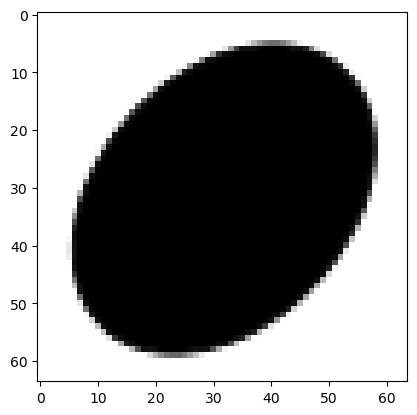

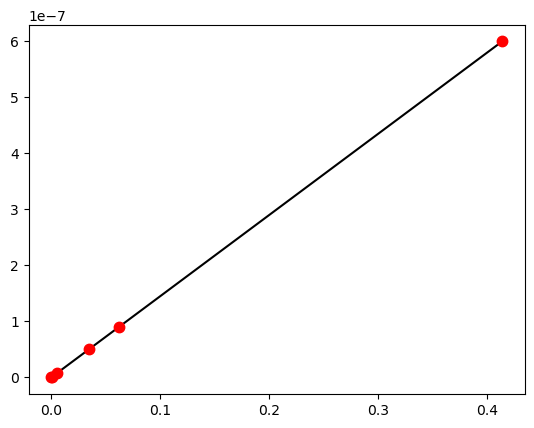

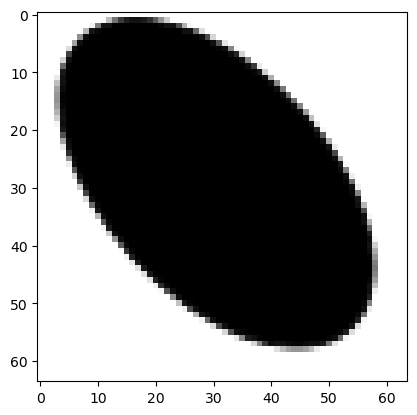

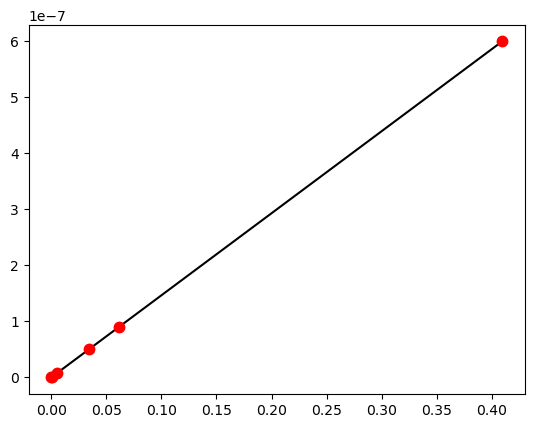

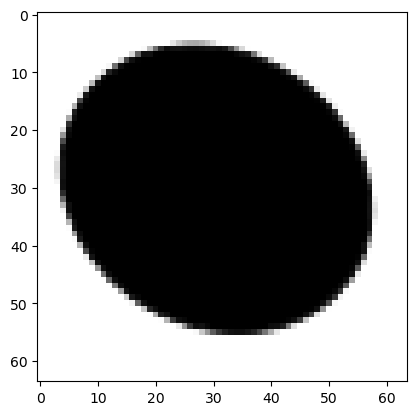

...

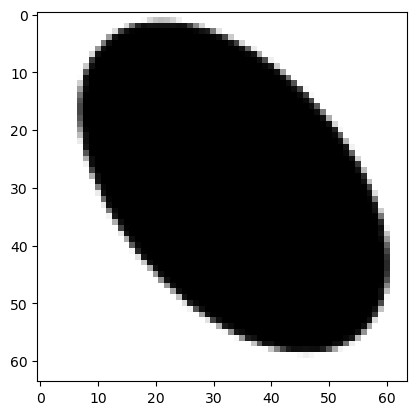

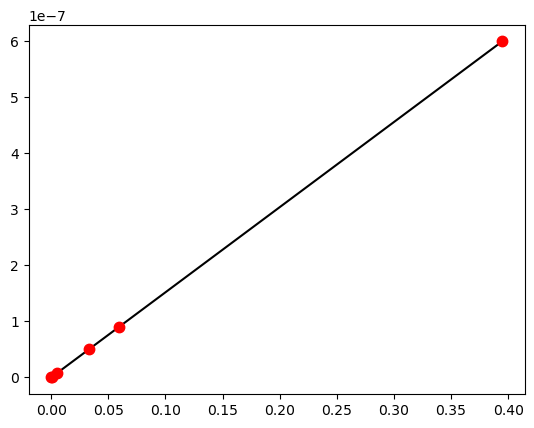

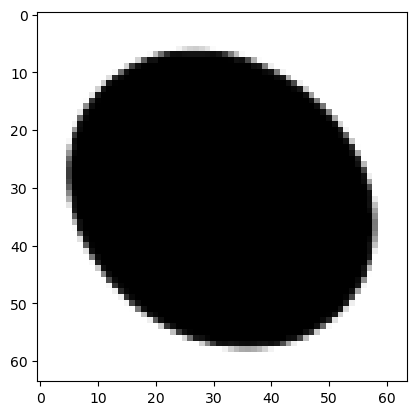

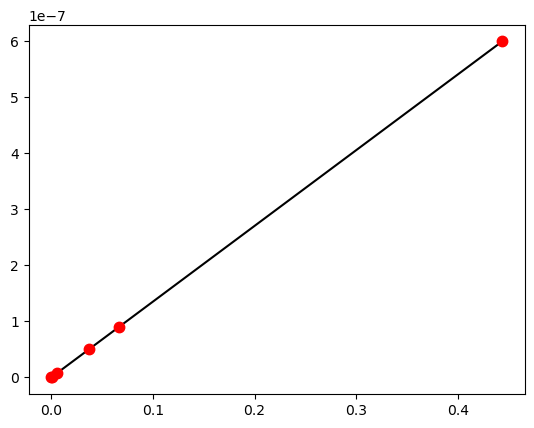

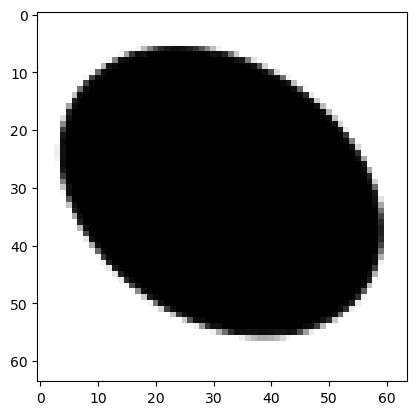

In [23]:
import os
import h5py
import numpy as np
dp_lst = [ 0.0000006,.00000005,0.00000009,
       0.000000001, 
       0.000000008]

batch_size,nz=128,100
from collections import defaultdict

permu_dict = defaultdict(lambda: numpy.zeros(64,64))

folder_path = 'training_images_0255_1_decmial_class_imbalance_problem_with_m=1'


for filename in os.listdir(folder_path):
    if filename.endswith('.hdf5'):
        file_path = os.path.join(folder_path, filename)
        with h5py.File(file_path, 'r') as f:
            # extract the dataset from the HDF5 file
            data_array = f['data'][()]
            # convert the dataset to a NumPy array
            
            # do something with the array
            #print('The porousity of the generated image is ', porousity)
            porousity_extracted,x,y=contour_retriever(data_array)
            print('The porousity after extraction is',porousity_extracted)
            bounds_x= {'actual': {'lower': 0, 'upper': 64}, 'desired': {'lower': -0.5, 'upper': 0.499}}
            bounds_y= {'actual': {'lower': 0, 'upper': 64}, 'desired': {'lower': -0.5, 'upper': 0.499}}
            #########################################################################################
            ## Not every contour extracted is fit for training, only those meeting the following conditions are retained and added to 
            ## dataset
            if porousity_extracted>0.4 and porousity_extracted<0.6:

                print('the original max values of x and y are',(max(x),max(y)))
                x_norm=normalize(x,bounds_x)
                y_norm=normalize(y,bounds_y)
                standard=np.column_stack((x_norm,y_norm))
                gen_coords=standard[::-1]
                #np.savetxt('shapes/coords_gen/final_check',standard_rev,delimiter=' ')


                ################################################################################

                permu=permeability_finder(gen_coords,mu,dp_lst,6)
                permu_dict[str(permu)]=data_array

            
            #del segmented_image
            #del fake_image
            del x,y
            del data_array


<AxesSubplot:ylabel='Count'>

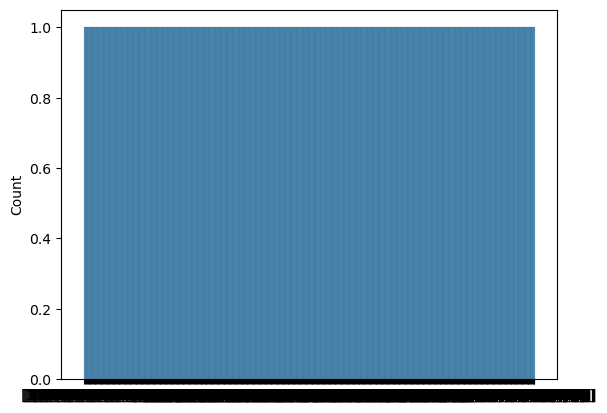

In [43]:
import re
labels=list(permu_dict.keys())
#perm_br=[float(re.sub(r"[\[\]]",'',elem)) for elem in perm]
#labels=[np.log(float(elem)) for elem in perm_br]
images=list(permu_dict.values())
images_array=np.array(images)

import seaborn as sns
sns.histplot(labels)

In [44]:
labels=[ np.log(float(re.sub(r"[\[\]]",'',elem))) for elem in labels]

<AxesSubplot:ylabel='Count'>

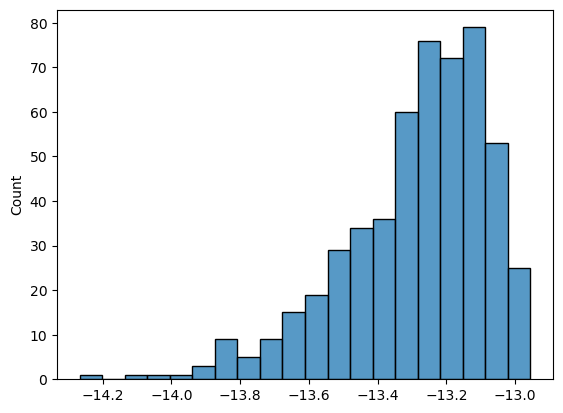

In [45]:
np.unique(labels)
sns.histplot(labels)

In [27]:
np.unique(images[0])

array([  0,   1,   2,   3,   4,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  23,  25,  26,  27,  28,
        31,  34,  37,  42,  43,  48,  50,  51,  54,  56,  58,  59,  60,
        62,  68,  69,  74,  76,  77,  78,  80,  81,  83,  84,  85,  89,
        90,  91,  92, 103, 105, 108, 111, 113, 119, 120, 121, 123, 125,
       126, 132, 133, 136, 137, 138, 140, 144, 146, 149, 155, 156, 157,
       161, 164, 165, 168, 169, 170, 171, 174, 176, 180, 184, 187, 188,
       189, 190, 193, 197, 198, 199, 200, 202, 203, 209, 212, 216, 217,
       218, 219, 222, 224, 228, 229, 230, 231, 232, 234, 236, 238, 240,
       241, 242, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255])

In [59]:
min(labels),max(labels)

(-14.500152137920107, -12.910465635833821)

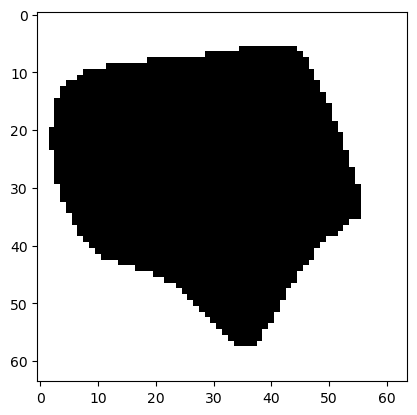

In [50]:
plt.imshow(images[0].reshape(64,64),cmap='gray')

In [29]:
images_list=[image.reshape(1,64,64) for image in images]
images=np.array(images_list)

In [36]:
labels=[round(label,2) for label in labels]

In [38]:
labels=[(label) for label in labels]

In [39]:
labels[0]

13.23

In [19]:
cd ..

/DATA3/mahadev


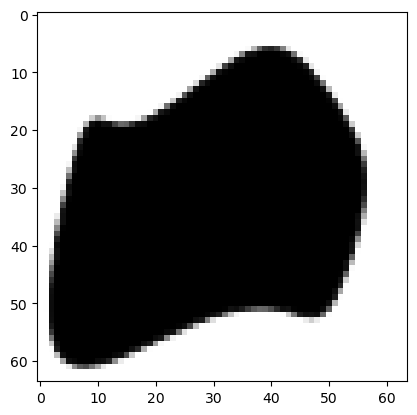

In [22]:
plt.imshow(images[8].reshape(64,64),cmap='gray')

In [41]:
import h5py
import numpy as np

# Define the file path for the new h5 file
file_path = "./ccgan/improved_CcGAN-master/SteeringAngle/SteeringAngle_64x64/CcGAN-improved/datasets/data_imbalance_ccgan_dataset_with2_digit_pos_0_255.h5"

# Generate some example image and label data
#images = np.random.rand(100, 64, 64, 3)
#labels = np.random.randint(0, 10, size=(100,))

# Create a new h5 file and write the image and label data
with h5py.File(file_path, "w") as f:
    f.create_dataset("images", data=images_clean)
    f.create_dataset("labels", data=labels_clean)


In [34]:
import math
perm=list(permu_dict.keys())
print(len(perm))
perm_br=[float(re.sub(r"[\[\]]",'',elem)) for elem in perm]
labels=[np.log(float(elem)) for elem in perm_br]
cleaned_dict = {}
for key, value in permu_dict.items():
    #print(key,value)
    new_key=np.log(float(re.sub(r"[\[\]]",'',key)))
    if not math.isnan(new_key):
        cleaned_dict[new_key] = value
print(len(list(cleaned_dict.keys())))

8503
8502


/tmp/ipykernel_3448311/1565331632.py:5: RuntimeWarning: invalid value encountered in log
  labels=[np.log(float(elem)) for elem in perm_br]
/tmp/ipykernel_3448311/1565331632.py:9: RuntimeWarning: invalid value encountered in log
  new_key=np.log(float(re.sub(r"[\[\]]",'',key)))


In [35]:
print(len(cleaned_dict))

8502


In [ ]:
# def statistics_train(segmented_image):
#     image=segmented_image.reshape(128,128)
#     white_pixels=np.sum(image==1)
#     black_pixels=np.sum(image==0)
#     porousity=black_pixels/(white_pixels+black_pixels)
#     return porousity


b_size,nz=128,100
noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
fake = netG(noise)
img_gen=fake[5,:,:,:].reshape(128,128).cpu().detach().numpy()
img_pro=post_processing(img_gen)
plt.imshow(img_pro,cmap='gray')

############################################
porousity,x,y=contour_retriever(img_pro)
plt.plot(x,y)
plt.ylim([0,128])
plt.xlim([0,128])
print('porousity after extraction is', porousity)

In [ ]:
def statistics_train(segmented_image):
    image=segmented_image.reshape(128,128)
    white_pixels=np.sum(image==1)
    black_pixels=np.sum(image==0)
    porousity=black_pixels/(white_pixels+black_pixels)
    return porousity


b_size,nz=128,100
noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
fake = netG(noise)
img_gen=fake[5,:,:,:].reshape(128,128).cpu().detach().numpy()
img_pro=post_processing(img_gen)
plt.imshow(img_pro,cmap='gray')

############################################
porousity,x,y=contour_retriever(img_pro)
plt.plot(x,y)
plt.ylim([0,128])
plt.xlim([0,128])
print('porousity after extraction is', porousity)

In [ ]:
figure=plt.figure()
plt.plot(x,y)
plt.xlim([0,128])
plt.ylim([0,128])

bounds_x= {'actual': {'lower': 0, 'upper': 128}, 'desired': {'lower': -0.5, 'upper': 0.495}}
bounds_y= {'actual': {'lower': 0, 'upper': 128}, 'desired': {'lower': -0.5, 'upper': 0.495}}
print('the original max values of x and y are',(max(x),max(y)))
x_norm=normalize(x,bounds_x)
y_norm=normalize(y,bounds_y)
standard=np.column_stack((x_norm,y_norm))
standard_rev=standard[::-1]
np.savetxt('shapes/coords_gen/final_check',standard_rev,delimiter=' ')
figure2=plt.figure()
plt.plot(x_norm,y_norm)
plt.ylim([-0.5,0.5])
plt.xlim([-0.5,0.5])
print('the max and min values are {},{},{},{}'.format(max(x_norm),max(y_norm),min(x_norm),min(y_norm)))
porousity=np.trapz(y_norm,x_norm)
print(porousity)


In [ ]:
## create function which could give permeability by calling one function
mu=0.00000005
dp_lst=[.0004,.0000005,0.000007,0.0000008]
for dp in dp_lst:
    simulate_flow(dp,'./shapes/coords_gen','final_check')


In [ ]:
cd ..

In [ ]:
def contour_retriever(img_gen):
        porousity_gen=statistics(img_gen)
        img=img_gen.astype(np.uint8)## This is for comparing the input original image and extracted boundaries; It plots original and extracted image side by side.
        #imgray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        #ret,thresh=cv2.threshold(imgray,0,1,cv2.THRESH_BINARY)
        
        print('the porousity before extraction is ',porousity_gen)
        contours,hierarchy=cv2.findContours(img,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
        #edged = cv2.Canny(imgray, 50, 100)
        #edged = cv2.dilate(edged, None, iterations=1)
        #contours,hierarchy=cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        print('number of contours in the image are', len(contours))
        #cv2.imshow('image',img )
        #cv2.waitKey(0)## these are basically for opening a new window for the image
        #cv2.destroyAllWindows()
        #if len(contours)!=2:
            #impad = cv2.copyMakeBorder(img,1,1,1,1,cv2.BORDER_CONSTANT)
            #contours,hierarchy=cv2.findContours(impad,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
            #print('im inside padding with length of contours', len(contours))
        
        x,y=[],[]
        ########
        #for num in range(len(contours)):
            #x=contours[num][:,:,0].reshape(-1)
            #y=contours[num][:,:,1].reshape(-1)
            #y=128-y
            #porousity=abs(np.trapz(y,x)/(128*128))
            #plt.figure()
            #plt.plot(x,y)
            #print('porous of contour {} is {}'.format(num,porousity))
            #if porousity <0.6 and porousity>0.4:
             #   return porousity,x,y
        #return None,None,None
            
            
        
        if len(contours)==2:
            x=contours[1][:,:,0].reshape(-1)
            y=contours[1][:,:,1].reshape(-1)
            y=128-y
        #elif len(contours)==1:
            #x=contours[0][:,:,0].reshape(-1)
            #y=contours[0][:,:,1].reshape(-1)
            #y=128-y
            ##########
            
        porousity=np.trapz(y,x)/(128*128)
        return porousity,x,y
## Checking statistics of generated images, which has pixel in the range of (-1 to 1)(last layer activation of tanh in generator)
def filter_generated_image(batch_size,nz,device,netG):
    noise_test = torch.randn(batch_size, nz, 1, 1, device=device)
    test=netG(noise_test)[np.random.randint(0,127)].reshape(1,128,128)
    #median=MedianPool2d()
    #out_attach=median(test)
    #img1[img1==-1]=0
    test_filtered= median_filter(test.detach().cpu().numpy().reshape(128,128),size=(2,2))
    threshold_global_otsu = 0
    segmented_image= (test_filtered >threshold_global_otsu).astype(np.int32)
    porousity=statistics(segmented_image)
    #test1_final = median_filter(test1_final,size=(3,3))
    return segmented_image,porousity,test
checkpoint=torch.load('my_checkpoints40_final_13_02.pth.tar')
netG.load_state_dict(checkpoint['state_dictG'])
#optimizerG.load_state_dict(checkpoint['optimizerG'])
#netD.load_state_dict(checkpoint['state_dictD'])
#optimizerD.load_state_dict(checkpoint['optimizerD'])
netG.eval()
#netD.eval()


    

In [ ]:

import torch.nn.functional as F
from torch.nn.modules.utils import _pair, _quadruple


class MedianPool2d(nn.Module):
    """ Median pool (usable as median filter when stride=1) module.
    
    Args:
         kernel_size: size of pooling kernel, int or 2-tuple
         stride: pool stride, int or 2-tuple
         padding: pool padding, int or 4-tuple (l, r, t, b) as in pytorch F.pad
         same: override padding and enforce same padding, boolean
    """
    def __init__(self, kernel_size=3, stride=1, padding=(1,1), same=False):
        super(MedianPool2d, self).__init__()
        self.k = _pair(kernel_size)
        self.stride = _pair(stride)
        self.padding = _quadruple(padding)  # convert to l, r, t, b
        self.same = same

    def _padding(self, x):
        if self.same:
            ih, iw = x.size()[2:]
            if ih % self.stride[0] == 0:
                ph = max(self.k[0] - self.stride[0], 0)
            else:
                ph = max(self.k[0] - (ih % self.stride[0]), 0)
            if iw % self.stride[1] == 0:
                pw = max(self.k[1] - self.stride[1], 0)
            else:
                pw = max(self.k[1] - (iw % self.stride[1]), 0)
            pl = pw // 2
            pr = pw - pl
            pt = ph // 2
            pb = ph - pt
            padding = (pl, pr, pt, pb)
        else:
            padding = self.padding
        return padding
    
    def forward(self, x):
        # using existing pytorch functions and tensor ops so that we get autograd, 
        # would likely be more efficient to implement from scratch at C/Cuda level
        x = F.pad(x, self._padding(x), mode='reflect')
        x = x.unfold(2, self.k[0], self.stride[0]).unfold(3, self.k[1], self.stride[1])
        x = x.contiguous().view(x.size()[:4] + (-1,)).median(dim=-1)[0]
        return x
median=MedianPool2d()

In [ ]:
print(img.shape)
median(img)

In [ ]:
img[0,:,:,:].shape

In [ ]:
noise = torch.randn(1, nz, 1, 1, device=device,requires_grad=True)
img=netG(noise)
median=MedianPool2d()
out=median(img[0,:,:,:])
img_post=out.detach().cpu().numpy().reshape(128,128)
img_post=post_processing(img_post)
output=out.sum()
output.backward()
plt.imshow(out.detach().cpu().numpy().reshape(128,128),cmap='gray')
plt.figure()
plt.imshow(img.detach().cpu().numpy().reshape(128,128),cmap='gray')
plt.figure()
plt.imshow(img_post,cmap='gray')

## Preparation of Dataset:
Need to optimize the code by creating functions and them to the module

In [ ]:
## preparation of dataset
# first we extract co-ordinates x,y
# then I have to simulate
# for simulation,  there should be these x,y coords in a particulur location, 
# so I need to store these coords in shapes/coords_gen path with random_name
# we columnstack these x,y coords with delimiter=' ' and then save using save_random,which returns function name ,
# we will use that function name to call simulate flow function
# what should be the pipe line here?
#1)filter_generated_image>> segmented_image, original porousity
#2)contour_retriver>>porousity,x,y: I may face problem here, sometimes no x,y would be enough, so have to use 'continue or exception
# handling here
#3)permeability_finder
#def data_generate_fno()
#dp_lst=[0.0000005,0.000007,0.000000008]
dp_lst = [ 0.0000006,.00000005,0.00000009,
       0.000000001, 
       0.000000008]
#dp_lst=[.00000035]
#dp_lst=[.0000006]
batch_size,nz=128,100
from collections import defaultdict

permu_dict = defaultdict(lambda: numpy.zeros(128,128))
for num in range(2200):

    segmented_image,porousity,fake_image=filter_generated_image(batch_size,nz,device,netG)
    figure=plt.figure()
    plt.imshow(segemented_image,cmap='gray')
   

    print('The porousity of the generated image is ', porousity)
    porousity_extracted,x,y=contour_retriever(segmented_image)
    print('The porousity after extraction is',porousity_extracted)
    bounds_x= {'actual': {'lower': 0, 'upper': 128}, 'desired': {'lower': -0.5, 'upper': 0.499}}
    bounds_y= {'actual': {'lower': 0, 'upper': 128}, 'desired': {'lower': -0.5, 'upper': 0.499}}
    #########################################################################################
    ## Not every contour extracted is fit for training, only those meeting the following conditions are retained and added to 
    ## dataset
    if porousity_extracted>0.4 and porousity_extracted<0.6:
        
        print('the original max values of x and y are',(max(x),max(y)))
        x_norm=normalize(x,bounds_x)
        y_norm=normalize(y,bounds_y)
        standard=np.column_stack((x_norm,y_norm))
        gen_coords=standard[::-1]
        #np.savetxt('shapes/coords_gen/final_check',standard_rev,delimiter=' ')


        ################################################################################
        
        permu=permeability_finder(gen_coords,mu,dp_lst,6)
        permu_dict[str(permu)]=fake_image


In [ ]:
## preparation of dataset
# first we extract co-ordinates x,y
# then I have to simulate
# for simulation,  there should be these x,y coords in a particulur location, 
# so I need to store these coords in shapes/coords_gen path with random_name
# we columnstack these x,y coords with delimiter=' ' and then save using save_random,which returns function name ,
# we will use that function name to call simulate flow function
# what should be the pipe line here?
#1)filter_generated_image>> segmented_image, original porousity
#2)contour_retriver>>porousity,x,y: I may face problem here, sometimes no x,y would be enough, so have to use 'continue or exception
# handling here
#3)permeability_finder
#def data_generate_fno()
#dp_lst=[0.0000005,0.000007,0.000000008]
dp_lst = [ 0.0000006,.00000005,0.00000009,
       0.000000001, 
       0.000000008]

batch_size,nz=128,100
from collections import defaultdict

permu_dict = defaultdict(lambda: numpy.zeros(128,128))
for num in range(1000):

    segmented_image,porousity,fake_image=filter_generated_image(batch_size,nz,device,netG)
    figure=plt.figure()
    plt.imshow(segmented_image,cmap='gray')
   

    print('The porousity of the generated image is ', porousity)
    porousity_extracted,x,y=contour_retriever(segmented_image)
    print('The porousity after extraction is',porousity_extracted)
    bounds_x= {'actual': {'lower': 0, 'upper': 128}, 'desired': {'lower': -0.5, 'upper': 0.499}}
    bounds_y= {'actual': {'lower': 0, 'upper': 128}, 'desired': {'lower': -0.5, 'upper': 0.499}}
    #########################################################################################
    ## Not every contour extracted is fit for training, only those meeting the following conditions are retained and added to 
    ## dataset
    if porousity_extracted>0.4 and porousity_extracted<0.6:
        
        print('the original max values of x and y are',(max(x),max(y)))
        x_norm=normalize(x,bounds_x)
        y_norm=normalize(y,bounds_y)
        standard=np.column_stack((x_norm,y_norm))
        gen_coords=standard[::-1]
        #np.savetxt('shapes/coords_gen/final_check',standard_rev,delimiter=' ')


        ################################################################################
        
        permu=permeability_finder(gen_coords,mu,dp_lst,6)
        permu_dict[str(permu)]=fake_image


In [ ]:
len(list(permu_dict.keys()))

In [ ]:
import re

string_with_brackets = "[This is ]a [string with brackets]"

string_without_brackets = re.sub(r"[\[\]]",'',string_with_brackets)
permu_float=[ for elem in permu_dict.keys()]

In [ ]:
import pickle
  

dataset_file = open('fno_dataset_with_median_filter', 'wb')
pickle.dump(dict(permu_dict),dataset_file)
dataset_file.close()



In [ ]:
with open('final_fno_dataset.pkl','rb') as file_handle:
    permu_load=pickle.load(file_handle)
    print(permu_load)

In [ ]:
import json

with open('my_dict.json', 'w') as f:
    json.dump(dict(permu_dict), f)

In [ ]:
f = open("dict.txt","w")

# write file
f.write( str(permu_dict) )

# close file
f.close()


In [37]:
labels=list(cleaned_dict.keys())
labels

[-13.500380759539794,
 -13.255788547099279,
 -13.27363708385778,
 -13.581171107285071,
 -13.244158329420655,
 -13.5052185817186,
 -13.376011117885012,
 -13.663327504072495,
 -13.170472305167982,
 -13.121861658286416,
 -13.36750996100611,
 -13.309152446687856,
 -13.288542367347322,
 -13.659712193458121,
 -13.154357551006793,
 -13.122286760339492,
 -13.371864539931396,
 -13.161768912036047,
 -13.560900440881127,
 -13.327069718474212,
 -13.30072188147582,
 -13.584731439926157,
 -13.503993352647926,
 -13.373044647600699,
 -13.337930552080062,
 -13.589260086130002,
 -13.60376039348786,
 -13.411939108362823,
 -13.372663201284686,
 -13.206107111685457,
 -13.41941907870052,
 -13.137182063792967,
 -13.438713382906146,
 -13.529904496432732,
 -13.783619496971241,
 -13.187775501355075,
 -13.247767389698359,
 -13.149694970668143,
 -13.114009225708188,
 -13.182914934390062,
 -13.241132538497615,
 -13.094076150262131,
 -13.492157980357993,
 -14.33214765400405,
 -13.39932302770321,
 -13.08987538883839

In [40]:
images=list(cleaned_dict.values())
labels_clean=list(cleaned_dict.keys())
#labels_clean=[float(re.sub(r"[\[\]]",'',elem)) for elem in labels]
images_clean=np.array(images)
images_list=[image.reshape(1,64,64) for image in images_clean]
images_clean=np.array(images_list)

In [ ]:
print(images_tens.shape)
print(labels.shape)
print(type(labels))
print(type(labels[0].dtype))

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(images_tens,labels,test_size=.3,random_state=42,shuffle=True)
x_train=x_train[:1200,:,:]
x_test=x_test[:300,:,:]
y_train=y_train[:1200]
y_test=y_test[:300]

In [ ]:
print(x_train.shape,y_train.shape,x_test.shape,y_test.shape)

In [ ]:
#permu_float_2=[float(elem) for elem in permu_float]


sns.set(style="darkgrid")
sns.histplot(y_train)
plt.xlabel('Darcy permeability of porous medium in m^2')
plt.ylabel('The count of images for given permeability')
plt.show()
print('The mean porousity of the images is {}'.format(np.mean(permu_float_2)))
print('The standard deviation of the images is {}'.format(np.std(permu_float_2)))

In [ ]:
from collections import defaultdict
dataset_dict=defautdict(list)
for index,key,value in enumerate(permu_dict.items()):
    key=re.sub(r"[\[\]]",'',key)
    dataset_dict[index]=key
    

In [ ]:
## converting dictionery file to csv file
import pandas as pd
pd.DataFrame.from_dict(permu_dict)

In [ ]:
ans=dict(permu_dict)
for key,values in ans.items():
    plt.figure()
    plt.imshow(values,cmap='gray')
    plt.grid('on')
    plt.title(key)

In [ ]:
## now I'm done with the extraction, how can i generate dataset for fno now?
# let's say I want to create dataset of 6400 training images , pairs of these images and permeability value
## first find the permeability value of the above image and then decide

In [ ]:
### simulating: CHECK whether it converts co-ords to shape.gts object or not.
!tail -n +1 shapes/coords_gen/final_check | shapes ->anna_bond.gts


In [ ]:
!vim anna_bond.gts

In [ ]:
cd shapes/coords_gen

In [ ]:
fle=np.loadtxt('shapes/coords_gen/anna_bond_gerris')

fle_name=standardize(fle)
np.savetxt('shapes/coords_gen/anna_bond_gerris_standardized',fle_name,delimiter=' ')
x,y=fle_name.T
print(np.unique(list(zip(x,y))))
plt.plot(x,y,clip_on=False)
print('the area is ',(np.trapz(y,x)/(1)))
print(len(list(zip(x,y))))

In [ ]:
data=np.loadtxt('shapes/coords_gen/final_check')
x_ret,y_ret=data.T
plt.plot(x_ret,y_ret)
print(len(x))

In [ ]:
## the problem is standardizing , we are limiting to 0.5 , some value would become 0.5 for sure: modify standardize function; see whether it works
def standardize(data):
# create scaler
    scaler = MinMaxScaler(feature_range=(-.3,0.3))
    # fit scaler on data
    scaler.fit(data)
    # apply transform
    normalized = scaler.transform(data)
    return normalized

In [ ]:
data=np.loadtxt('shapes/coords_gen/final_check')
x0,y0=data.T
data1=np.loadtxt('shapes/coords_gen/anna_bond_gerris_standardized')
x1,y1=data1.T

fig, axs = plt.subplots(1, 2, figsize=(9, 3), sharey=True)
axs[0].plot(x0,y0)
axs[1].plot(x1,y1)
axs[1].set_title('standardized with 0.3')
print('the len of my and standardized are ',(len(x0),len(x1)))
print('the max value of standardized 0.3 is ',(max(x1),max(y1)))

fig.suptitle('problem solve madu')

In [ ]:
cd ..

In [ ]:
len(x)

In [ ]:
cd ..

In [ ]:
max(x)

max(x)

In [ ]:
def permeability_finder(gen_coords,mu,dp_lst):
    name=save_random(gen_coords)
    for dp in dp_lst:
        
        
        simulate_flow(dp,'./shapes/coords_gen',name)
        average_velocities(name)
        permeability=compute_permeabilities(mu,order=2,points=4)
    return permeability

In [ ]:
mu=0.00000005

print(permeability_finder(gen_coords,mu,dp_lst))

In [ ]:
simulate_flow(.000009,'./shapes/coords_gen','bond')
!pwd

In [ ]:
u=1.     #x-position of the center
v=0.5    #y-position of the center
a=2.     #radius on the x-axis
b=1.5    #radius on the y-axis
pi=np.pi
t = np.linspace(0, 2*pi, 100)
x,y= u+a*np.cos(t) , v+b*np.sin(t) 
dat=np.column_stack((x,y))
np.savetxt('shapes/coords_gen/smooth_fle',dat,delimiter=' ')



In [ ]:
simulate_flow(.000009,'./shapes/coords_gen','smooth_fle')
!pwd

In [ ]:
simulate_flow(.000009,'./shapes/coords_gen','smooth_fle')
!pwd

In [ ]:
label = torch.full((128,1), real_label, dtype=torch.float, device=device)
label.shape

In [ ]:
cd ..

In [ ]:
checkpoint=torch.load('my_checkpoints35_old_reliable.pth.tar')
netG.load_state_dict(checkpoint['state_dictG'])
optimizerG.load_state_dict(checkpoint['optimizerG'])
netD.load_state_dict(checkpoint['state_dictD'])
optimizerD.load_state_dict(checkpoint['optimizerD'])
netG.eval()
netD.eval()

In [ ]:
img_gen,porousity=filter_generated_image(batch_size,nz)


In [ ]:
test_filtered

In [ ]:
#imgray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh=cv2.threshold(img,0,1,cv2.THRESH_BINARY)
contours,hierarchy=cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)

In [ ]:
def contour_extractor(img):## returns the x and y co-ordinates of the boundaries of the image with origin at left bottom.(img_matrix has different reference)
    imgray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret,thresh=cv2.threshold(imgray,0,1,cv2.THRESH_BINARY)
    contours,hierarchy=cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
    x=contours[1][:,:,0].reshape(-1)
    y_rev=contours[1][:,:,1].reshape(-1)
    y=500-y_rev ## to account for the difference in imshow image pixels matrix and numpy plots
    return x,y 

In [ ]:
load_checkpoint(torch.load('my_checkpoints35.pth.tar'))
#my_checkpoints35.pth.tar

In [ ]:
#checkpoint={'state_dictG':netG.state_dict(),'optimizerG':optimizerG.state_dict(),'state_dictD':netD.state_dict(),'optimizerD':optimizerD.state_dict()}
        
#save_checkpoint(checkpoint,'40_epoch_working')

In [ ]:
#for param in netG.parameters():
  #  if param.requires_grad:
    #    print(param.data)
        

In [ ]:
#torch.save(netG.state_dict(), str(opt.out_dir_model)+'/netG_epoch_{}.pth'.format(epoch))
#torch.save(netD.state_dict(), str(opt.out_dir_model)+'/netD_epoch_{}.pth'.format(epoch))
#torch.save(optimizerG.state_dict(), str(opt.out_dir_model)+'/optimG_epoch_{}.pth'.format(epoch))
#torch.save(optimizerD.state_dict(), str(opt.out_dir_model)+'/optimD_epoch_{}.pth'.format(epoch))


# Plot the Generator and discriminator loss with number of iterations(1 iteration=1 batch update)


In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()



**Visualization of G’s progression**

Remember how we saved the generator’s output on the fixed_noise batch
after every epoch of training. Now, we can visualize the training
progression of G with an animation. Press the play button to start the
animation.




In [ ]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)),animated=True,cmap='Greys')] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=100, blit=True)

HTML(ani.to_jshtml())

In [ ]:
# plotting a set of generated images

**Real Images vs. Fake Images**

Finally, lets take a look at some real images and fake images side by
side.




In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[1].to(device)[:128], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[0],(1,2,0)),cmap='Greys')
plt.show()

### plotting the array of Generated images

In [ ]:
plot_Array_generated_images(20)

In [ ]:
## Checking statistics of generated images, which has pixel in the range of (-1 to 1)(last layer activation of tanh in generator)
def filter_generated_image(batch_size,nz,device,netG):
    noise_test = torch.randn(batch_size, nz, 1, 1, device=device)
    test=netG(noise_test).cpu().detach().numpy()[np.random.randint(0,127)].reshape(128,128)
    #img1[img1==-1]=0
    test_filtered= median_filter(test,size=(2,2))
    threshold_global_otsu = 0
    segmented_image= (test_filtered >threshold_global_otsu).astype(np.int32)
    porousity=statistics(segmented_image)
    #test1_final = median_filter(test1_final,size=(3,3))
    return segmented_image,porousity
stats_test_lst=[]
for index in range(50): ##50 so because 50*128=6400
    gen_image,porousity = filter_generated_image(128,100,device,netG) ## Generator generated images are not binary, they have values ranging from -1 to 1 due to tanh function at the last layer, so it needs filtering   
    for index in range(128):
        stats_test_lst.append(statistics(gen_image))



In [ ]:
## comparing the data generated
noise_test = torch.randn(batch_size, nz, 1, 1, device=device)
test=netG(noise_test).cpu().detach().numpy()[np.random.randint(0,127)].reshape(128,128)
plt.figure()
sns.histplot(test.reshape(-1))
plt.figure()
test_filtered= median_filter(test,size=(2,2))
threshold_global_otsu = 0
segmented_image= (test_filtered >threshold_global_otsu).astype(np.int32)
sns.histplot(segmented_image.reshape(-1))

In [ ]:
statistics_plot(stats_test_lst)

In [ ]:
## checking the gradients magnitude to see whether any of the gradients are crossing 100, which corresponds to failure.
total_norm = []
parameters = [p for p in netG.parameters() if p.grad is not None and p.requires_grad]
for p in parameters:
    param_norm = p.grad.detach().data.norm(2)
    total_norm.append(param_norm)

print('The gradients for the generator as follows {}'.format(total_norm))


In [ ]:
#torch.save(netG,'model_2ndtest_after_intializationwitholdparams.pt')

In [ ]:
## looking at the parameters
for param_tensor in netG.state_dict():
    print(param_tensor,'/\t',netG.state_dict()[param_tensor].size())

In [ ]:

#model2_test=torch.load('model_2ndtest_after_intializationwitholdparams.pt')
#model2_test.eval()


In [ ]:
total_norm_for_discriminator= []
parameters = [p1 for p1 in netD.parameters() if p1.grad is not None and p1.requires_grad]
for p1 in parameters:
    param_norm = p1.grad.detach().data.norm(2)
    total_norm_for_discriminator.append(param_norm)

print('The gradients for the generator as follows {}'.format(total_norm_for_discriminator))


In [ ]:
# Things to do now
# increase the number of epochs : i see that noise is getting damped with increase in iterations
# increase the size of datasets here . im only doing with 1276, where lukas mosser have done with 3660 average. atleast make it upto 3500
# label smoothening have done ; left with adding noise to inputs here ans somehow will do now. 
## you have checked for exploding gradients nothing to worry about it , its all below 100
# Gan are very unstable during training; you could see lot of spikes and whatver there too. in order to find optimal hyperparameteres, its a tedious task to go through number of iterations , in order to curb fraction of it ; we can do one end label smoothening and adding white noise ; now i will look upon this ;
# i have increased the number of epochs let see what i got here.

#epochs 50 seems to be a good choice


In [ ]:
# information about the hyperparameters here
# first its trained with learning rate of 0.0002 for 200 epochs and then again, with that parameters as intial parameters it was trained for 100 more epochs with learning rate 1/10th of previous one
#reallabel0.9
# the number of training images were 5743, which were generated using the stride of 20 
# in colormap,image plot its important to keep cmap as "Greys"

# Countering stochasticity and making model reproducible

In [ ]:
#https://opendatascience.com/properly-setting-the-random-seed-in-ml-experiments-not-as-simple-as-you-might-imagine/
#https://towardsdatascience.com/reproducible-model-training-deep-dive-2a4988d69031